https://towardsdatascience.com/sell-out-sell-in-forecasting-45637005d6ee

In [1]:
!git clone https://github.com/BartoszSzablowski/Sell_Out_Sell_In_Forecasting.git

Cloning into 'Sell_Out_Sell_In_Forecasting'...
remote: Enumerating objects: 109, done.
remote: Counting objects: 100% (15/15), done.
remote: Compressing objects: 100% (15/15), done.
remote: Total 109 (delta 5), reused 0 (delta 0), pack-reused 94
Receiving objects: 100% (109/109), 78.62 MiB | 10.54 MiB/s, done.
Resolving deltas: 100% (7/7), done.


In [2]:
!ls -GFlash --color ./

total 20K
4.0K drwxr-xr-x 1 root 4.0K May 10 08:30 ./
4.0K drwxr-xr-x 1 root 4.0K May 10 08:24 ../
4.0K drwxr-xr-x 4 root 4.0K May  8 13:36 .config/
4.0K drwxr-xr-x 1 root 4.0K May  8 13:37 sample_data/
4.0K drwxr-xr-x 4 root 4.0K May 10 08:30 Sell_Out_Sell_In_Forecasting/


In [3]:
!ls -GFlash --color ./Sell_Out_Sell_In_Forecasting/

total 7.2M
4.0K drwxr-xr-x 4 root 4.0K May 10 08:30 ./
4.0K drwxr-xr-x 1 root 4.0K May 10 08:30 ../
4.0K drwxr-xr-x 8 root 4.0K May 10 08:30 .git/
4.0K drwxr-xr-x 2 root 4.0K May 10 08:30 graphics/
500K -rw-r--r-- 1 root 498K May 10 08:30 History_SellIn_SellOut.csv
 32K -rw-r--r-- 1 root  30K May 10 08:30 own_functions.py
4.0K -rw-r--r-- 1 root  604 May 10 08:30 README.md
6.7M -rw-r--r-- 1 root 6.7M May 10 08:30 SellOut_SellIn_Forecast.ipynb


In [4]:
!head ./Sell_Out_Sell_In_Forecasting/History_SellIn_SellOut.csv

PERIOD_TAG;product_group;customer_name;dispatches_SellIn;orders_SellIn;Sellout;numeric_distribution_selling_promotion;type_promo_1;type_promo_2
2016-08-07;Product_01;Customer_01;130;130;0.0;0.0;0.0;0.0
2016-08-14;Product_01;Customer_01;4;5;102.27403920757254;0.1;0.0;0.0
2016-08-21;Product_01;Customer_01;130;130;93.38064449387059;0.0;0.0;0.0
2016-08-28;Product_01;Customer_01;61;61;101.1623648683598;0.0;0.0;0.0
2016-09-04;Product_01;Customer_01;57;58;120.06082863497646;0.1;0.0;0.0
2016-09-11;Product_01;Customer_01;132;132;202.3247297367196;3.3000000000000003;1.0;1.0
2016-09-18;Product_01;Customer_01;131;131;110.05575958206175;0.0;0.0;0.0
2016-09-25;Product_01;Customer_01;260;260;106.72073656442353;0.5;0.0;0.0
2016-10-02;Product_01;Customer_01;0;0;122.28417731340195;0.5;0.0;0.0


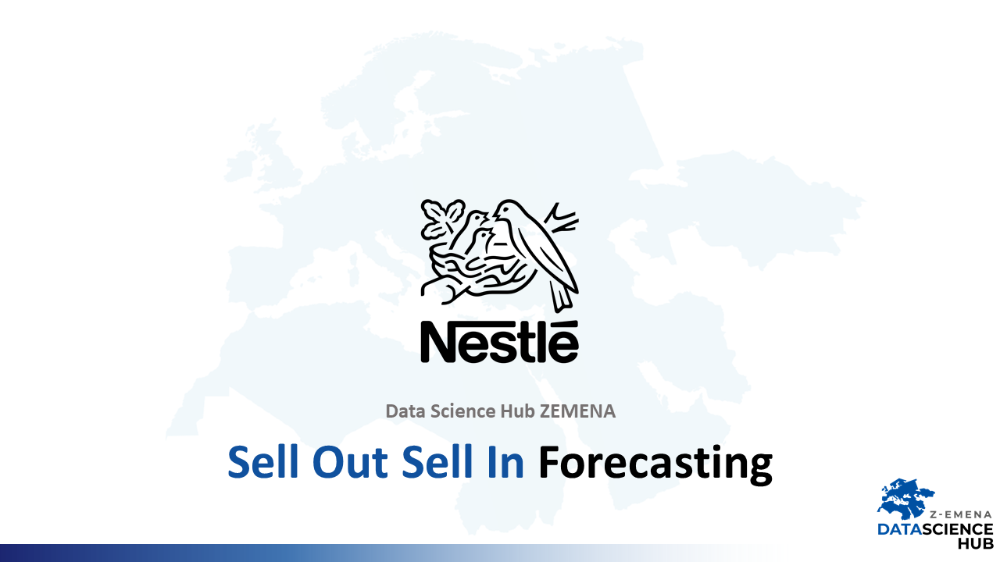

In [5]:
from IPython.display import Image
Image('./Sell_Out_Sell_In_Forecasting/graphics/01_Intro.png')

# 1. Import libraries

In [6]:
!pip install shap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 572.6/572.6 kB 12.6 MB/s eta 0:00:00


In [7]:
!ls -GFlash --color ./Sell_Out_Sell_In_Forecasting/

total 7.2M
4.0K drwxr-xr-x 4 root 4.0K May 10 08:30 ./
4.0K drwxr-xr-x 1 root 4.0K May 10 08:30 ../
4.0K drwxr-xr-x 8 root 4.0K May 10 08:30 .git/
4.0K drwxr-xr-x 2 root 4.0K May 10 08:30 graphics/
500K -rw-r--r-- 1 root 498K May 10 08:30 History_SellIn_SellOut.csv
 32K -rw-r--r-- 1 root  30K May 10 08:30 own_functions.py
4.0K -rw-r--r-- 1 root  604 May 10 08:30 README.md
6.7M -rw-r--r-- 1 root 6.7M May 10 08:30 SellOut_SellIn_Forecast.ipynb


In [8]:
!python3 ./Sell_Out_Sell_In_Forecasting/own_functions.py --help
!cat ./Sell_Out_Sell_In_Forecasting/own_functions.py

# data manipulation
import numpy as np
import pandas as pd
from math import sqrt

# data visualization
import matplotlib.pyplot as plt

# pipeline
from imblearn.pipeline import Pipeline
from sklearn.base import BaseEstimator, TransformerMixin

# model evaluation
from sklearn.metrics import mean_squared_error

# plot products
def plot_products(df, num):
    products = df.groupby('product_group')['dispatches_SellIn'].sum().sort_values(ascending=False).index.tolist()
    for product in products[:num]:
        single_product = df.loc[df['product_group']==product, :].copy()
        
        fig = plt.figure(facecolor = 'white', figsize = (16, 6))
        fig.suptitle(product, fontsize=16)
        fig.subplots_adjust(hspace=0.15, wspace=0.15)
        spec = fig.add_gridspec(ncols=1, nrows=4, height_ratios=[1, 1, 1, 1])
        
        # Plot Sell In Orders
        ax = fig.add_subplot(spec[0])
        ax.get_xaxis().set_visible(False)
        ax.plot(single_product['PERIOD_TAG'], single_pro

In [9]:
# data manipulation
import numpy as np
import pandas as pd
from math import sqrt

# data visualization
import matplotlib.pyplot as plt

# pipeline
from imblearn.pipeline import Pipeline
from sklearn.base import BaseEstimator, TransformerMixin

# model evaluation
from sklearn.metrics import mean_squared_error

# plot products
def plot_products(df, num):
    products = df.groupby('product_group')['dispatches_SellIn'].sum().sort_values(ascending=False).index.tolist()
    for product in products[:num]:
        single_product = df.loc[df['product_group']==product, :].copy()
        
        fig = plt.figure(facecolor = 'white', figsize = (16, 6))
        fig.suptitle(product, fontsize=16)
        fig.subplots_adjust(hspace=0.15, wspace=0.15)
        spec = fig.add_gridspec(ncols=1, nrows=4, height_ratios=[1, 1, 1, 1])
        
        # Plot Sell In Orders
        ax = fig.add_subplot(spec[0])
        ax.get_xaxis().set_visible(False)
        ax.plot(single_product['PERIOD_TAG'], single_product['orders_SellIn'], label = 'Sell In - Orders',
                color='green')
        ax.set_xlim(df['PERIOD_TAG'].min(), df['PERIOD_TAG'].max())
        ax.set_ylim(0, np.max([single_product['dispatches_SellIn'].max(),
                               single_product['orders_SellIn'].max(), 
                               single_product['Sellout'].max()]))
        plt.legend(loc='upper left')
        
        # Plot Sell In Orders + Sell Out
        ax = fig.add_subplot(spec[1])
        ax.get_xaxis().set_visible(False)
        ax.plot(single_product['PERIOD_TAG'], single_product['orders_SellIn'], label = 'Sell In - Orders',
                color='green')
        ax.plot(single_product['PERIOD_TAG'], single_product['Sellout'], label = 'Sell Out',
                color='black')
        
        ax.set_xlim(df['PERIOD_TAG'].min(), df['PERIOD_TAG'].max())
        ax.set_ylim(0, np.max([single_product['dispatches_SellIn'].max(),
                               single_product['orders_SellIn'].max(), 
                               single_product['Sellout'].max()]))
        plt.legend(loc='upper left')
        
        # Plot Sell In Orders + Sell In Dispatches + Sell Out
        ax = fig.add_subplot(spec[2])
        ax.get_xaxis().set_visible(False)
        ax.plot(single_product['PERIOD_TAG'], single_product['dispatches_SellIn'], label = 'Sell In - Dispatches',
                color='red')
        ax.plot(single_product['PERIOD_TAG'], single_product['orders_SellIn'], label = 'Sell In - Orders',
                color='green')
        ax.plot(single_product['PERIOD_TAG'], single_product['Sellout'], label = 'Sell Out',
                color='black')
        
        ax.set_xlim(df['PERIOD_TAG'].min(), df['PERIOD_TAG'].max())
        ax.set_ylim(0, np.max([single_product['dispatches_SellIn'].max(),
                               single_product['orders_SellIn'].max(), 
                               single_product['Sellout'].max()]))
        plt.legend(loc='upper left')
        
        # Plot Sell Out + Promo
        ax = fig.add_subplot(spec[3])
        ax.plot(single_product['PERIOD_TAG'], single_product['Sellout'], label = 'Sell Out',
                color='black')
        ax.set_xlim(df['PERIOD_TAG'].min(), df['PERIOD_TAG'].max())
        ax.set_ylim(0, np.max([single_product['dispatches_SellIn'].max(),
                               single_product['orders_SellIn'].max(), 
                               single_product['Sellout'].max()]))
        plt.legend(loc='upper left')
        ax2=ax.twinx()
        ax2.plot(single_product['PERIOD_TAG'], single_product['numeric_distribution_selling_promotion'],
                label = 'Distribution promo',
                color='blue')
        ax2.scatter(single_product.loc[single_product['type_promo_1']>0, 'PERIOD_TAG'],
                    single_product.loc[single_product['type_promo_1']>0, 'type_promo_1']*25,
                    label='type_promo_1', color='brown', marker='o')
        ax2.scatter(single_product.loc[single_product['type_promo_2']>0, 'PERIOD_TAG'],
                    single_product.loc[single_product['type_promo_2']>0, 'type_promo_2']*50,
                    label='type_promo_2', color='brown', marker='s')
        ax2.set_ylim(0, 100)
        plt.legend(loc='upper right')
        plt.savefig(f"prod_{product}.png", transparent=True, dpi=300)
        plt.show()
        print('\n\n')

# Select Date as index
class MakeTSTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, date_column):
        self.date_column = date_column    
    
    def fit(self, X, y = None):
        return self    
    
    def transform(self, X, y = None):
        X_transformed = X.copy()
        X_transformed = X_transformed.set_index(self.date_column)
        X_transformed.index = pd.to_datetime(X_transformed.index)
        return X_transformed


# Feature Engineering
class FeatureEngineeringTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, scenario, promo_variables=None, promo_sellin=None, cl4_col_name=None, mg1_col_name=None,
                 sellout_w=57, sellin_w = 52, nr_horizon=None, type_forecast=None, target=None, to_remove=True):
        self.scenario = scenario
        self.promo_variables = promo_variables
        self.promo_sellin = promo_sellin
        self.cl4_col_name = cl4_col_name
        self.mg1_col_name = mg1_col_name
        self.sellout_w = sellout_w
        self.sellin_w = sellin_w
        self.nr_horizon = nr_horizon
        self.type_forecast = type_forecast
        self.target = target
        self.to_remove = to_remove
    
    
    
    def fit(self, X, y = None):
        def dummies_columns(X, column):
            dummies = pd.get_dummies(X[column], prefix=column)
            return dummies.columns
        
        # customer_name
        if self.scenario != 5:
            if self.cl4_col_name != None:
                self.customer_name_columns = dummies_columns(X = X, column = self.cl4_col_name)
        
            print('Categoric features:')
            print(len(list(self.customer_name_columns)))
        
        ########################################################### SELECT VARIABLES ############################
        #################################################### Variables from the past #######################
        
        ##### lag values ##
        ### Sell Out
        sell_out_list = ['Sellout'] + [f'Sellout_lag_{lag}' for lag in range(1, 6)]
        ### Sell In 
        # Orders
        orders_SellIn_list = ['orders_SellIn'] + [f'orders_SellIn_lag_{lag}' for lag in range(1, 6)]
        # Dispatches
        dispatches_SellIn_list = ['dispatches_SellIn'] + [f'dispatches_SellIn_lag_{lag}' for lag in range(1, 6)]
        
        ##### rolling statistics ##
        ### Sell Out
        SellOut_window_mean_list = [f'Sellout_window_mean_{lag}' for lag in [5, 10]]
        SellOut_window_std_list = [f'Sellout_window_std_{lag}' for lag in range(2, 6)]
        SellOut_window_min_list = [f'Sellout_window_min_{lag}' for lag in range(2, 6)]
        SellOut_window_max_list = [f'Sellout_window_max_{lag}' for lag in range(2, 6)]
        ### Sell In 
        # Orders
        orders_SellIn_window_std_list = [f'orders_SellIn_window_std_{lag}' for lag in range(2, 6)]
        orders_SellIn_window_min_list = [f'orders_SellIn_window_min_{lag}' for lag in range(2, 6)]
        orders_SellIn_window_max_list = [f'orders_SellIn_window_max_{lag}' for lag in range(2, 6)]
        # Dispatches
        dispatches_SellIn_window_mean_list = [f'dispatches_SellIn_window_mean_{lag}' for lag in [5, 10]]
        dispatches_SellIn_window_std_list = [f'dispatches_SellIn_window_std_{lag}' for lag in range(2, 6)]
        dispatches_SellIn_window_min_list = [f'dispatches_SellIn_window_min_{lag}' for lag in range(2, 6)]
        dispatches_SellIn_window_max_list = [f'dispatches_SellIn_window_max_{lag}' for lag in range(2, 6)]
        # SellIn difference orders and dispatches
        SellIn_difference_list = [f'difference_window_sum_{lag}' for lag in range(2, 6)]
        
        ##################################################################### Date - Cyclic variable ##############
        date_list = ['week_sin', 'week_cos']
        
        ##################################################################### Categoric features ##############
        if self.scenario != 5:
            customers_list = [f'customer_name_{customer}' for customer in list(X['customer_name'].unique())]
        else:
            customers_list = []
        
        #####################################################################################################
        ##################################################################### Select variables ##############
        if self.scenario != 5:
            selected_variables = [f'{self.type_forecast}_{self.nr_horizon}W', 'customer_name', 'product_group'] +\
                                    date_list + customers_list
        else:
            selected_variables = [f'{self.type_forecast}_{self.nr_horizon}W', 'product_group'] +\
                                    date_list + customers_list
        
        ##### Sell Out ##
        if self.type_forecast == 'Sellout':
            if self.scenario == 1:
                future_or_predictions = [f'numeric_distribution_selling_promotion_{self.nr_horizon}W', f'type_promo_1_{self.nr_horizon}W',
                                         f'type_promo_2_{self.nr_horizon}W']
            elif self.scenario == 3:
                future_or_predictions = []
            
            if self.nr_horizon <= 3:
                selected_variables = selected_variables + future_or_predictions + sell_out_list +\
                    SellOut_window_mean_list + SellOut_window_std_list + SellOut_window_min_list +\
                    SellOut_window_max_list
            else:
                selected_variables = selected_variables + future_or_predictions +\
                    SellOut_window_mean_list + [f'Sellout_window_std_{10}', f'Sellout_window_min_{10}',
                                                f'Sellout_window_max_{10}']

        ##### Sell In ##
        elif self.type_forecast == 'orders_SellIn':
            if (self.scenario == 1)|(self.scenario == 3):
                future_or_predictions = [f'Prediction_Sellout_{horizon}W' for horizon in range(self.nr_horizon+1,
                                                                                               self.nr_horizon+5)]
            
            elif self.scenario == 2:
                future_or_predictions = [f'Distribution_{horizon}W' for horizon in range(self.nr_horizon+1,
                                                                                         self.nr_horizon+5)] +\
                                        [f'type_promo_1_{horizon}W' for horizon in range(self.nr_horizon+1,
                                                                               self.nr_horizon+5)] +\
                                        [f'type_promo_2_{horizon}W' for horizon in range(self.nr_horizon+1,
                                                                              self.nr_horizon+5)]
                
            
            if self.nr_horizon <= 3:
                selected_variables = selected_variables + future_or_predictions + orders_SellIn_list +\
                                    dispatches_SellIn_list + orders_SellIn_window_std_list +\
                                    orders_SellIn_window_min_list + orders_SellIn_window_max_list +\
                                    dispatches_SellIn_window_mean_list + dispatches_SellIn_window_std_list +\
                                    dispatches_SellIn_window_min_list + dispatches_SellIn_window_max_list
            else:
                selected_variables = selected_variables + future_or_predictions + dispatches_SellIn_window_mean_list +\
                    [f'orders_SellIn_window_std_{10}', f'orders_SellIn_window_min_{10}', 
                     f'orders_SellIn_window_max_{10}', f'dispatches_SellIn_window_std_{10}',
                     f'dispatches_SellIn_window_min_{10}', f'dispatches_SellIn_window_max_{10}',
                     f'difference_window_sum_{10}']
            
        print('Selected_variables:')
        print(selected_variables)
        print(f'Number: {len(selected_variables)}')
        self.selected_variables = selected_variables
        return self  
    
    
    
    def transform(self, X, y = None):
        
        def encode_time(X, col, max_val):
            X[col + '_sin'] = np.sin(2 * np.pi * X[col]/max_val)
            X[col + '_cos'] = np.cos(2 * np.pi * X[col]/max_val)
            X.drop(col, axis='columns', inplace=True)
            return X
        
        def create_dummies(X, column, dummies_columns):
            dummies = pd.get_dummies(X[column], prefix=column)
            dummies = dummies.reindex(columns = dummies_columns, fill_value=0)
            X = pd.concat([X, dummies], axis=1)
            return X
        
        X_transformed = X.copy()
        
        future_variables_list = []
        
        # Promo variables to remove
        promo_to_remove = self.promo_variables+self.promo_sellin
        
        # Feature Engineering per cl4/mg1
        if self.scenario != 5:
            idxes = X_transformed[[self.cl4_col_name, self.mg1_col_name]].copy()
        else:
            idxes = X_transformed[[self.mg1_col_name]].copy()
        idxes.drop_duplicates(inplace=True)
        idxes.reset_index(drop=True, inplace=True)
        
        for idx in range(idxes.shape[0]):
            if self.scenario != 5:
                prod = ((X_transformed[[self.cl4_col_name, self.mg1_col_name]]==idxes.iloc[idx, :]).all(axis=1))
            else:
                prod = ((X_transformed[[self.mg1_col_name]]==idxes.iloc[idx, :]).all(axis=1))
            
            ##################################### Future ########################################################
            ################################# Future output ####
            ### SellOut
            X_transformed.loc[prod,
                              f'{self.type_forecast}_{self.nr_horizon}W'] = X_transformed.loc[prod,
                                                                                self.target].shift(-self.nr_horizon)
            future_variables_list.append(f'{self.type_forecast}_{self.nr_horizon}W')
            
            
            ### Promo Sell In
            if self.type_forecast == 'orders_SellIn':
                for variable in self.promo_sellin:
                    X_transformed.loc[prod,
                                      f'{variable}_{self.nr_horizon}W'] = X_transformed.loc[prod,
                                                                                f'{variable}'].shift(-self.nr_horizon)
                    future_variables_list.append(f'{variable}_{self.nr_horizon}W')
                    
                    
            if (self.scenario==1)|(self.scenario==2):
                ### Promo Sell Out
                if ((self.type_forecast == 'orders_SellIn')&(self.scenario==2)):
                    for horizon in range(self.nr_horizon+1, self.nr_horizon+5):
                        for variable in self.promo_variables:
                            X_transformed.loc[prod,
                                f'{variable}_{horizon}W'] = X_transformed.loc[prod,
                                    f'{variable}'].shift(-horizon)
                            future_variables_list.append(f'{variable}_{horizon}W')


                elif self.type_forecast == 'Sellout':
                    for variable in self.promo_variables:
                        X_transformed.loc[prod,
                            f'{variable}_{self.nr_horizon}W'] = X_transformed.loc[prod,
                                f'{variable}'].shift(-self.nr_horizon)
                        future_variables_list.append(f'{variable}_{self.nr_horizon}W')
                    
                
            #################################################### Variables from the past #######################
            for lag in range(1, 6):
                ##### lag values ##
                ### Sell Out
                if self.type_forecast == 'Sellout':
                    X_transformed.loc[prod,
                        f'Sellout_lag_{lag}'] = X_transformed.loc[prod,
                                                                  'Sellout'].shift(lag)
                ### Sell In
                if self.type_forecast == 'orders_SellIn':
                    # Orders
                    X_transformed.loc[prod,
                        f'orders_SellIn_lag_{lag}'] = X_transformed.loc[prod,
                                                                        'orders_SellIn'].shift(lag)
                    # Dispatches
                    X_transformed.loc[prod,
                        f'dispatches_SellIn_lag_{lag}'] = X_transformed.loc[prod,
                                                                            'dispatches_SellIn'].shift(lag)
                ##### rolling statistics ##
                if lag >= 2:
                    ### Sell Out
                    if self.type_forecast == 'Sellout':
                        X_transformed.loc[prod,
                            f'Sellout_window_std_{lag}'] = X_transformed.loc[prod,
                                'Sellout'].rolling(window=lag).std()
                        X_transformed.loc[prod,
                            f'Sellout_window_min_{lag}'] = X_transformed.loc[prod,
                                'Sellout'].rolling(window=lag).min()
                        X_transformed.loc[prod,
                            f'Sellout_window_max_{lag}'] = X_transformed.loc[prod,
                                'Sellout'].rolling(window=lag).max()
                    ### Sell In
                    if self.type_forecast == 'orders_SellIn':
                        # Orders
                        X_transformed.loc[prod,
                            f'orders_SellIn_window_std_{lag}'] = X_transformed.loc[prod,
                                'orders_SellIn'].rolling(window=lag).std()
                        X_transformed.loc[prod,
                            f'orders_SellIn_window_min_{lag}'] = X_transformed.loc[prod,
                                'orders_SellIn'].rolling(window=lag).min()
                        X_transformed.loc[prod,
                            f'orders_SellIn_window_max_{lag}'] = X_transformed.loc[prod,
                                'orders_SellIn'].rolling(window=lag).max()
                        # Dispatches
                        X_transformed.loc[prod,
                            f'dispatches_SellIn_window_std_{lag}'] = X_transformed.loc[prod,
                                'dispatches_SellIn'].rolling(window=lag).std()
                        X_transformed.loc[prod,
                            f'dispatches_SellIn_window_min_{lag}'] = X_transformed.loc[prod,
                                'dispatches_SellIn'].rolling(window=lag).min()
                        X_transformed.loc[prod,
                            f'dispatches_SellIn_window_max_{lag}'] = X_transformed.loc[prod,
                                'dispatches_SellIn'].rolling(window=lag).max()
                        # SellIn difference orders and dispatches
                        X_transformed.loc[prod,
                            f'difference_window_sum_{lag}'] = X_transformed.loc[prod,
                                'orders_SellIn'].rolling(window=lag).sum()-X_transformed.loc[prod,
                                    'dispatches_SellIn'].rolling(window=lag).sum()
                    
            #### Moving average for 5 and 10 shift weeks
            ### Sell Out
            if self.type_forecast == 'Sellout':
                X_transformed.loc[prod,
                    f'Sellout_window_mean_{5}'] = X_transformed.loc[prod,
                        'Sellout'].rolling(window=5).mean()
                X_transformed.loc[prod,
                    f'Sellout_window_mean_{10}'] = X_transformed.loc[prod,
                        'Sellout'].rolling(window=10).mean()
                
                if self.nr_horizon > 3:
                    X_transformed.loc[prod,
                        f'Sellout_window_std_{10}'] = X_transformed.loc[prod,
                            'Sellout'].rolling(window=10).std()
                    X_transformed.loc[prod,
                        f'Sellout_window_min_{10}'] = X_transformed.loc[prod,
                            'Sellout'].rolling(window=10).min()
                    X_transformed.loc[prod,
                        f'Sellout_window_max_{10}'] = X_transformed.loc[prod,
                            'Sellout'].rolling(window=10).max()
                
            
            ### Sell In
            if self.type_forecast == 'orders_SellIn':
                # Dispatches
                X_transformed.loc[prod,
                    f'dispatches_SellIn_window_mean_{5}'] = X_transformed.loc[prod,
                        'dispatches_SellIn'].rolling(window=5).mean()
                X_transformed.loc[prod,
                    f'dispatches_SellIn_window_mean_{10}'] = X_transformed.loc[prod,
                        'dispatches_SellIn'].rolling(window=10).mean()
                
                if self.nr_horizon > 3:
                    # Orders
                    X_transformed.loc[prod,
                        f'orders_SellIn_window_std_{10}'] = X_transformed.loc[prod,
                            'orders_SellIn'].rolling(window=10).std()
                    X_transformed.loc[prod,
                        f'orders_SellIn_window_min_{10}'] = X_transformed.loc[prod,
                            'orders_SellIn'].rolling(window=10).min()
                    X_transformed.loc[prod,
                        f'orders_SellIn_window_max_{10}'] = X_transformed.loc[prod,
                            'orders_SellIn'].rolling(window=10).max()
                    # Dispatches
                    X_transformed.loc[prod,
                        f'dispatches_SellIn_window_std_{10}'] = X_transformed.loc[prod,
                            'dispatches_SellIn'].rolling(window=10).std()
                    X_transformed.loc[prod,
                        f'dispatches_SellIn_window_min_{10}'] = X_transformed.loc[prod,
                            'dispatches_SellIn'].rolling(window=10).min()
                    X_transformed.loc[prod,
                        f'dispatches_SellIn_window_max_{10}'] = X_transformed.loc[prod,
                            'dispatches_SellIn'].rolling(window=10).max()
                    # SellIn difference orders and dispatches
                    X_transformed.loc[prod,
                        f'difference_window_sum_{10}'] = X_transformed.loc[prod,
                            'orders_SellIn'].rolling(window=10).sum()-X_transformed.loc[prod,
                                'dispatches_SellIn'].rolling(window=10).sum()
                
        
        ##################################################################### Date - Cyclic variable ##############
        X_transformed['date'] = X_transformed.index
        X_transformed['week'] = X_transformed['date'].dt.isocalendar().week
        X_transformed = encode_time(X_transformed, 'week', 53)
        
        ##################################################################### Categoric features ##############
        # CL4
        if self.scenario != 5:
            X_transformed = create_dummies(X = X_transformed, column = self.cl4_col_name,
                                           dummies_columns = self.customer_name_columns)
        
        ############################################### Drop missing values and unnecessary columns ##############
        future_variables_list = list(set(future_variables_list))
        X_transformed.dropna(subset=[ele for ele in list(X_transformed.columns) if ele not in future_variables_list],
                             inplace=True)
        
        if (self.scenario==1)|(self.scenario==2):
            X_transformed.drop(promo_to_remove, axis=1, inplace=True)
        X_transformed.drop(['date'], axis=1, inplace=True)
        
        ############################################## Select columns ###########################################
        X_transformed = X_transformed[self.selected_variables]
        if self.to_remove==True:
            X_transformed.dropna(inplace=True) # remove rows with Nans, because we do not have info for the future
        
        
        return X_transformed


def model_evaluation(model, Xtrain, ytrain, Xtest, ytest):
    def fit_scatter_plot(X, y, set_name):
        y_fitted_values = model.predict(X)
        xmin = y.min()
        xmax = y.max()
        plt.scatter(x = y_fitted_values, y = y, alpha=0.25)
        x_line = np.linspace(xmin, xmax, 10)
        y_line = x_line
        plt.plot(x_line, y_line, 'r--')
        plt.axhline(0, color="black", linestyle="--")
        plt.xlabel('Prediction')
        plt.ylabel('True Value')
        plt.title(f'Plot of predicted values versus true values - {set_name} set')
    
    def plot_of_residuals(X, y, set_name):
        errors = model.predict(X) - np.reshape(np.array(y), (-1))
        plt.scatter(x = y, y = errors, alpha=0.25)
        plt.axhline(0, color="r", linestyle="--")
        plt.xlabel('True Value')
        plt.ylabel('Residual')
        plt.title(f'Plot of residuals - {set_name} set')
        
    def hist_of_residuals(X, y, set_name):
        errors = model.predict(X) - np.reshape(np.array(y), (-1))
        plt.hist(errors, bins = 100)
        plt.axvline(errors.mean(), color='k', linestyle='dashed', linewidth=1)
        plt.title(f'Histogram of residuals - {set_name} set')
    
    def DPA(y_true, y_pred):
        dpa = 100 - (((np.sum(np.abs(y_pred - y_true)))/(np.sum(y_true)))*100)
        return dpa

    def BIAS(y_true, y_pred):
        bias = (((np.sum(y_pred - y_true))/(np.sum(y_true)))*100)
        return bias
    
    fig = plt.figure(figsize = (16, 10))
    fig.subplots_adjust(hspace=0.4, wspace=0.4)
    
    ax = fig.add_subplot(3, 2, 1)
    fit_scatter_plot(X = Xtrain, y = ytrain, set_name = 'train')
    
    ax = fig.add_subplot(3, 2, 2)
    fit_scatter_plot(X = Xtest, y = ytest, set_name = 'test')
    
    ax = fig.add_subplot(3, 2, 3)
    plot_of_residuals(X = Xtrain, y = ytrain, set_name = 'train')
    
    ax = fig.add_subplot(3, 2, 4)
    plot_of_residuals(X = Xtest, y = ytest, set_name = 'test')    

    ax = fig.add_subplot(3, 2, 5)
    hist_of_residuals(X = Xtrain, y = ytrain, set_name = 'train')   

    ax = fig.add_subplot(3, 2, 6)
    hist_of_residuals(X = Xtest, y = ytest, set_name = 'test')
    
    plt.show()
    
    y_pred_train = model.predict(Xtrain)
    print(f'RMSE train: {sqrt(mean_squared_error(ytrain, y_pred_train))}')
    print(f'DPA  train: {DPA(ytrain, y_pred_train)}')
    print(f'BIAS train: {BIAS(ytrain, y_pred_train)}')
    print()
    y_pred_test = model.predict(Xtest)
    print(f'RMSE test:  {sqrt(mean_squared_error(ytest, y_pred_test))}')
    print(f'DPA  test: {DPA(ytest, y_pred_test)}')
    print(f'BIAS test: {BIAS(ytest, y_pred_test)}')
    
    # Feature Importance
    importance = model._final_estimator.feature_importances_
    df_feature_importance=importance.argsort()
    df_feature_importance=pd.DataFrame({
        'column':Xtrain.columns[df_feature_importance],
        'importance':importance[df_feature_importance]
    })
    df_feature_importance = df_feature_importance[
                                            df_feature_importance['importance']>=0.01].copy().reset_index(drop=True)
    plt.figure(figsize=(16, 4))
    plt.barh(df_feature_importance['column'][-10:], df_feature_importance['importance'][-10:])
    plt.tick_params(axis='both', labelsize=10)
    plt.title('Model Feature Importance', size=20)
    plt.xlabel(' ', size=15)
    plt.tight_layout()
    plt.show()


def plot_true_pred(df, big_prod, number, target, type_pred, horizon, scenario):
    for idx in range(big_prod.shape[0])[:number]:
        prod = ((df[['customer_name', 'product_group']]==big_prod.iloc[idx, :2]).all(axis=1))
        fig = plt.figure(figsize=(16, 2))
        ax1 = fig.add_subplot(111)
        ax1.plot(df.loc[prod, 'PERIOD_TAG'], df.loc[prod, target],
                 color='green', label=type_pred, linewidth=3)
        ax1.plot(df.loc[prod, 'PERIOD_TAG'].shift(-horizon), 
                 df.loc[prod, f'Prediction_{type_pred}_{horizon}W'], 
                 color='black', label=f'{type_pred} -{horizon}W', linewidth=3)
        ### Add promo if Scenario 1 or 3 ##
        if (scenario==1)|(scenario==2):
            ax1.scatter(df.loc[(prod)&(df['type_promo_1']==1), 'PERIOD_TAG'], 
                        df.loc[(prod)&(df['type_promo_1']==1), target],
                        label='type_promo_1', alpha=0.5, s=100)
            ax1.scatter(df.loc[(prod)&(df['type_promo_2']==1), 'PERIOD_TAG'], 
                        df.loc[(prod)&(df['type_promo_2']==1), target],
                        label='type_promo_2', alpha=0.5, s=100)
            ax2 = ax1.twinx()
            ax2.plot(df.loc[prod, 'PERIOD_TAG'], df.loc[prod, 'numeric_distribution_selling_promotion'], 
                     color='blue', label='Promo Distribution')
            ax2.set_ylim([0, 100])
            ax2.legend(loc='upper right')

        ax1.set_xlim([df.loc[((prod)&(df['PERIOD_TAG']>='2019-01-01')), 'PERIOD_TAG'].min(),
                      df.loc[((prod)&(df['PERIOD_TAG']<'2020-01-01')), 'PERIOD_TAG'].max()])
        ax1.set_ylim(ymin=0)
        ax1.legend(loc='upper left')
        plt.title(f'CL4: {big_prod.iloc[idx, 0]}, MG1: {big_prod.iloc[idx, 1]}')
        plt.show()

In [10]:
# data manipulation
import numpy as np
import pandas as pd
from math import sqrt

# data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# time
import datetime as dt
import time as time

# pipeline
from imblearn.pipeline import Pipeline
from sklearn.base import BaseEstimator, TransformerMixin

# models
from sklearn.ensemble import RandomForestRegressor

# optimization and hyperparameters
from sklearn.model_selection import GridSearchCV, TimeSeriesSplit

# model evaluation
from sklearn.metrics import mean_squared_error

# model interpretability
import shap
shap.initjs()

# saving models
from joblib import dump

# own functions
#
import sys

#sys.path.append('/content/Sell_Out_Sell_In_Forecastings/')
#dload = '/content/Sell_Out_Sell_In_Forecastings/' #download directory
#import own_functions
#from own_functions import plot_products
#from own_functions import MakeTSTransformer
#from own_functions import FeatureEngineeringTransformer
#from own_functions import model_evaluation
#from own_functions import plot_true_pred

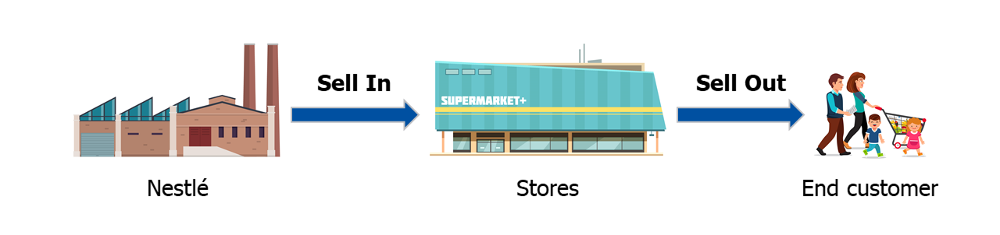

In [11]:
from IPython.display import Image
Image('./Sell_Out_Sell_In_Forecasting/graphics/02_SellIn_SellOut.png')

# 2. Load dataset

In [12]:
dataset = pd.read_csv('./Sell_Out_Sell_In_Forecasting/History_SellIn_SellOut.csv', sep=';')
dataset['PERIOD_TAG'] = pd.to_datetime(dataset['PERIOD_TAG'], format='%Y-%m-%d')
dataset

,PERIOD_TAG,product_group,customer_name,dispatches_SellIn,orders_SellIn,Sellout,numeric_distribution_selling_promotion,type_promo_1,type_promo_2
0,2016-08-07,Product_01,Customer_01,130,130,0.000000,0.0,0.0,0.0
1,2016-08-14,Product_01,Customer_01,4,5,102.274039,0.1,0.0,0.0
2,2016-08-21,Product_01,Customer_01,130,130,93.380644,0.0,0.0,0.0
3,2016-08-28,Product_01,Customer_01,61,61,101.162365,0.0,0.0,0.0
4,2016-09-04,Product_01,Customer_01,57,58,120.060829,0.1,0.0,0.0
...,...,...,...,...,...,...,...,...,...
6799,2019-12-01,Product_29,Customer_01,2504,3720,1320.611349,1.0,0.0,0.0
6800,2019-12-08,Product_29,Customer_01,3053,4918,1626.462092,0.8,0.0,0.0
6801,2019-12-15,Product_29,Customer_01,650,1903,1509.100761,0.5,0.0,0.0
6802,2019-12-22,Product_29,Customer_01,1863,2383,2568.909150,66.1,0.0,0.0


# 3. Exploratory Data Analysis

In [13]:
list(dataset['customer_name'].unique())

['Customer_01']

In [14]:
list(dataset['product_group'].sort_values().unique())

['Product_01',
 'Product_02',
 'Product_03',
 'Product_04',
 'Product_05',
 'Product_06',
 'Product_07',
 'Product_08',
 'Product_09',
 'Product_10',
 'Product_11',
 'Product_12',
 'Product_13',
 'Product_14',
 'Product_15',
 'Product_16',
 'Product_17',
 'Product_18',
 'Product_19',
 'Product_20',
 'Product_21',
 'Product_22',
 'Product_23',
 'Product_24',
 'Product_25',
 'Product_26',
 'Product_27',
 'Product_28',
 'Product_29',
 'Product_30',
 'Product_31',
 'Product_32',
 'Product_33',
 'Product_34',
 'Product_35',
 'Product_37',
 'Product_38',
 'Product_39',
 'Product_40',
 'Product_41',
 'Product_42']

In [15]:
biggest_products = dataset.copy()
biggest_products = biggest_products.loc[
    ((biggest_products['PERIOD_TAG']>='2019-01-01')&(biggest_products['PERIOD_TAG']<'2020-01-01')), :]
biggest_products = biggest_products.groupby(['customer_name', 'product_group'])[['dispatches_SellIn']].sum()
biggest_products.sort_values(by=['dispatches_SellIn'], ascending=False, inplace=True)
biggest_products.reset_index(inplace=True)
biggest_products

,customer_name,product_group,dispatches_SellIn
0,Customer_01,Product_34,1239947
1,Customer_01,Product_37,397179
2,Customer_01,Product_04,354670
3,Customer_01,Product_20,349369
4,Customer_01,Product_42,211624
5,Customer_01,Product_41,174605
6,Customer_01,Product_24,169556
7,Customer_01,Product_39,143229
8,Customer_01,Product_30,136329
9,Customer_01,Product_07,114656


In [16]:
dataset.describe()

,dispatches_SellIn,orders_SellIn,Sellout,numeric_distribution_selling_promotion,type_promo_1,type_promo_2
count,6804.000000,6804.000000,6804.000000,6804.000000,6804.000000,6804.000000
mean,1743.456055,1877.484421,1743.456055,5.941549,0.054527,0.074515
std,4746.466821,5140.428336,5265.857436,17.835099,0.227071,0.262626
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,46.000000,55.000000,97.151468,0.000000,0.000000,0.000000
50%,321.500000,349.500000,352.139572,0.200000,0.000000,0.000000
75%,1686.500000,1748.500000,1873.847017,1.400000,0.000000,0.000000
max,72152.000000,82339.000000,137159.755326,97.500000,1.000000,1.000000


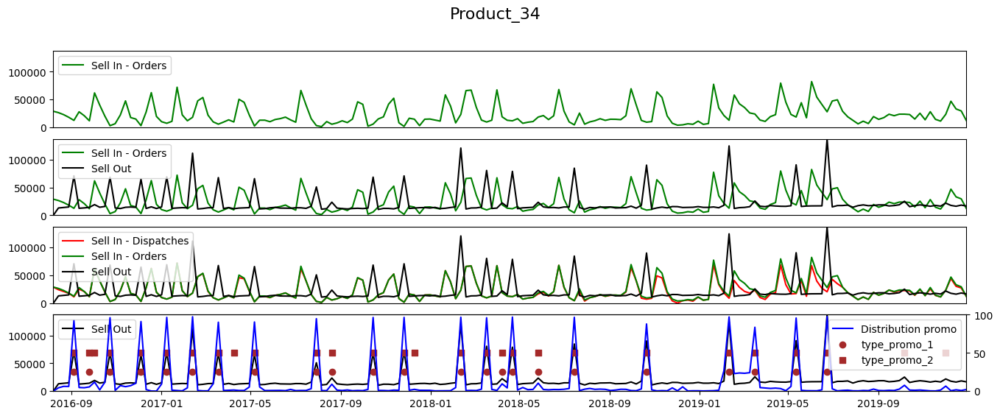

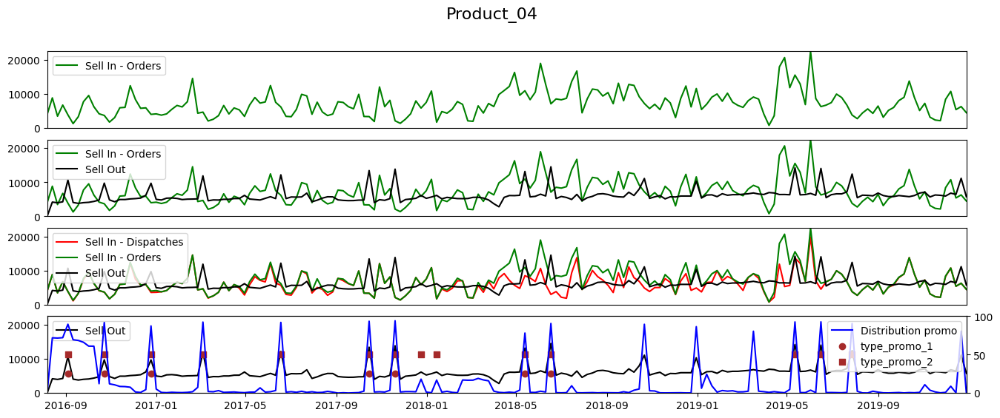

In [17]:
plot_products(df=dataset.copy(), num=2)

In [18]:
increase_sell_In_Out = pd.DataFrame()
for prod in dataset['product_group'].unique():
    one_prod = dataset.loc[dataset['product_group']==prod, :].copy()
    for shift in range(1, 7):
        one_prod[f'SellOut_Shift_{shift}'] = one_prod['Sellout'].shift(-shift)
    one_prod.dropna(inplace=True)

    increase_sell_In_Out = pd.concat([increase_sell_In_Out, one_prod])
increase_sell_In_Out

,PERIOD_TAG,product_group,customer_name,dispatches_SellIn,orders_SellIn,Sellout,numeric_distribution_selling_promotion,type_promo_1,type_promo_2,SellOut_Shift_1,SellOut_Shift_2,SellOut_Shift_3,SellOut_Shift_4,SellOut_Shift_5,SellOut_Shift_6
0,2016-08-07,Product_01,Customer_01,130,130,0.000000,0.0,0.0,0.0,102.274039,93.380644,101.162365,120.060829,202.324730,110.055760
1,2016-08-14,Product_01,Customer_01,4,5,102.274039,0.1,0.0,0.0,93.380644,101.162365,120.060829,202.324730,110.055760,106.720737
2,2016-08-21,Product_01,Customer_01,130,130,93.380644,0.0,0.0,0.0,101.162365,120.060829,202.324730,110.055760,106.720737,122.284177
3,2016-08-28,Product_01,Customer_01,61,61,101.162365,0.0,0.0,0.0,120.060829,202.324730,110.055760,106.720737,122.284177,108.944085
4,2016-09-04,Product_01,Customer_01,57,58,120.060829,0.1,0.0,0.0,202.324730,110.055760,106.720737,122.284177,108.944085,106.720737
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6793,2019-10-20,Product_29,Customer_01,783,1391,1573.116032,0.6,0.0,0.0,1736.710616,1595.639924,1345.506177,1437.972681,1377.513813,1320.611349
6794,2019-10-27,Product_29,Customer_01,1828,2289,1736.710616,0.8,0.0,0.0,1595.639924,1345.506177,1437.972681,1377.513813,1320.611349,1626.462092
6795,2019-11-03,Product_29,Customer_01,1218,2338,1595.639924,2.9,0.0,0.0,1345.506177,1437.972681,1377.513813,1320.611349,1626.462092,1509.100761
6796,2019-11-10,Product_29,Customer_01,948,2814,1345.506177,2.7,0.0,0.0,1437.972681,1377.513813,1320.611349,1626.462092,1509.100761,2568.909150


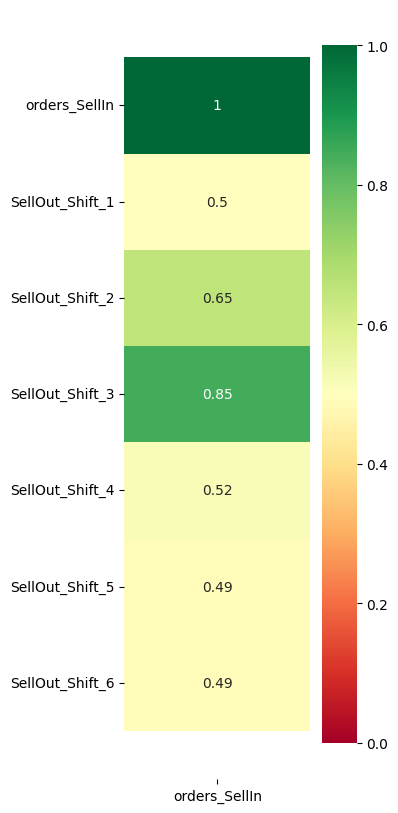

In [19]:
plt.figure(figsize = (3, 10))
columns_to_corr = ['orders_SellIn']+list(increase_sell_In_Out.loc[:, 'SellOut_Shift_1':].columns)
ax = sns.heatmap(pd.DataFrame(increase_sell_In_Out[columns_to_corr].corr()['orders_SellIn']),
                 annot = True, cmap='RdYlGn', vmin=0, vmax=1)
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)
plt.yticks(rotation=0)
plt.show()

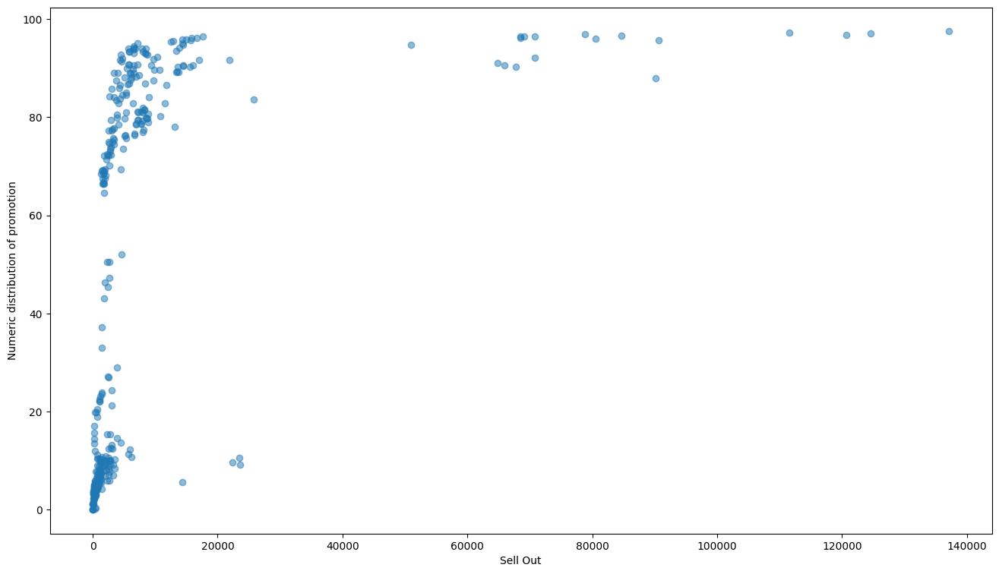

In [20]:
plt.figure(figsize=(16, 9))
plt.scatter(increase_sell_In_Out.loc[increase_sell_In_Out['type_promo_1']==1, 'Sellout'], 
            increase_sell_In_Out.loc[increase_sell_In_Out['type_promo_1']==1,
                                     'numeric_distribution_selling_promotion'],
            alpha=0.5)
plt.xlabel('Sell Out')
plt.ylabel('Numeric distribution of promotion')
plt.show()

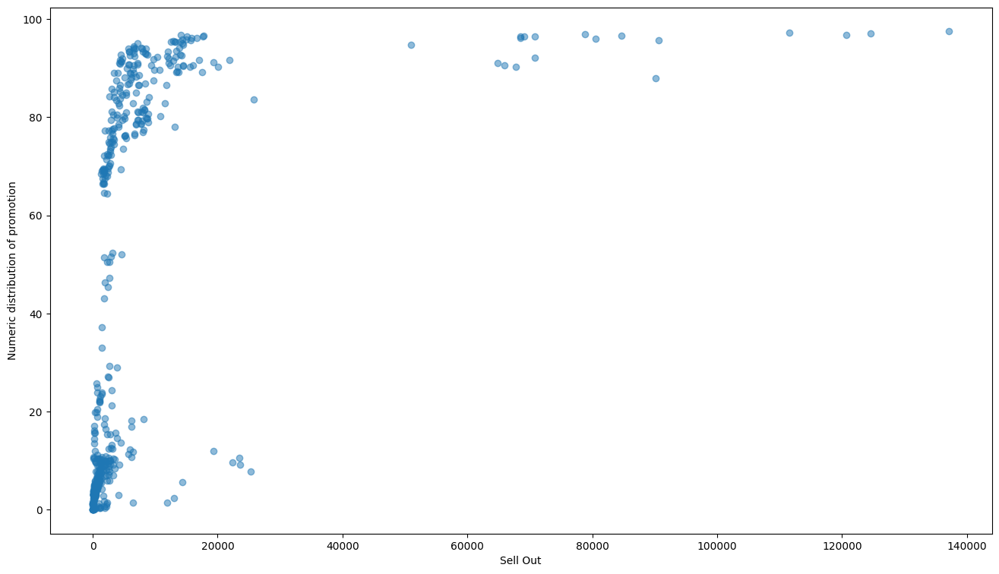

In [21]:
plt.figure(figsize=(16, 9))
plt.scatter(increase_sell_In_Out.loc[increase_sell_In_Out['type_promo_2']==1, 'Sellout'], 
            increase_sell_In_Out.loc[increase_sell_In_Out['type_promo_2']==1,
                                     'numeric_distribution_selling_promotion'],
            alpha=0.5)
plt.xlabel('Sell Out')
plt.ylabel('Numeric distribution of promotion')
plt.show()

# 4. Data Preprocessing - Feature Engineering

In [22]:
dataset

,PERIOD_TAG,product_group,customer_name,dispatches_SellIn,orders_SellIn,Sellout,numeric_distribution_selling_promotion,type_promo_1,type_promo_2
0,2016-08-07,Product_01,Customer_01,130,130,0.000000,0.0,0.0,0.0
1,2016-08-14,Product_01,Customer_01,4,5,102.274039,0.1,0.0,0.0
2,2016-08-21,Product_01,Customer_01,130,130,93.380644,0.0,0.0,0.0
3,2016-08-28,Product_01,Customer_01,61,61,101.162365,0.0,0.0,0.0
4,2016-09-04,Product_01,Customer_01,57,58,120.060829,0.1,0.0,0.0
...,...,...,...,...,...,...,...,...,...
6799,2019-12-01,Product_29,Customer_01,2504,3720,1320.611349,1.0,0.0,0.0
6800,2019-12-08,Product_29,Customer_01,3053,4918,1626.462092,0.8,0.0,0.0
6801,2019-12-15,Product_29,Customer_01,650,1903,1509.100761,0.5,0.0,0.0
6802,2019-12-22,Product_29,Customer_01,1863,2383,2568.909150,66.1,0.0,0.0


## *Applied machine learning is basically feature engineering* ~ **Andrew Ng**

It is very often said that data is the **fuel** for machine learning. However, in reality this is not quite true. If we simply take the data we have as input, we would not prepare good models in most cases. It is better to say that data is like **oil**. So, first of all, a proper process of converting crude **oil** into **fuel** has to be done. This process is referred to as feature engineering.

It is the process of creating new features to enable machine learning algorithms. Correctly preparing the characteristics greatly increases their quality as we transform the raw data into information that the model will convert into knowledge.

So how can we enrich our data:
#### 1) The values which we will forecast - how much we will sell in a week, in 2 weeks, etc ➞ it is our *y*

| PERIOD_TAG          | product_group   |   orders_SellIn |   SellOut |   orders_SellIn_1W |   SellOut_1W |   orders_SellIn_2W |   SellOut_2W |
|:--------------------|:----------------|----------------:|----------:|-------------------:|-------------:|-------------------:|-------------:|
| 2019-12-01 | Product_34      |           23538 |     19794 |              47019 |        16137 |              33194 |        14747 |
| 2019-12-08 | Product_34      |           47019 |     16137 |              33194 |        14747 |              29624 |        16637 |
| 2019-12-15 | Product_34      |           33194 |     14747 |              29624 |        16637 |              12224 |        15111 |
| 2019-12-22 | Product_34      |           29624 |     16637 |              12224 |        15111 |                nan |          nan |
| 2019-12-29 | Product_34      |           12224 |     15111 |                nan |          nan |                nan |          nan |

#### 2) Values from the future that we know - what the promotion will be a week from now, 2 weeks from now, etc ➞ it is our *X*

| PERIOD_TAG          | product_group   |   SellOut |   distribution |   promo_1 |   distribution_1W |   promo_1_1W |   distribution_2W |   promo_1_2W |
|:--------------------|:----------------|----------:|---------------:|----------:|------------------:|-------------:|------------------:|-------------:|
| 2016-08-07 | Product_34      |         0 |         0      |         0 |            0      |            0 |            0      |            0 |
| 2016-08-14 | Product_34      |     11949 |         0      |         0 |            0      |            0 |            0      |            0 |
| 2016-08-21 | Product_34      |     12778 |         0      |         0 |            0      |            0 |           86.1272 |            1 |
| 2016-08-28 | Product_34      |     13554 |         0      |         0 |           86.1272 |            1 |            0      |            0 |
| 2016-09-04 | Product_34      |     63963 |        86.1272 |         1 |            0      |            0 |            0      |            0 |

#### 3) Lagged values - how much we sold a week ago, 2 weeks ago, etc ➞ it is our *X*

| PERIOD_TAG          | product_group   |   orders_SellIn |   SellOut |   orders_SellIn_lag1 |   SellOut_lag1 |   orders_SellIn_lag2 |   SellOut_lag2 |
|:--------------------|:----------------|----------------:|----------:|---------------------:|---------------:|---------------------:|---------------:|
| 2016-08-07 | Product_34      |           29055 |         0 |                  nan |            nan |                  nan |            nan |
| 2016-08-14 | Product_34      |           26605 |     11949 |                29055 |              0 |                  nan |            nan |
| 2016-08-21 | Product_34      |           22996 |     12778 |                26605 |          11949 |                29055 |              0 |
| 2016-08-28 | Product_34      |           18239 |     13554 |                22996 |          12778 |                26605 |          11949 |
| 2016-09-04 | Product_34      |           12672 |     63963 |                18239 |          13554 |                22996 |          12778 |

#### 4) The rolling statistics ➞ it is our *X*
This can be the mean, median, standard deviation, sum, difference between different values (e.g. *orders* and *dispatches*)

| PERIOD_TAG          | product_group   |   orders_SellIn |   SellOut |   orders_SellIn_mean2 |   SellOut_mean2 |   orders_SellIn_mean3 |   SellOut_mean3 |
|:--------------------|:----------------|----------------:|----------:|----------------------:|----------------:|----------------------:|----------------:|
| 2016-08-07 | Product_34      |           29055 |         0 |                 nan   |           nan   |                 nan   |          nan    |
| 2016-08-14 | Product_34      |           26605 |     11949 |               27830   |          5974.5 |                 nan   |          nan    |
| 2016-08-21 | Product_34      |           22996 |     12778 |               24800.5 |         12363.5 |               26218.7 |         8242.33 |
| 2016-08-28 | Product_34      |           18239 |     13554 |               20617.5 |         13166   |               22613.3 |        12760.3  |
| 2016-09-04 | Product_34      |           12672 |     63963 |               15455.5 |         38758.5 |               17969   |        30098.3  |

#### 5) Date-related variables (seasonality)➞ it is our *X*

<div>
<img src="graphics/03_Cyclic.png" width="600"/>
</div>

| PERIOD_TAG          |   week_sin |   week_cos |
|:--------------------|-----------:|-----------:|
| 2016-08-07 |      -0.57 |      -0.82 |
| 2016-08-14 |      -0.66 |      -0.75 |
| 2018-12-23 |      -0.12 |       0.99 |
| 2018-12-30 |       0    |       1    |

In [23]:
scenario = 1
promo_variables = ['numeric_distribution_selling_promotion', 'type_promo_1', 'type_promo_2']
promo_sellin = []
cl4_col_name = 'customer_name'
mg1_col_name = 'product_group'
sellout_w = 18
sellin_w = 13

steps_preprocessing = [
    ('make_ts', MakeTSTransformer(date_column='PERIOD_TAG')),
    ('feature_engineering_transformer', FeatureEngineeringTransformer(scenario=scenario,
                                                                      promo_variables=promo_variables,
                                                                      promo_sellin=promo_sellin, 
                                                                      cl4_col_name=cl4_col_name, 
                                                                      mg1_col_name=mg1_col_name,
                                                                      sellout_w=sellout_w, 
                                                                      sellin_w=sellin_w, 
                                                                      nr_horizon=1, 
                                                                      type_forecast='Sellout',
                                                                      target='Sellout'))
]

pipeline_preprocessing = Pipeline(steps = steps_preprocessing)
pipeline_preprocessing.fit_transform(dataset)

Categoric features:
1
Selected_variables:
['Sellout_1W', 'customer_name', 'product_group', 'week_sin', 'week_cos', 'customer_name_Customer_01', 'numeric_distribution_selling_promotion_1W', 'type_promo_1_1W', 'type_promo_2_1W', 'Sellout', 'Sellout_lag_1', 'Sellout_lag_2', 'Sellout_lag_3', 'Sellout_lag_4', 'Sellout_lag_5', 'Sellout_window_mean_5', 'Sellout_window_mean_10', 'Sellout_window_std_2', 'Sellout_window_std_3', 'Sellout_window_std_4', 'Sellout_window_std_5', 'Sellout_window_min_2', 'Sellout_window_min_3', 'Sellout_window_min_4', 'Sellout_window_min_5', 'Sellout_window_max_2', 'Sellout_window_max_3', 'Sellout_window_max_4', 'Sellout_window_max_5']
Number: 29


,Sellout_1W,customer_name,product_group,week_sin,week_cos,customer_name_Customer_01,numeric_distribution_selling_promotion_1W,type_promo_1_1W,type_promo_2_1W,Sellout,...,Sellout_window_std_4,Sellout_window_std_5,Sellout_window_min_2,Sellout_window_min_3,Sellout_window_min_4,Sellout_window_min_5,Sellout_window_max_2,Sellout_window_max_3,Sellout_window_max_4,Sellout_window_max_5
PERIOD_TAG,,,,,,,,,,,,,,,,,,,,,
2016-10-09,106.720737,Customer_01,Product_01,-0.999561,0.029633,1,0.0,0.0,0.0,108.944085,...,6.994131,40.845523,108.944085,106.720737,106.720737,106.720737,122.284177,122.284177,122.284177,202.324730
2016-10-16,105.609062,Customer_01,Product_01,-0.98904,0.147647,1,0.0,0.0,0.0,106.720737,...,7.484907,6.501157,106.720737,106.720737,106.720737,106.720737,108.944085,122.284177,122.284177,122.284177
2016-10-23,118.949154,Customer_01,Product_01,-0.964636,0.263587,1,0.0,0.0,0.0,105.609062,...,7.721937,6.942404,105.609062,105.609062,105.609062,105.609062,106.720737,108.944085,122.284177,122.284177
2016-10-30,86.710598,Customer_01,Product_01,-0.92669,0.375828,1,0.0,0.0,0.0,118.949154,...,6.088891,7.596893,105.609062,105.609062,105.609062,105.609062,118.949154,118.949154,118.949154,122.284177
2016-11-06,96.715668,Customer_01,Product_01,-0.875735,0.482792,1,0.0,0.0,0.0,86.710598,...,13.309176,11.696378,86.710598,86.710598,86.710598,86.710598,118.949154,118.949154,118.949154,118.949154
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-11-24,1320.611349,Customer_01,Product_29,-0.652822,0.757511,1,1.0,0.0,0.0,1377.513813,...,111.143552,164.232034,1377.513813,1345.506177,1345.506177,1345.506177,1437.972681,1437.972681,1595.639924,1736.710616
2019-12-01,1626.462092,Customer_01,Product_29,-0.558647,0.829406,1,0.8,0.0,0.0,1320.611349,...,50.712542,109.887832,1320.611349,1320.611349,1320.611349,1320.611349,1377.513813,1437.972681,1437.972681,1595.639924
2019-12-08,1509.100761,Customer_01,Product_29,-0.456629,0.889657,1,0.5,0.0,0.0,1626.462092,...,132.826650,122.646963,1320.611349,1320.611349,1320.611349,1320.611349,1626.462092,1626.462092,1626.462092,1626.462092


# 5. Modelling

## 5.1 Train Test Split

In [24]:
target_columns = [f'Sellout_{horizon}W' for horizon in range(1, sellout_w+1)]+\
                    [f'orders_SellIn_{horizon}W' for horizon in range(1, sellin_w+1)]
target_columns

['Sellout_1W',
 'Sellout_2W',
 'Sellout_3W',
 'Sellout_4W',
 'Sellout_5W',
 'Sellout_6W',
 'Sellout_7W',
 'Sellout_8W',
 'Sellout_9W',
 'Sellout_10W',
 'Sellout_11W',
 'Sellout_12W',
 'Sellout_13W',
 'Sellout_14W',
 'Sellout_15W',
 'Sellout_16W',
 'Sellout_17W',
 'Sellout_18W',
 'orders_SellIn_1W',
 'orders_SellIn_2W',
 'orders_SellIn_3W',
 'orders_SellIn_4W',
 'orders_SellIn_5W',
 'orders_SellIn_6W',
 'orders_SellIn_7W',
 'orders_SellIn_8W',
 'orders_SellIn_9W',
 'orders_SellIn_10W',
 'orders_SellIn_11W',
 'orders_SellIn_12W',
 'orders_SellIn_13W']

In [25]:
first_test_date = dt.datetime.strptime('2019-01-06', '%Y-%m-%d')
end_test_date = dt.datetime.strptime('2019-12-22', '%Y-%m-%d')

In [26]:
dataset

,PERIOD_TAG,product_group,customer_name,dispatches_SellIn,orders_SellIn,Sellout,numeric_distribution_selling_promotion,type_promo_1,type_promo_2
0,2016-08-07,Product_01,Customer_01,130,130,0.000000,0.0,0.0,0.0
1,2016-08-14,Product_01,Customer_01,4,5,102.274039,0.1,0.0,0.0
2,2016-08-21,Product_01,Customer_01,130,130,93.380644,0.0,0.0,0.0
3,2016-08-28,Product_01,Customer_01,61,61,101.162365,0.0,0.0,0.0
4,2016-09-04,Product_01,Customer_01,57,58,120.060829,0.1,0.0,0.0
...,...,...,...,...,...,...,...,...,...
6799,2019-12-01,Product_29,Customer_01,2504,3720,1320.611349,1.0,0.0,0.0
6800,2019-12-08,Product_29,Customer_01,3053,4918,1626.462092,0.8,0.0,0.0
6801,2019-12-15,Product_29,Customer_01,650,1903,1509.100761,0.5,0.0,0.0
6802,2019-12-22,Product_29,Customer_01,1863,2383,2568.909150,66.1,0.0,0.0


## 5.2 Training models on different horizons

In [36]:
!rm -rf output
!mkdir -p content/output/models
!mkdir -p content/output/hyperparameters
!mkdir -p content/output/preprocessing
!ls -la

total 1296
drwxr-xr-x 1 root root   4096 May 10 08:42 .
drwxr-xr-x 1 root root   4096 May 10 08:24 ..
drwxr-xr-x 4 root root   4096 May  8 13:36 .config
drwxr-xr-x 3 root root   4096 May 10 08:42 content
-rw-r--r-- 1 root root 664699 May 10 08:31 prod_Product_04.png
-rw-r--r-- 1 root root 631137 May 10 08:30 prod_Product_34.png
drwxr-xr-x 1 root root   4096 May  8 13:37 sample_data
drwxr-xr-x 4 root root   4096 May 10 08:30 Sell_Out_Sell_In_Forecasting


|---------------------------	Sellout_1W	---------------------------|
--------------------------------------------------------
Creating a training set
Categoric features:
1
Selected_variables:
['Sellout_1W', 'customer_name', 'product_group', 'week_sin', 'week_cos', 'customer_name_Customer_01', 'numeric_distribution_selling_promotion_1W', 'type_promo_1_1W', 'type_promo_2_1W', 'Sellout', 'Sellout_lag_1', 'Sellout_lag_2', 'Sellout_lag_3', 'Sellout_lag_4', 'Sellout_lag_5', 'Sellout_window_mean_5', 'Sellout_window_mean_10', 'Sellout_window_std_2', 'Sellout_window_std_3', 'Sellout_window_std_4', 'Sellout_window_std_5', 'Sellout_window_min_2', 'Sellout_window_min_3', 'Sellout_window_min_4', 'Sellout_window_min_5', 'Sellout_window_max_2', 'Sellout_window_max_3', 'Sellout_window_max_4', 'Sellout_window_max_5']
Number: 29


,week_sin,week_cos,customer_name_Customer_01,numeric_distribution_selling_promotion_1W,type_promo_1_1W,type_promo_2_1W,Sellout,Sellout_lag_1,Sellout_lag_2,Sellout_lag_3,...,Sellout_window_std_4,Sellout_window_std_5,Sellout_window_min_2,Sellout_window_min_3,Sellout_window_min_4,Sellout_window_min_5,Sellout_window_max_2,Sellout_window_max_3,Sellout_window_max_4,Sellout_window_max_5
PERIOD_TAG,,,,,,,,,,,,,,,,,,,,,
2016-10-09,-0.999561,0.029633,1,0.0,0.0,0.0,108.944085,122.284177,106.720737,110.055760,...,6.994131,40.845523,108.944085,106.720737,106.720737,106.720737,122.284177,122.284177,122.284177,202.324730
2016-10-16,-0.98904,0.147647,1,0.0,0.0,0.0,106.720737,108.944085,122.284177,106.720737,...,7.484907,6.501157,106.720737,106.720737,106.720737,106.720737,108.944085,122.284177,122.284177,122.284177
2016-10-23,-0.964636,0.263587,1,0.0,0.0,0.0,105.609062,106.720737,108.944085,122.284177,...,7.721937,6.942404,105.609062,105.609062,105.609062,105.609062,106.720737,108.944085,122.284177,122.284177
2016-10-30,-0.92669,0.375828,1,0.0,0.0,0.0,118.949154,105.609062,106.720737,108.944085,...,6.088891,7.596893,105.609062,105.609062,105.609062,105.609062,118.949154,118.949154,118.949154,122.284177
2016-11-06,-0.875735,0.482792,1,0.0,0.0,0.0,86.710598,118.949154,105.609062,106.720737,...,13.309176,11.696378,86.710598,86.710598,86.710598,86.710598,118.949154,118.949154,118.949154,118.949154
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-11-25,-0.652822,0.757511,1,0.6,0.0,0.0,2241.719983,2444.435011,2276.098555,2683.899546,...,202.027248,175.452067,2241.719983,2241.719983,2241.719983,2241.719983,2444.435011,2444.435011,2683.899546,2683.899546
2018-12-02,-0.558647,0.829406,1,0.5,0.0,0.0,1974.989684,2241.719983,2444.435011,2276.098555,...,194.251330,262.156806,1974.989684,1974.989684,1974.989684,1974.989684,2241.719983,2444.435011,2444.435011,2683.899546
2018-12-09,-0.456629,0.889657,1,0.6,0.0,0.0,1816.136972,1974.989684,2241.719983,2444.435011,...,278.946061,251.543348,1816.136972,1816.136972,1816.136972,1816.136972,1974.989684,2241.719983,2444.435011,2444.435011


PERIOD_TAG
2016-10-09     106.720737
2016-10-16     105.609062
2016-10-23     118.949154
2016-10-30      86.710598
2016-11-06      96.715668
                 ...     
2018-11-25    1974.989684
2018-12-02    1816.136972
2018-12-09    1632.389432
2018-12-16    1653.727856
2018-12-23    3072.733049
Name: Sellout_1W, Length: 4262, dtype: float64

--------------------------------------------------------
Creating a test set


,week_sin,week_cos,customer_name_Customer_01,numeric_distribution_selling_promotion_1W,type_promo_1_1W,type_promo_2_1W,Sellout,Sellout_lag_1,Sellout_lag_2,Sellout_lag_3,...,Sellout_window_std_4,Sellout_window_std_5,Sellout_window_min_2,Sellout_window_min_3,Sellout_window_min_4,Sellout_window_min_5,Sellout_window_max_2,Sellout_window_max_3,Sellout_window_max_4,Sellout_window_max_5
PERIOD_TAG,,,,,,,,,,,,,,,,,,,,,
2018-12-30,-0.118273,0.992981,1,0.0,0.0,0.0,155.634407,121.172503,212.329799,131.177572,...,40.820302,36.181542,121.172503,121.172503,121.172503,121.172503,155.634407,212.329799,212.329799,212.329799
2019-01-06,0.118273,0.992981,1,0.0,0.0,0.0,126.730875,155.634407,121.172503,212.329799,...,41.738400,37.555841,126.730875,121.172503,121.172503,121.172503,155.634407,155.634407,212.329799,212.329799
2019-01-13,0.234886,0.972023,1,0.0,0.0,0.0,123.395852,126.730875,155.634407,121.172503,...,16.096901,38.645676,123.395852,123.395852,121.172503,121.172503,126.730875,155.634407,155.634407,212.329799
2019-01-20,0.348202,0.93742,1,0.0,0.0,0.0,131.177572,123.395852,126.730875,155.634407,...,14.618271,13.942541,123.395852,123.395852,123.395852,121.172503,131.177572,131.177572,155.634407,155.634407
2019-01-27,0.456629,0.889657,1,0.0,0.0,0.0,125.619200,131.177572,123.395852,126.730875,...,3.272681,13.233128,125.619200,123.395852,123.395852,123.395852,131.177572,131.177572,131.177572,155.634407
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-11-17,-0.737833,0.674983,1,0.5,0.0,0.0,1437.972681,1345.506177,1595.639924,1736.710616,...,172.762388,150.914313,1345.506177,1345.506177,1345.506177,1345.506177,1437.972681,1595.639924,1736.710616,1736.710616
2019-11-24,-0.652822,0.757511,1,1.0,0.0,0.0,1377.513813,1437.972681,1345.506177,1595.639924,...,111.143552,164.232034,1377.513813,1345.506177,1345.506177,1345.506177,1437.972681,1437.972681,1595.639924,1736.710616
2019-12-01,-0.558647,0.829406,1,0.8,0.0,0.0,1320.611349,1377.513813,1437.972681,1345.506177,...,50.712542,109.887832,1320.611349,1320.611349,1320.611349,1320.611349,1377.513813,1437.972681,1437.972681,1595.639924


PERIOD_TAG
2018-12-30     126.730875
2019-01-06     123.395852
2019-01-13     131.177572
2019-01-20     125.619200
2019-01-27     141.182641
                 ...     
2019-11-17    1377.513813
2019-11-24    1320.611349
2019-12-01    1626.462092
2019-12-08    1509.100761
2019-12-15    2568.909150
Name: Sellout_1W, Length: 2091, dtype: float64

--------------------------------------------------------
Fitting 5 folds for each of 6 candidates, totalling 30 fits
The best estimator: 
Pipeline(steps=[('regressor',
                 RandomForestRegressor(max_depth=10, min_samples_leaf=3,
                                       n_jobs=3, random_state=123))])

The best score: 
-19944331.943779267

The best parameters: 
{'regressor__criterion': 'squared_error', 'regressor__max_depth': 10, 'regressor__min_samples_leaf': 3, 'regressor__n_estimators': 100}

Evaluation charts


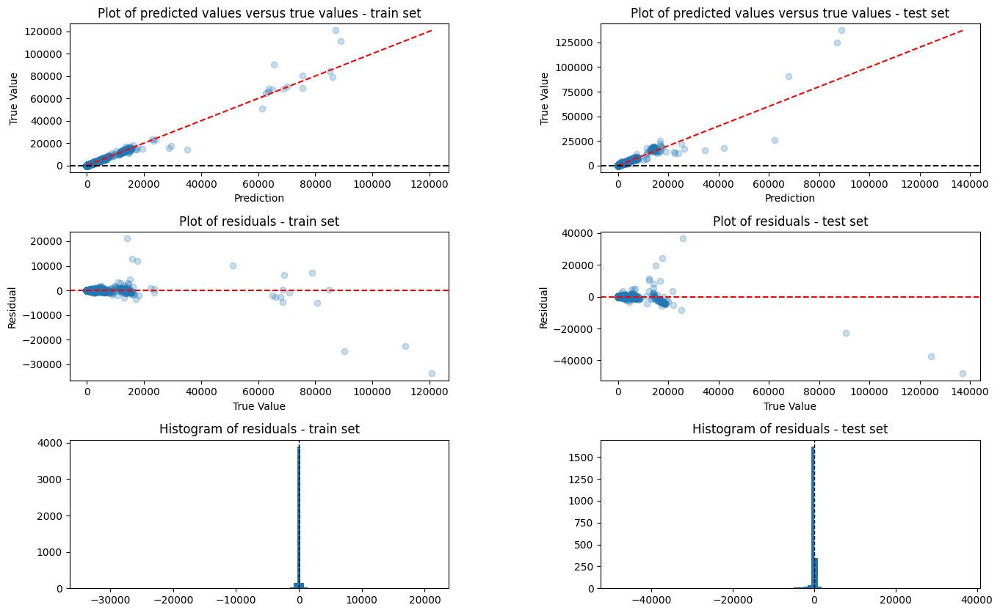

RMSE train: 909.2255136579176
DPA  train: 92.50362539932777
BIAS train: 0.03363824869987388

RMSE test:  1936.1836933893203
DPA  test: 83.39804413409954
BIAS test: -2.5546653451242967


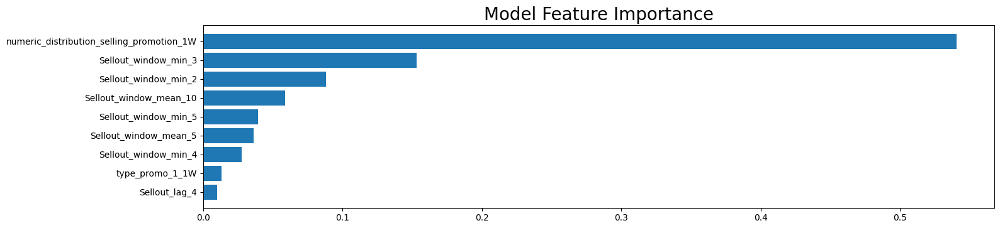

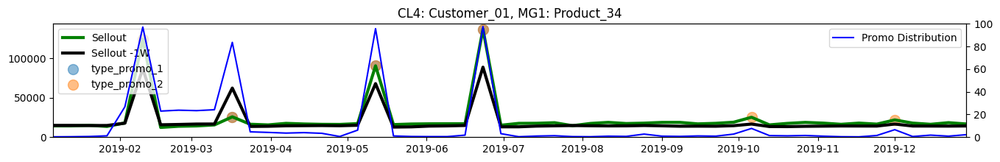

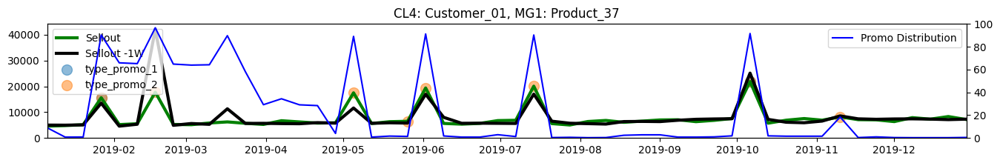

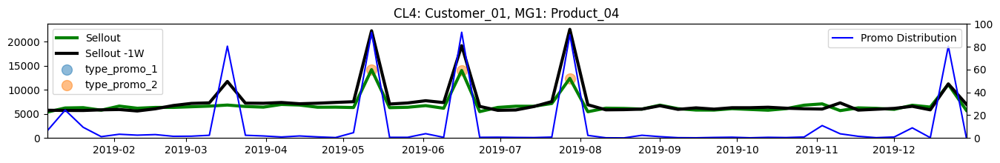

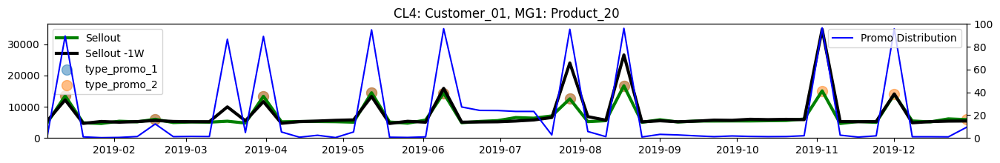

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


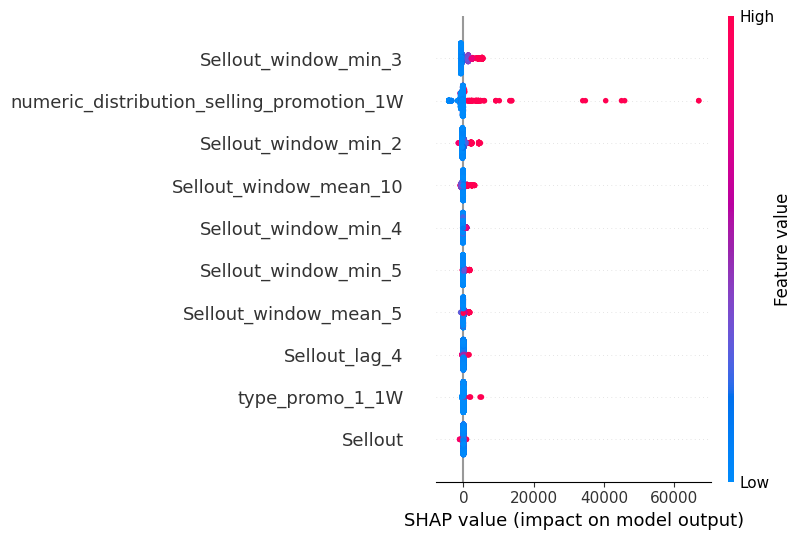

None

Finished iterating in: 58 seconds


|---------------------------	Sellout_2W	---------------------------|
--------------------------------------------------------
Creating a training set
Categoric features:
1
Selected_variables:
['Sellout_2W', 'customer_name', 'product_group', 'week_sin', 'week_cos', 'customer_name_Customer_01', 'numeric_distribution_selling_promotion_2W', 'type_promo_1_2W', 'type_promo_2_2W', 'Sellout', 'Sellout_lag_1', 'Sellout_lag_2', 'Sellout_lag_3', 'Sellout_lag_4', 'Sellout_lag_5', 'Sellout_window_mean_5', 'Sellout_window_mean_10', 'Sellout_window_std_2', 'Sellout_window_std_3', 'Sellout_window_std_4', 'Sellout_window_std_5', 'Sellout_window_min_2', 'Sellout_window_min_3', 'Sellout_window_min_4', 'Sellout_window_min_5', 'Sellout_window_max_2', 'Sellout_window_max_3', 'Sellout_window_max_4', 'Sellout_window_max_5']
Number: 29


,week_sin,week_cos,customer_name_Customer_01,numeric_distribution_selling_promotion_2W,type_promo_1_2W,type_promo_2_2W,Sellout,Sellout_lag_1,Sellout_lag_2,Sellout_lag_3,...,Sellout_window_std_4,Sellout_window_std_5,Sellout_window_min_2,Sellout_window_min_3,Sellout_window_min_4,Sellout_window_min_5,Sellout_window_max_2,Sellout_window_max_3,Sellout_window_max_4,Sellout_window_max_5
PERIOD_TAG,,,,,,,,,,,,,,,,,,,,,
2016-10-09,-0.999561,0.029633,1,0.0,0.0,0.0,108.944085,122.284177,106.720737,110.055760,...,6.994131,40.845523,108.944085,106.720737,106.720737,106.720737,122.284177,122.284177,122.284177,202.324730
2016-10-16,-0.98904,0.147647,1,0.0,0.0,0.0,106.720737,108.944085,122.284177,106.720737,...,7.484907,6.501157,106.720737,106.720737,106.720737,106.720737,108.944085,122.284177,122.284177,122.284177
2016-10-23,-0.964636,0.263587,1,0.0,0.0,0.0,105.609062,106.720737,108.944085,122.284177,...,7.721937,6.942404,105.609062,105.609062,105.609062,105.609062,106.720737,108.944085,122.284177,122.284177
2016-10-30,-0.92669,0.375828,1,0.0,0.0,0.0,118.949154,105.609062,106.720737,108.944085,...,6.088891,7.596893,105.609062,105.609062,105.609062,105.609062,118.949154,118.949154,118.949154,122.284177
2016-11-06,-0.875735,0.482792,1,0.8,0.0,0.0,86.710598,118.949154,105.609062,106.720737,...,13.309176,11.696378,86.710598,86.710598,86.710598,86.710598,118.949154,118.949154,118.949154,118.949154
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-11-18,-0.737833,0.674983,1,0.6,0.0,0.0,2444.435011,2276.098555,2683.899546,2440.878607,...,167.880504,1523.600486,2276.098555,2276.098555,2276.098555,2276.098555,2444.435011,2683.899546,2683.899546,5852.655503
2018-11-25,-0.652822,0.757511,1,0.5,0.0,0.0,2241.719983,2444.435011,2276.098555,2683.899546,...,202.027248,175.452067,2241.719983,2241.719983,2241.719983,2241.719983,2444.435011,2444.435011,2683.899546,2683.899546
2018-12-02,-0.558647,0.829406,1,0.6,0.0,0.0,1974.989684,2241.719983,2444.435011,2276.098555,...,194.251330,262.156806,1974.989684,1974.989684,1974.989684,1974.989684,2241.719983,2444.435011,2444.435011,2683.899546


PERIOD_TAG
2016-10-09     105.609062
2016-10-16     118.949154
2016-10-23      86.710598
2016-10-30      96.715668
2016-11-06      95.603993
                 ...     
2018-11-18    1974.989684
2018-11-25    1816.136972
2018-12-02    1632.389432
2018-12-09    1653.727856
2018-12-16    3072.733049
Name: Sellout_2W, Length: 4221, dtype: float64

--------------------------------------------------------
Creating a test set


,week_sin,week_cos,customer_name_Customer_01,numeric_distribution_selling_promotion_2W,type_promo_1_2W,type_promo_2_2W,Sellout,Sellout_lag_1,Sellout_lag_2,Sellout_lag_3,...,Sellout_window_std_4,Sellout_window_std_5,Sellout_window_min_2,Sellout_window_min_3,Sellout_window_min_4,Sellout_window_min_5,Sellout_window_max_2,Sellout_window_max_3,Sellout_window_max_4,Sellout_window_max_5
PERIOD_TAG,,,,,,,,,,,,,,,,,,,,,
2018-12-23,-0.234886,0.972023,1,0.0,0.0,0.0,121.172503,212.329799,131.177572,137.847618,...,41.698903,38.440471,121.172503,121.172503,121.172503,121.172503,212.329799,212.329799,212.329799,212.329799
2018-12-30,-0.118273,0.992981,1,0.0,0.0,0.0,155.634407,121.172503,212.329799,131.177572,...,40.820302,36.181542,121.172503,121.172503,121.172503,121.172503,155.634407,212.329799,212.329799,212.329799
2019-01-06,0.118273,0.992981,1,0.0,0.0,0.0,126.730875,155.634407,121.172503,212.329799,...,41.738400,37.555841,126.730875,121.172503,121.172503,121.172503,155.634407,155.634407,212.329799,212.329799
2019-01-13,0.234886,0.972023,1,0.0,0.0,0.0,123.395852,126.730875,155.634407,121.172503,...,16.096901,38.645676,123.395852,123.395852,121.172503,121.172503,126.730875,155.634407,155.634407,212.329799
2019-01-20,0.348202,0.93742,1,0.0,0.0,0.0,131.177572,123.395852,126.730875,155.634407,...,14.618271,13.942541,123.395852,123.395852,123.395852,121.172503,131.177572,131.177572,155.634407,155.634407
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-11-10,-0.812487,0.582979,1,0.5,0.0,0.0,1345.506177,1595.639924,1736.710616,1573.116032,...,161.911886,140.335579,1345.506177,1345.506177,1345.506177,1345.506177,1595.639924,1736.710616,1736.710616,1736.710616
2019-11-17,-0.737833,0.674983,1,1.0,0.0,0.0,1437.972681,1345.506177,1595.639924,1736.710616,...,172.762388,150.914313,1345.506177,1345.506177,1345.506177,1345.506177,1437.972681,1595.639924,1736.710616,1736.710616
2019-11-24,-0.652822,0.757511,1,0.8,0.0,0.0,1377.513813,1437.972681,1345.506177,1595.639924,...,111.143552,164.232034,1377.513813,1345.506177,1345.506177,1345.506177,1437.972681,1437.972681,1595.639924,1736.710616


PERIOD_TAG
2018-12-23     126.730875
2018-12-30     123.395852
2019-01-06     131.177572
2019-01-13     125.619200
2019-01-20     141.182641
                 ...     
2019-11-10    1377.513813
2019-11-17    1320.611349
2019-11-24    1626.462092
2019-12-01    1509.100761
2019-12-08    2568.909150
Name: Sellout_2W, Length: 2091, dtype: float64

--------------------------------------------------------
Fitting 5 folds for each of 6 candidates, totalling 30 fits
The best estimator: 
Pipeline(steps=[('regressor',
                 RandomForestRegressor(max_depth=10, min_samples_leaf=3,
                                       n_jobs=3, random_state=123))])

The best score: 
-19998778.861650966

The best parameters: 
{'regressor__criterion': 'squared_error', 'regressor__max_depth': 10, 'regressor__min_samples_leaf': 3, 'regressor__n_estimators': 100}

Evaluation charts


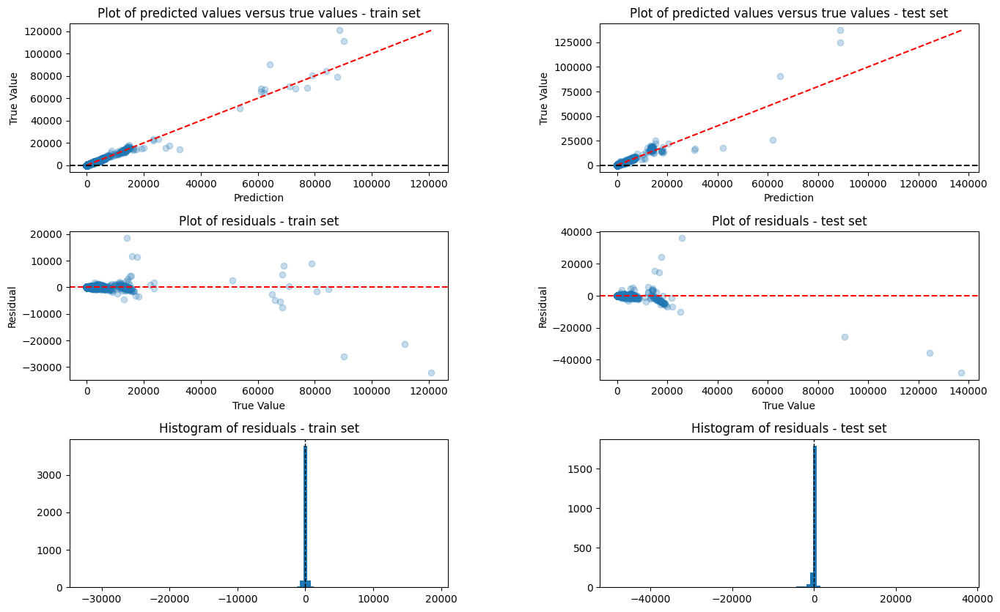

RMSE train: 889.4268062418743
DPA  train: 92.21589015563872
BIAS train: -0.21625847116899413

RMSE test:  1916.116283175691
DPA  test: 83.28784132315062
BIAS test: -4.087076799188885


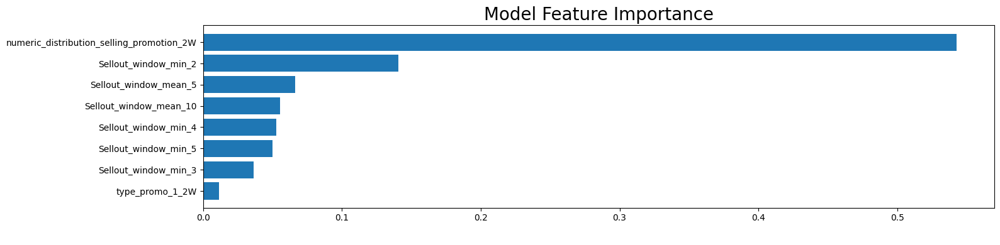

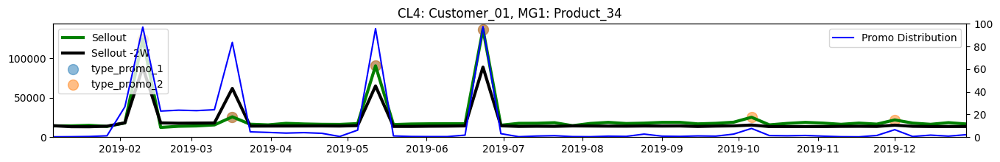

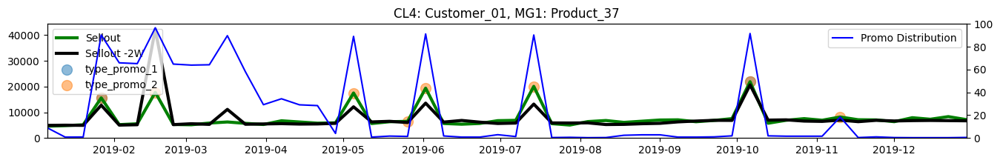

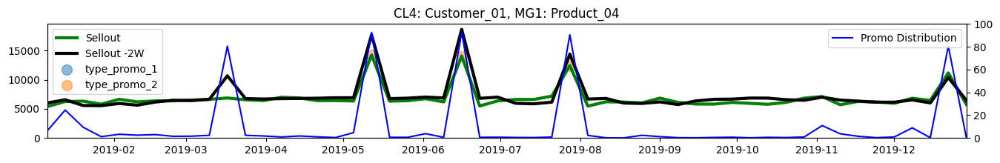

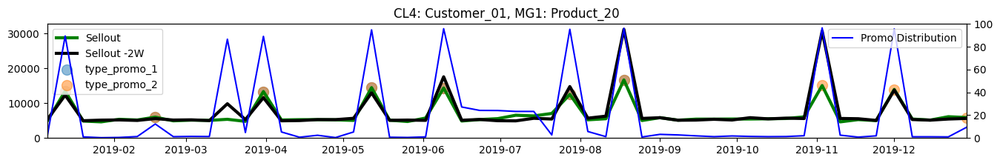

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


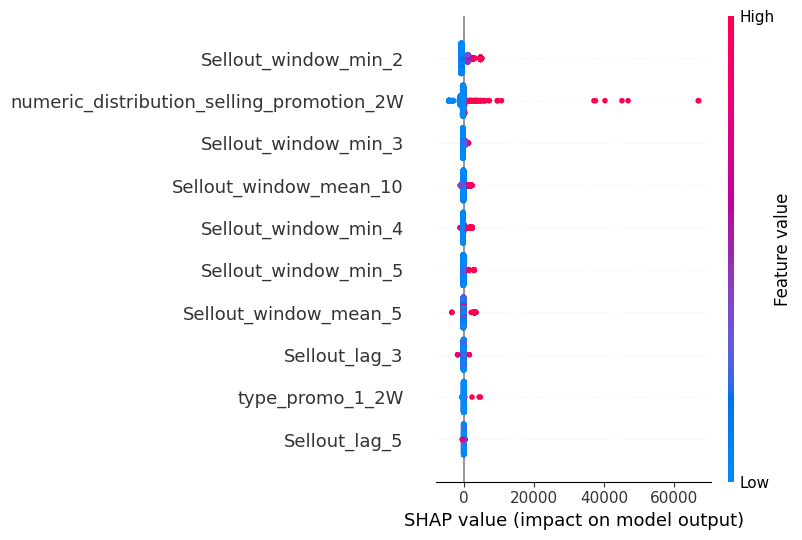

None

Finished iterating in: 60 seconds


|---------------------------	Sellout_3W	---------------------------|
--------------------------------------------------------
Creating a training set
Categoric features:
1
Selected_variables:
['Sellout_3W', 'customer_name', 'product_group', 'week_sin', 'week_cos', 'customer_name_Customer_01', 'numeric_distribution_selling_promotion_3W', 'type_promo_1_3W', 'type_promo_2_3W', 'Sellout', 'Sellout_lag_1', 'Sellout_lag_2', 'Sellout_lag_3', 'Sellout_lag_4', 'Sellout_lag_5', 'Sellout_window_mean_5', 'Sellout_window_mean_10', 'Sellout_window_std_2', 'Sellout_window_std_3', 'Sellout_window_std_4', 'Sellout_window_std_5', 'Sellout_window_min_2', 'Sellout_window_min_3', 'Sellout_window_min_4', 'Sellout_window_min_5', 'Sellout_window_max_2', 'Sellout_window_max_3', 'Sellout_window_max_4', 'Sellout_window_max_5']
Number: 29


,week_sin,week_cos,customer_name_Customer_01,numeric_distribution_selling_promotion_3W,type_promo_1_3W,type_promo_2_3W,Sellout,Sellout_lag_1,Sellout_lag_2,Sellout_lag_3,...,Sellout_window_std_4,Sellout_window_std_5,Sellout_window_min_2,Sellout_window_min_3,Sellout_window_min_4,Sellout_window_min_5,Sellout_window_max_2,Sellout_window_max_3,Sellout_window_max_4,Sellout_window_max_5
PERIOD_TAG,,,,,,,,,,,,,,,,,,,,,
2016-10-09,-0.999561,0.029633,1,0.0,0.0,0.0,108.944085,122.284177,106.720737,110.055760,...,6.994131,40.845523,108.944085,106.720737,106.720737,106.720737,122.284177,122.284177,122.284177,202.324730
2016-10-16,-0.98904,0.147647,1,0.0,0.0,0.0,106.720737,108.944085,122.284177,106.720737,...,7.484907,6.501157,106.720737,106.720737,106.720737,106.720737,108.944085,122.284177,122.284177,122.284177
2016-10-23,-0.964636,0.263587,1,0.0,0.0,0.0,105.609062,106.720737,108.944085,122.284177,...,7.721937,6.942404,105.609062,105.609062,105.609062,105.609062,106.720737,108.944085,122.284177,122.284177
2016-10-30,-0.92669,0.375828,1,0.8,0.0,0.0,118.949154,105.609062,106.720737,108.944085,...,6.088891,7.596893,105.609062,105.609062,105.609062,105.609062,118.949154,118.949154,118.949154,122.284177
2016-11-06,-0.875735,0.482792,1,0.1,0.0,0.0,86.710598,118.949154,105.609062,106.720737,...,13.309176,11.696378,86.710598,86.710598,86.710598,86.710598,118.949154,118.949154,118.949154,118.949154
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-11-11,-0.812487,0.582979,1,0.6,0.0,0.0,2276.098555,2683.899546,2440.878607,5852.655503,...,1701.115046,1473.353930,2276.098555,2276.098555,2276.098555,2276.098555,2683.899546,2683.899546,5852.655503,5852.655503
2018-11-18,-0.737833,0.674983,1,0.5,0.0,0.0,2444.435011,2276.098555,2683.899546,2440.878607,...,167.880504,1523.600486,2276.098555,2276.098555,2276.098555,2276.098555,2444.435011,2683.899546,2683.899546,5852.655503
2018-11-25,-0.652822,0.757511,1,0.6,0.0,0.0,2241.719983,2444.435011,2276.098555,2683.899546,...,202.027248,175.452067,2241.719983,2241.719983,2241.719983,2241.719983,2444.435011,2444.435011,2683.899546,2683.899546


PERIOD_TAG
2016-10-09     118.949154
2016-10-16      86.710598
2016-10-23      96.715668
2016-10-30      95.603993
2016-11-06      97.827342
                 ...     
2018-11-11    1974.989684
2018-11-18    1816.136972
2018-11-25    1632.389432
2018-12-02    1653.727856
2018-12-09    3072.733049
Name: Sellout_3W, Length: 4180, dtype: float64

--------------------------------------------------------
Creating a test set


,week_sin,week_cos,customer_name_Customer_01,numeric_distribution_selling_promotion_3W,type_promo_1_3W,type_promo_2_3W,Sellout,Sellout_lag_1,Sellout_lag_2,Sellout_lag_3,...,Sellout_window_std_4,Sellout_window_std_5,Sellout_window_min_2,Sellout_window_min_3,Sellout_window_min_4,Sellout_window_min_5,Sellout_window_max_2,Sellout_window_max_3,Sellout_window_max_4,Sellout_window_max_5
PERIOD_TAG,,,,,,,,,,,,,,,,,,,,,
2018-12-16,-0.348202,0.93742,1,0.0,0.0,0.0,212.329799,131.177572,137.847618,121.172503,...,41.698903,39.767809,131.177572,131.177572,121.172503,113.390783,212.329799,212.329799,212.329799,212.329799
2018-12-23,-0.234886,0.972023,1,0.0,0.0,0.0,121.172503,212.329799,131.177572,137.847618,...,41.698903,38.440471,121.172503,121.172503,121.172503,121.172503,212.329799,212.329799,212.329799,212.329799
2018-12-30,-0.118273,0.992981,1,0.0,0.0,0.0,155.634407,121.172503,212.329799,131.177572,...,40.820302,36.181542,121.172503,121.172503,121.172503,121.172503,155.634407,212.329799,212.329799,212.329799
2019-01-06,0.118273,0.992981,1,0.0,0.0,0.0,126.730875,155.634407,121.172503,212.329799,...,41.738400,37.555841,126.730875,121.172503,121.172503,121.172503,155.634407,155.634407,212.329799,212.329799
2019-01-13,0.234886,0.972023,1,0.0,0.0,0.0,123.395852,126.730875,155.634407,121.172503,...,16.096901,38.645676,123.395852,123.395852,121.172503,121.172503,126.730875,155.634407,155.634407,212.329799
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-11-03,-0.875735,0.482792,1,0.5,0.0,0.0,1595.639924,1736.710616,1573.116032,1575.486968,...,78.302981,91.278726,1595.639924,1573.116032,1573.116032,1573.116032,1736.710616,1736.710616,1736.710616,1756.863572
2019-11-10,-0.812487,0.582979,1,1.0,0.0,0.0,1345.506177,1595.639924,1736.710616,1573.116032,...,161.911886,140.335579,1345.506177,1345.506177,1345.506177,1345.506177,1595.639924,1736.710616,1736.710616,1736.710616
2019-11-17,-0.737833,0.674983,1,0.8,0.0,0.0,1437.972681,1345.506177,1595.639924,1736.710616,...,172.762388,150.914313,1345.506177,1345.506177,1345.506177,1345.506177,1437.972681,1595.639924,1736.710616,1736.710616


PERIOD_TAG
2018-12-16     126.730875
2018-12-23     123.395852
2018-12-30     131.177572
2019-01-06     125.619200
2019-01-13     141.182641
                 ...     
2019-11-03    1377.513813
2019-11-10    1320.611349
2019-11-17    1626.462092
2019-11-24    1509.100761
2019-12-01    2568.909150
Name: Sellout_3W, Length: 2091, dtype: float64

--------------------------------------------------------
Fitting 5 folds for each of 6 candidates, totalling 30 fits
The best estimator: 
Pipeline(steps=[('regressor',
                 RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                       n_jobs=3, random_state=123))])

The best score: 
-19297310.71404697

The best parameters: 
{'regressor__criterion': 'squared_error', 'regressor__max_depth': 15, 'regressor__min_samples_leaf': 3, 'regressor__n_estimators': 100}

Evaluation charts


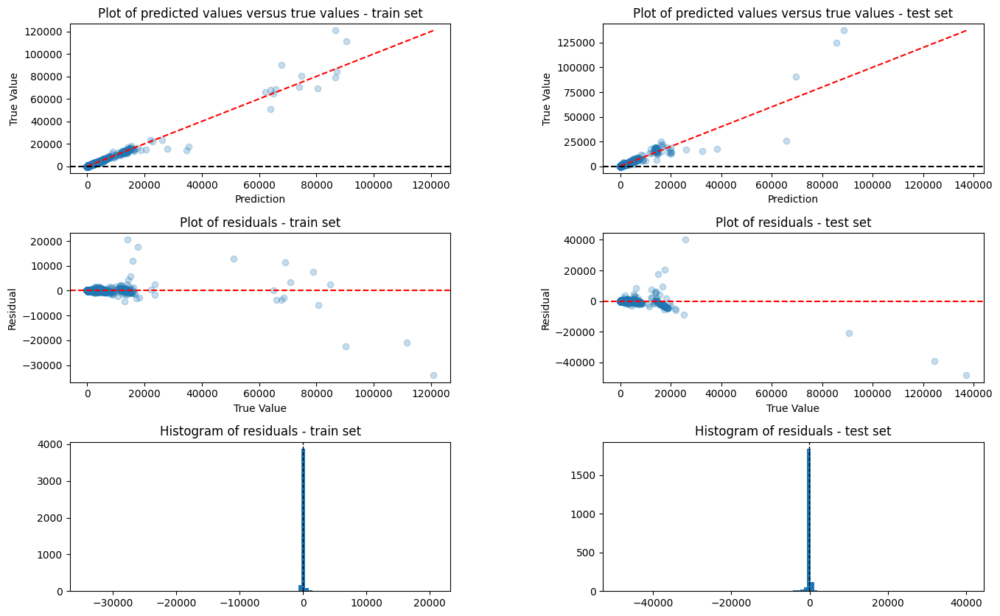

RMSE train: 937.0928680321447
DPA  train: 92.9345347327245
BIAS train: 0.3595676058055028

RMSE test:  1930.352093850745
DPA  test: 83.4225515456255
BIAS test: -3.529678980224897


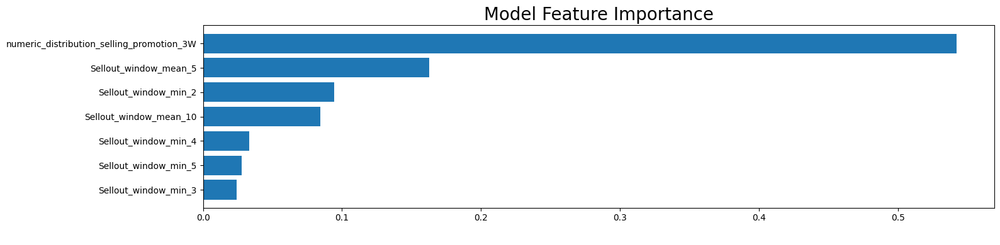

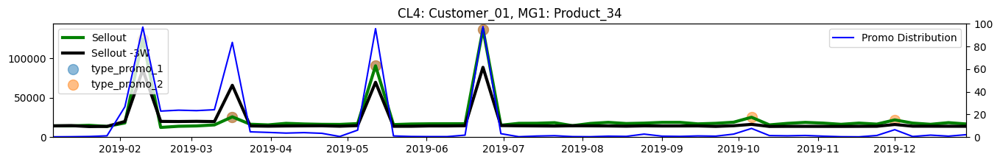

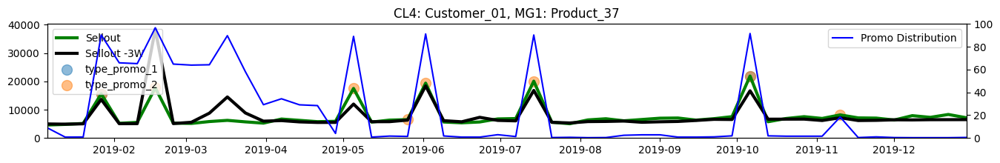

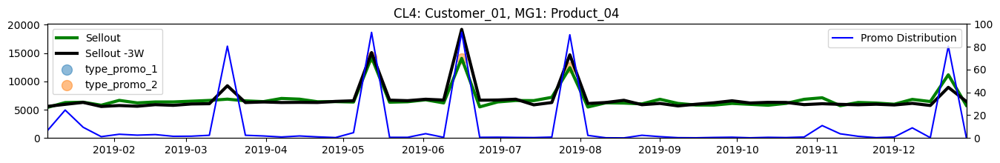

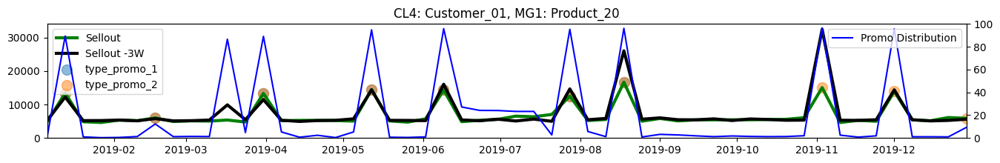

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


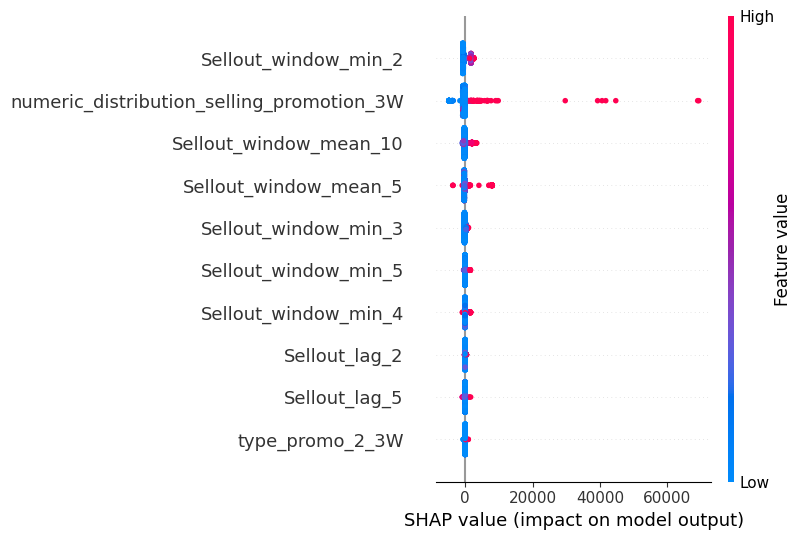

None

Finished iterating in: 60 seconds


|---------------------------	Sellout_4W	---------------------------|
--------------------------------------------------------
Creating a training set
Categoric features:
1
Selected_variables:
['Sellout_4W', 'customer_name', 'product_group', 'week_sin', 'week_cos', 'customer_name_Customer_01', 'numeric_distribution_selling_promotion_4W', 'type_promo_1_4W', 'type_promo_2_4W', 'Sellout_window_mean_5', 'Sellout_window_mean_10', 'Sellout_window_std_10', 'Sellout_window_min_10', 'Sellout_window_max_10']
Number: 14
--------------------------------------------------------
Creating a test set
--------------------------------------------------------
Fitting 5 folds for each of 6 candidates, totalling 30 fits
The best estimator: 
Pipeline(steps=[('regressor',
                 RandomForestRegressor(max_depth=5, min_samples_leaf=3,
                                       n_jobs=3, random_state=123))])

The best score: 
-19874130.103271097

The best parameters: 
{'

,week_sin,week_cos,customer_name_Customer_01,numeric_distribution_selling_promotion_6W,type_promo_1_6W,type_promo_2_6W,Sellout_window_mean_5,Sellout_window_mean_10,Sellout_window_std_10,Sellout_window_min_10,Sellout_window_max_10
PERIOD_TAG,,,,,,,,,,,
2016-10-09,-0.999561,0.029633,1,0.8,0.0,0.0,130.065898,106.720737,48.527553,0.000000,202.324730
2016-10-16,-0.98904,0.147647,1,0.1,0.0,0.0,110.945099,117.392810,31.030564,93.380644,202.324730
2016-10-23,-0.964636,0.263587,1,0.0,0.0,0.0,110.055760,117.726313,30.867513,93.380644,202.324730
2016-10-30,-0.92669,0.375828,1,0.0,0.0,0.0,112.501443,120.283164,29.662245,101.162365,202.324730
2016-11-06,-0.875735,0.482792,1,0.0,0.0,0.0,105.386727,118.837987,31.018392,86.710598,202.324730
...,...,...,...,...,...,...,...,...,...,...,...
2018-11-18,-0.737833,0.674983,1,0.2,0.0,0.0,231.979489,272.582225,66.433442,193.527055,360.491573
2018-10-28,-0.92669,0.375828,1,0.5,0.0,0.0,2578.155801,1289.077900,2001.046039,0.000000,5852.655503
2018-11-04,-0.875735,0.482792,1,0.6,0.0,0.0,3114.935710,1557.467855,1988.889728,0.000000,5852.655503


PERIOD_TAG
2016-10-09      95.603993
2016-10-16      97.827342
2016-10-23     105.609062
2016-10-30     102.274039
2016-11-06     105.609062
                 ...     
2018-11-18     263.095604
2018-10-28    1816.136972
2018-11-04    1632.389432
2018-11-11    1653.727856
2018-11-18    3072.733049
Name: Sellout_6W, Length: 4057, dtype: float64

--------------------------------------------------------
Creating a test set


,week_sin,week_cos,customer_name_Customer_01,numeric_distribution_selling_promotion_6W,type_promo_1_6W,type_promo_2_6W,Sellout_window_mean_5,Sellout_window_mean_10,Sellout_window_std_10,Sellout_window_min_10,Sellout_window_max_10
PERIOD_TAG,,,,,,,,,,,
2018-11-25,-0.652822,0.757511,1,0.0,0.0,0.0,123.395852,130.510567,23.154397,107.832411,188.984638
2018-12-02,-0.558647,0.829406,1,0.0,0.0,0.0,129.398893,132.956251,22.425349,107.832411,188.984638
2018-12-09,-0.456629,0.889657,1,0.0,0.0,0.0,129.398893,132.956251,22.425349,107.832411,188.984638
2018-12-16,-0.348202,0.93742,1,0.0,0.0,0.0,143.183655,135.290767,29.121483,107.832411,212.329799
2018-12-23,-0.234886,0.972023,1,0.0,0.0,0.0,144.739999,134.290260,29.448531,107.832411,212.329799
...,...,...,...,...,...,...,...,...,...,...,...
2019-10-13,-0.98904,0.147647,1,0.5,0.0,0.0,1730.783276,1786.263178,136.071209,1575.486968,2113.689439
2019-10-20,-0.964636,0.263587,1,1.0,0.0,0.0,1701.857857,1765.043301,151.864831,1573.116032,2113.689439
2019-10-27,-0.92669,0.375828,1,0.8,0.0,0.0,1690.477364,1760.064336,151.899374,1573.116032,2113.689439


PERIOD_TAG
2018-11-25     126.730875
2018-12-02     123.395852
2018-12-09     131.177572
2018-12-16     125.619200
2018-12-23     141.182641
                 ...     
2019-10-13    1377.513813
2019-10-20    1320.611349
2019-10-27    1626.462092
2019-11-03    1509.100761
2019-11-10    2568.909150
Name: Sellout_6W, Length: 2091, dtype: float64

--------------------------------------------------------

Evaluation charts


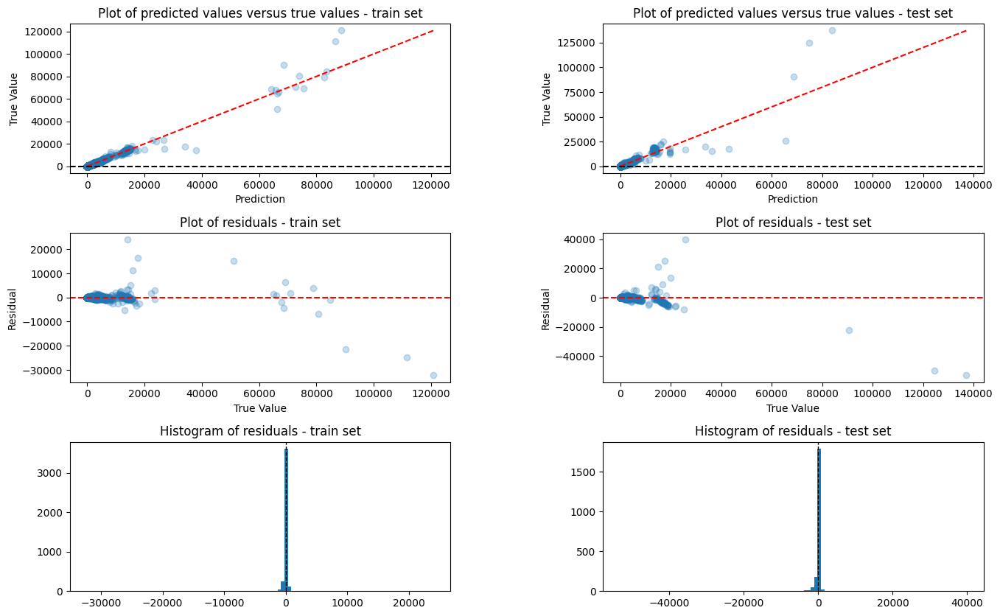

RMSE train: 965.4993303264906
DPA  train: 91.29659869013167
BIAS train: 0.024450800336613024

RMSE test:  2180.7231223623753
DPA  test: 80.57729125028787
BIAS test: -5.001165171959519


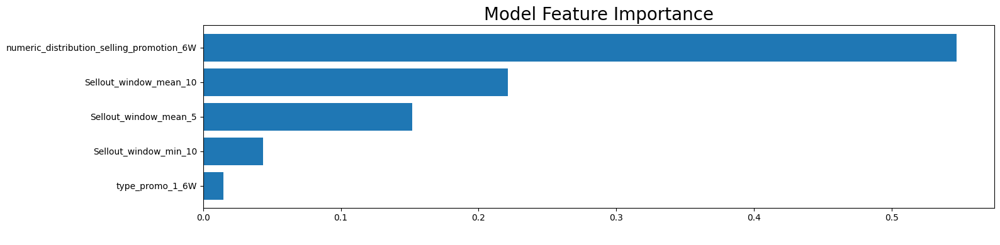

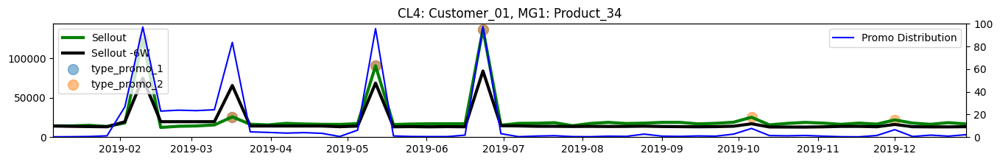

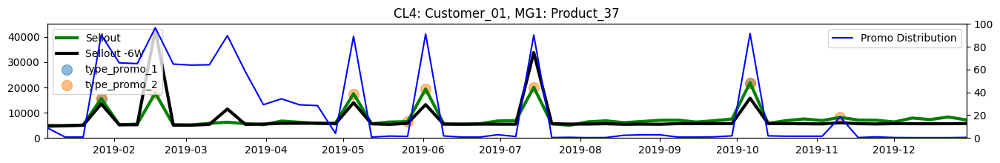

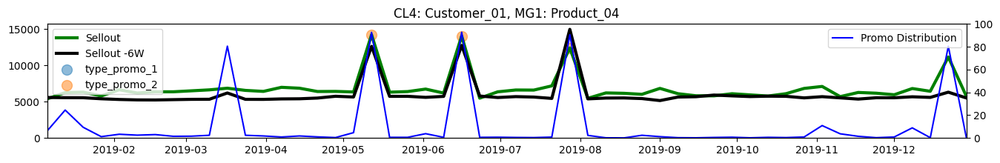

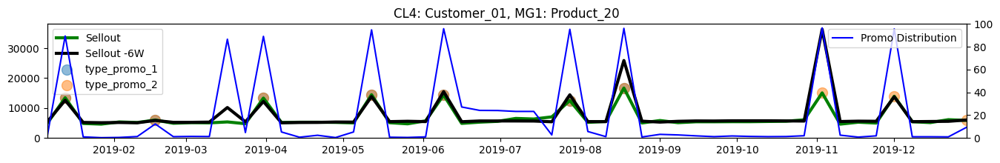

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


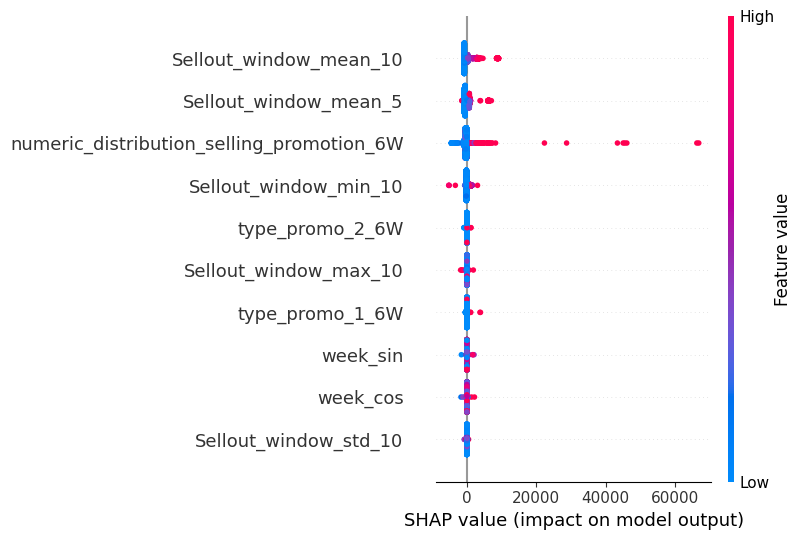

None

Finished iterating in: 9 seconds


|---------------------------	Sellout_7W	---------------------------|
--------------------------------------------------------
Creating a training set
Categoric features:
1
Selected_variables:
['Sellout_7W', 'customer_name', 'product_group', 'week_sin', 'week_cos', 'customer_name_Customer_01', 'numeric_distribution_selling_promotion_7W', 'type_promo_1_7W', 'type_promo_2_7W', 'Sellout_window_mean_5', 'Sellout_window_mean_10', 'Sellout_window_std_10', 'Sellout_window_min_10', 'Sellout_window_max_10']
Number: 14
--------------------------------------------------------
Creating a test set
--------------------------------------------------------
Finished iterating in: 3 seconds


|---------------------------	Sellout_8W	---------------------------|
--------------------------------------------------------
Creating a training set
Categoric features:
1
Selected_variables:
['Sellout_8W', 'customer_name', 'product_group', 'week_sin', 'week_cos', 'customer_name_Cu

,week_sin,week_cos,customer_name_Customer_01,numeric_distribution_selling_promotion_10W,type_promo_1_10W,type_promo_2_10W,Sellout_window_mean_5,Sellout_window_mean_10,Sellout_window_std_10,Sellout_window_min_10,Sellout_window_max_10
PERIOD_TAG,,,,,,,,,,,
2016-10-09,-0.999561,0.029633,1,0.0,0.0,0.0,130.065898,106.720737,48.527553,0.000000,202.324730
2016-10-16,-0.98904,0.147647,1,0.0,0.0,0.0,110.945099,117.392810,31.030564,93.380644,202.324730
2016-10-23,-0.964636,0.263587,1,0.0,0.0,0.0,110.055760,117.726313,30.867513,93.380644,202.324730
2016-10-30,-0.92669,0.375828,1,0.0,0.0,0.0,112.501443,120.283164,29.662245,101.162365,202.324730
2016-11-06,-0.875735,0.482792,1,0.9,0.0,0.0,105.386727,118.837987,31.018392,86.710598,202.324730
...,...,...,...,...,...,...,...,...,...,...,...
2018-09-23,-0.978556,-0.205979,1,0.1,0.0,0.0,301.801015,306.481081,40.643017,227.678888,381.994579
2018-09-30,-0.99605,-0.088796,1,0.3,0.0,0.0,308.125429,310.149241,41.861482,227.678888,381.994579
2018-10-07,-0.999561,0.029633,1,0.1,0.0,0.0,303.065898,316.600143,31.405170,263.095604,381.994579


PERIOD_TAG
2016-10-09    105.609062
2016-10-16     94.492319
2016-10-23     92.268970
2016-10-30    102.274039
2016-11-06    110.055760
                 ...    
2018-09-23    225.149123
2018-09-30    237.797950
2018-10-07    212.500296
2018-10-14    213.765178
2018-10-21    263.095604
Name: Sellout_10W, Length: 3893, dtype: float64

--------------------------------------------------------
Creating a test set


,week_sin,week_cos,customer_name_Customer_01,numeric_distribution_selling_promotion_10W,type_promo_1_10W,type_promo_2_10W,Sellout_window_mean_5,Sellout_window_mean_10,Sellout_window_std_10,Sellout_window_min_10,Sellout_window_max_10
PERIOD_TAG,,,,,,,,,,,
2018-10-28,-0.92669,0.375828,1,0.0,0.0,0.0,136.513609,136.735944,31.816250,107.832411,201.213055
2018-11-04,-0.875735,0.482792,1,0.0,0.0,0.0,136.513609,129.732395,22.344685,107.832411,188.984638
2018-11-11,-0.812487,0.582979,1,0.0,0.0,0.0,127.397879,131.066405,22.761138,107.832411,188.984638
2018-11-18,-0.737833,0.674983,1,0.0,0.0,0.0,123.840521,130.510567,23.154397,107.832411,188.984638
2018-11-25,-0.652822,0.757511,1,0.0,0.0,0.0,123.395852,130.510567,23.154397,107.832411,188.984638
...,...,...,...,...,...,...,...,...,...,...,...
2019-09-15,-0.947326,-0.32027,1,0.5,0.0,0.0,1828.228746,1879.559510,230.022374,1682.179088,2372.121463
2019-09-22,-0.978556,-0.205979,1,1.0,0.0,0.0,1829.651307,1821.708672,151.838712,1682.179088,2113.689439
2019-09-29,-0.99605,-0.088796,1,0.8,0.0,0.0,1851.701012,1794.798548,122.032208,1682.179088,2113.689439


PERIOD_TAG
2018-10-28     126.730875
2018-11-04     123.395852
2018-11-11     131.177572
2018-11-18     125.619200
2018-11-25     141.182641
                 ...     
2019-09-15    1377.513813
2019-09-22    1320.611349
2019-09-29    1626.462092
2019-10-06    1509.100761
2019-10-13    2568.909150
Name: Sellout_10W, Length: 2091, dtype: float64

--------------------------------------------------------
Fitting 5 folds for each of 6 candidates, totalling 30 fits
The best estimator: 
Pipeline(steps=[('regressor',
                 RandomForestRegressor(max_depth=10, min_samples_leaf=3,
                                       n_jobs=3, random_state=123))])

The best score: 
-20103268.030391186

The best parameters: 
{'regressor__criterion': 'squared_error', 'regressor__max_depth': 10, 'regressor__min_samples_leaf': 3, 'regressor__n_estimators': 100}

Evaluation charts


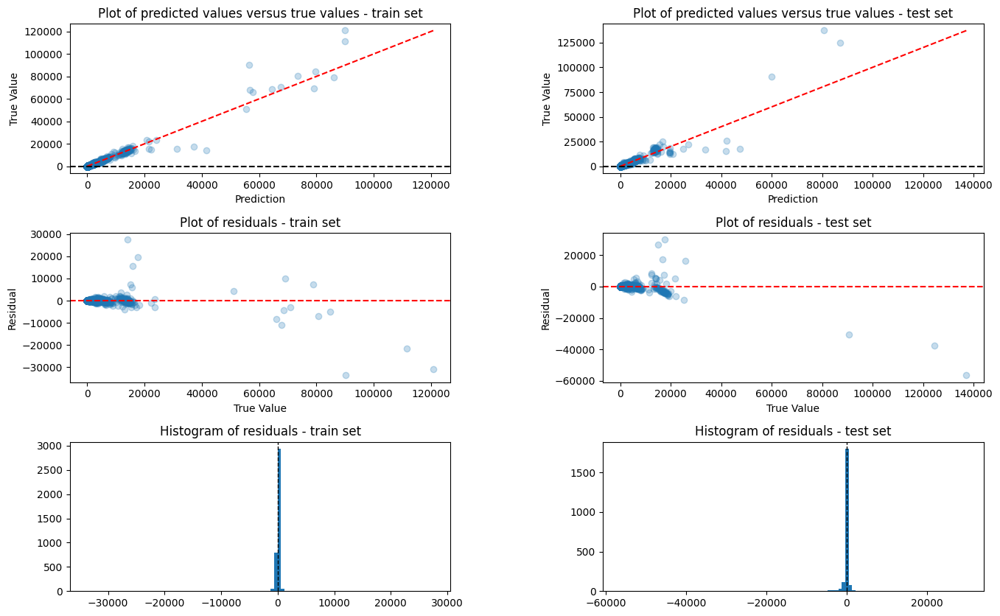

RMSE train: 1109.3559345691012
DPA  train: 90.09858374208372
BIAS train: -0.35430011014090507

RMSE test:  2071.0931737756114
DPA  test: 80.09634015809135
BIAS test: -2.414664517283086


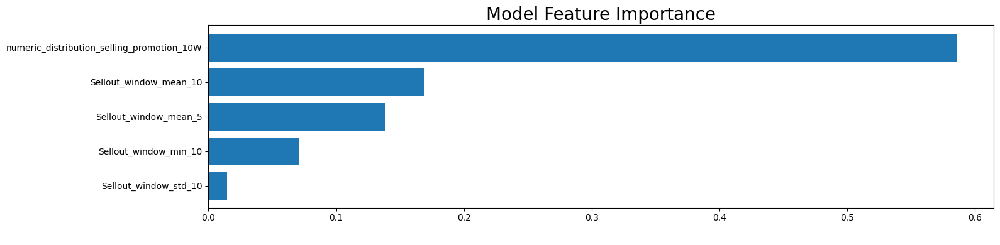

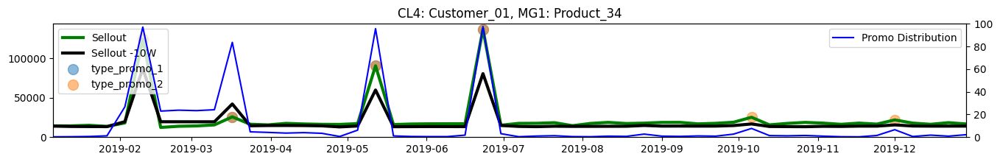

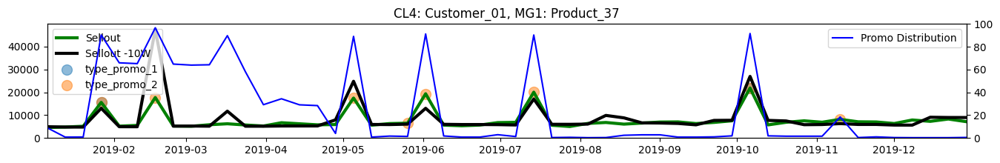

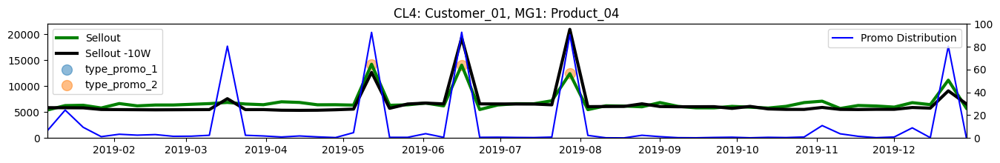

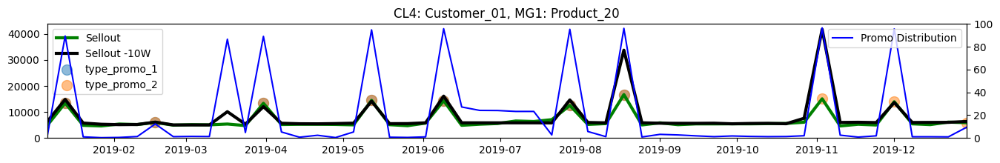

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


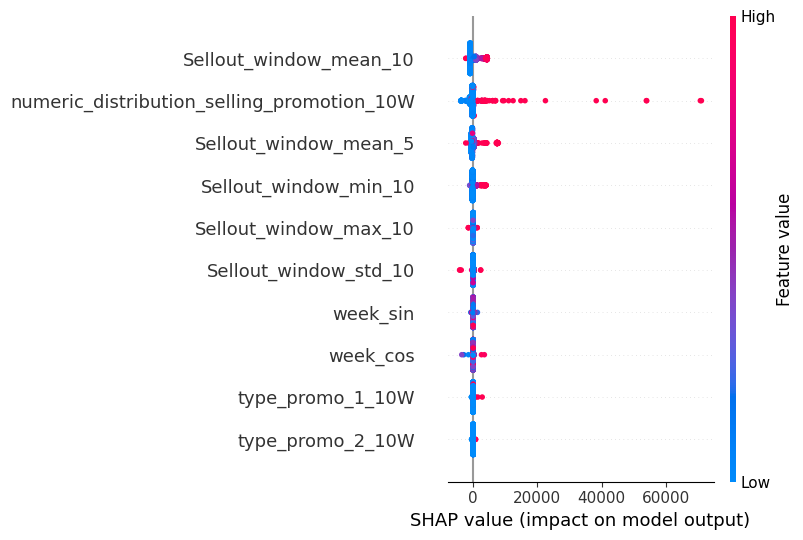

None

Finished iterating in: 25 seconds


|---------------------------	Sellout_11W	---------------------------|
--------------------------------------------------------
Creating a training set
Categoric features:
1
Selected_variables:
['Sellout_11W', 'customer_name', 'product_group', 'week_sin', 'week_cos', 'customer_name_Customer_01', 'numeric_distribution_selling_promotion_11W', 'type_promo_1_11W', 'type_promo_2_11W', 'Sellout_window_mean_5', 'Sellout_window_mean_10', 'Sellout_window_std_10', 'Sellout_window_min_10', 'Sellout_window_max_10']
Number: 14
--------------------------------------------------------
Creating a test set
--------------------------------------------------------
Finished iterating in: 3 seconds


|---------------------------	Sellout_12W	---------------------------|
--------------------------------------------------------
Creating a training set
Categoric features:
1
Selected_variables:
['Sellout_12W', 'customer_name', 'product_group', 'week_sin', 'week_cos', 'customer

,week_sin,week_cos,customer_name_Customer_01,Prediction_Sellout_2W,Prediction_Sellout_3W,Prediction_Sellout_4W,Prediction_Sellout_5W,orders_SellIn,orders_SellIn_lag_1,orders_SellIn_lag_2,...,dispatches_SellIn_window_std_4,dispatches_SellIn_window_std_5,dispatches_SellIn_window_min_2,dispatches_SellIn_window_min_3,dispatches_SellIn_window_min_4,dispatches_SellIn_window_min_5,dispatches_SellIn_window_max_2,dispatches_SellIn_window_max_3,dispatches_SellIn_window_max_4,dispatches_SellIn_window_max_5
PERIOD_TAG,,,,,,,,,,,,,,,,,,,,,
2016-10-09,-0.999561,0.029633,1,119.335008,119.980741,123.632893,112.294252,164,0.0,260.0,...,107.472089,93.122500,0.0,0.0,0.0,0.0,164.0,260.0,260.0,260.0
2016-10-16,-0.98904,0.147647,1,119.315849,103.874567,114.581641,106.886399,131,164.0,0.0,...,107.472089,93.138070,131.0,0.0,0.0,0.0,164.0,164.0,260.0,260.0
2016-10-23,-0.964636,0.263587,1,109.647681,103.787620,104.601230,103.804024,59,131.0,164.0,...,73.505102,99.672965,59.0,59.0,0.0,0.0,131.0,164.0,164.0,260.0
2016-10-30,-0.92669,0.375828,1,109.775275,106.432961,118.972864,111.830400,205,59.0,131.0,...,61.759615,82.259954,59.0,59.0,59.0,0.0,205.0,205.0,205.0,205.0
2016-11-06,-0.875735,0.482792,1,102.431278,100.525397,78.789461,100.102375,187,205.0,59.0,...,65.714027,57.508260,187.0,59.0,59.0,59.0,205.0,205.0,205.0,205.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-11-25,-0.652822,0.757511,1,2232.875128,1967.414115,2197.994364,4402.439317,345,993.0,950.0,...,1189.545677,1114.387365,345.0,345.0,345.0,345.0,993.0,993.0,3067.0,3067.0
2018-12-02,-0.558647,0.829406,1,2144.737377,1944.713092,4766.370994,2308.126712,864,345.0,993.0,...,300.163289,1051.827790,345.0,345.0,345.0,345.0,864.0,993.0,993.0,3067.0
2018-12-09,-0.456629,0.889657,1,1931.318177,4277.816497,2326.266063,2143.413008,1900,864.0,345.0,...,646.778942,561.143743,864.0,345.0,345.0,345.0,1900.0,1900.0,1900.0,1900.0


PERIOD_TAG
2016-10-09     131.0
2016-10-16      59.0
2016-10-23     205.0
2016-10-30     187.0
2016-11-06       1.0
               ...  
2018-11-25     864.0
2018-12-02    1900.0
2018-12-09    2894.0
2018-12-16     734.0
2018-12-23    1900.0
Name: orders_SellIn_1W, Length: 4262, dtype: float64

--------------------------------------------------------
Creating a test set


,week_sin,week_cos,customer_name_Customer_01,Prediction_Sellout_2W,Prediction_Sellout_3W,Prediction_Sellout_4W,Prediction_Sellout_5W,orders_SellIn,orders_SellIn_lag_1,orders_SellIn_lag_2,...,dispatches_SellIn_window_std_4,dispatches_SellIn_window_std_5,dispatches_SellIn_window_min_2,dispatches_SellIn_window_min_3,dispatches_SellIn_window_min_4,dispatches_SellIn_window_min_5,dispatches_SellIn_window_max_2,dispatches_SellIn_window_max_3,dispatches_SellIn_window_max_4,dispatches_SellIn_window_max_5
PERIOD_TAG,,,,,,,,,,,,,,,,,,,,,
2018-12-30,-0.118273,0.992981,1,145.123173,143.765756,136.770408,143.988202,403,59.0,0.0,...,183.948136,174.226003,59.0,0.0,0.0,0.0,403.0,403.0,403.0,403.0
2019-01-06,0.118273,0.992981,1,146.636684,133.753189,136.770408,142.761235,2,403.0,59.0,...,193.278728,169.314205,2.0,2.0,0.0,0.0,403.0,403.0,403.0,403.0
2019-01-13,0.234886,0.972023,1,133.957598,144.326127,136.770408,142.945351,116,2.0,403.0,...,178.185297,167.384288,2.0,2.0,2.0,0.0,116.0,403.0,403.0,403.0
2019-01-20,0.348202,0.93742,1,140.528747,137.957568,123.632893,120.912557,231,116.0,2.0,...,171.127633,159.033644,116.0,2.0,2.0,2.0,231.0,231.0,403.0,403.0
2019-01-27,0.456629,0.889657,1,134.043076,132.146959,123.632893,123.072017,57,231.0,116.0,...,98.083298,159.360284,57.0,57.0,2.0,2.0,231.0,231.0,231.0,403.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-07-28,-0.403123,-0.915146,1,1830.190383,1731.438812,1964.620058,1860.970817,2937,3247.0,1561.0,...,1028.080858,979.549795,2692.0,1561.0,997.0,997.0,3247.0,3247.0,3247.0,3247.0
2019-08-04,-0.508531,-0.861044,1,1827.335353,1868.806449,2044.114409,1858.154385,2160,2937.0,3247.0,...,721.871180,890.487675,2160.0,2160.0,1561.0,997.0,2692.0,3247.0,3247.0,3247.0
2019-08-11,-0.6068,-0.794854,1,1861.375488,1853.248758,1633.930317,1870.568795,1864,2160.0,2937.0,...,609.542656,671.970014,1864.0,1864.0,1864.0,1561.0,2160.0,2692.0,3247.0,3247.0


PERIOD_TAG
2018-12-30       2.0
2019-01-06     116.0
2019-01-13     231.0
2019-01-20      57.0
2019-01-27     173.0
               ...  
2019-07-28    2160.0
2019-08-04    1864.0
2019-08-11    1209.0
2019-08-18     738.0
2019-08-25    1040.0
Name: orders_SellIn_1W, Length: 1435, dtype: float64

--------------------------------------------------------
Fitting 5 folds for each of 6 candidates, totalling 30 fits
The best estimator: 
Pipeline(steps=[('regressor',
                 RandomForestRegressor(max_depth=10, min_samples_leaf=7,
                                       n_jobs=3, random_state=123))])

The best score: 
-16798023.950407803

The best parameters: 
{'regressor__criterion': 'squared_error', 'regressor__max_depth': 10, 'regressor__min_samples_leaf': 7, 'regressor__n_estimators': 100}

Evaluation charts


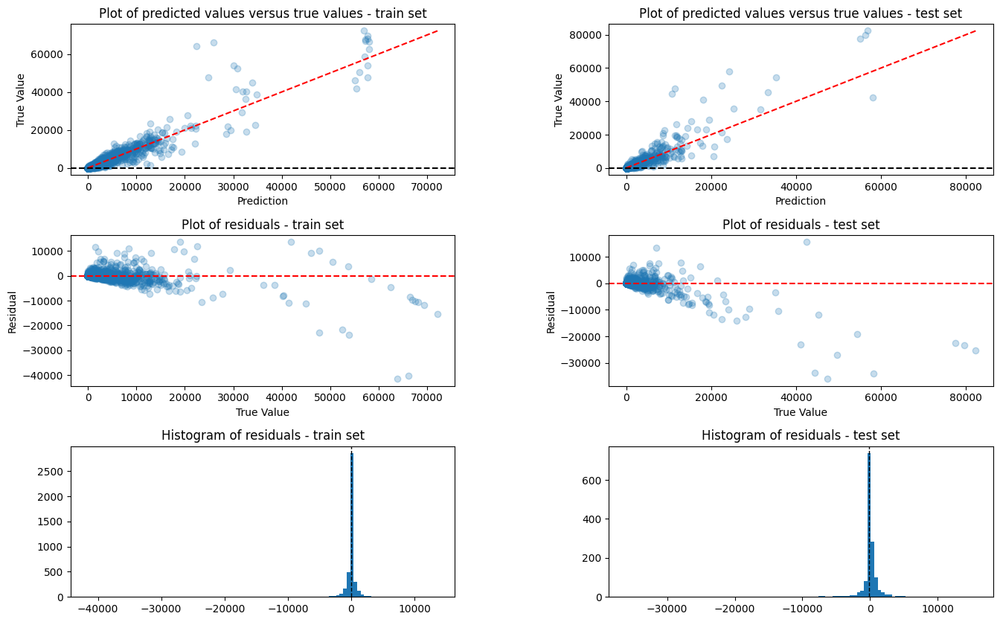

RMSE train: 1603.1657251714569
DPA  train: 72.59579111786235
BIAS train: -0.23699802416430887

RMSE test:  2765.309538488342
DPA  test: 59.93670330275053
BIAS test: -8.244895876872071


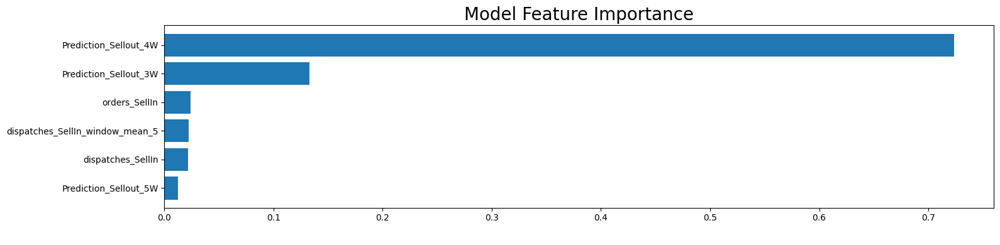

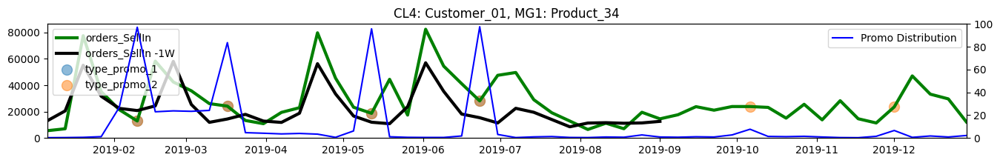

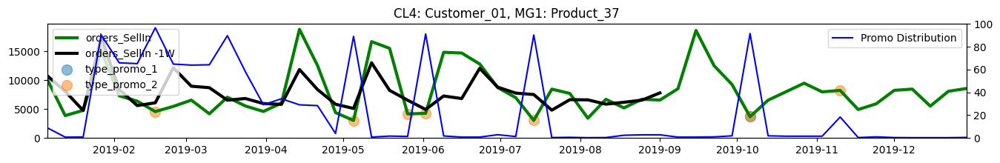

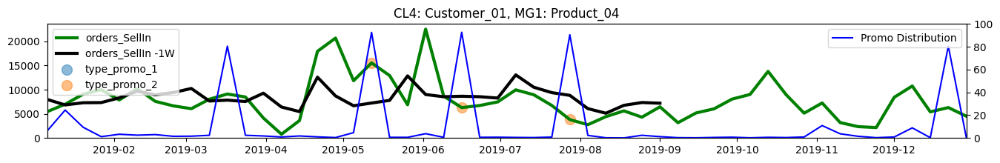

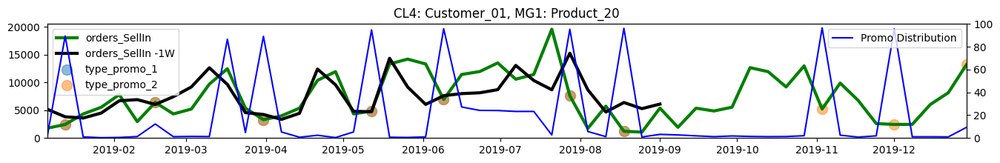

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


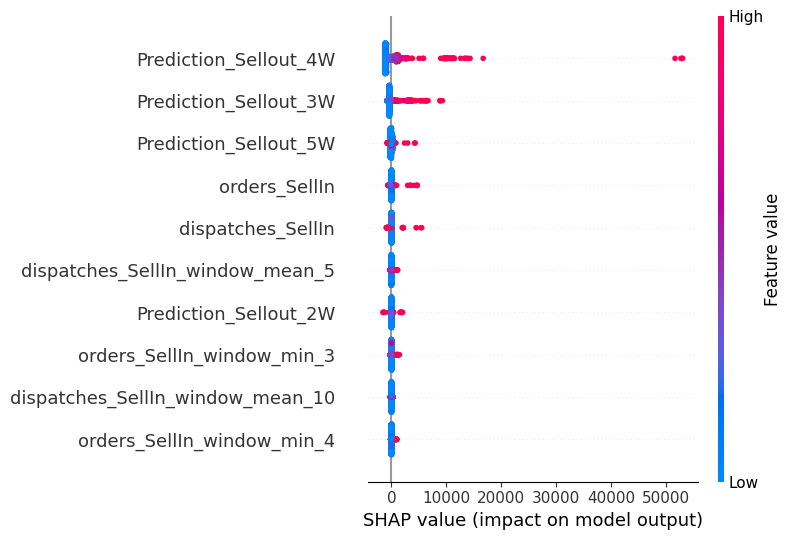

None

Finished iterating in: 99 seconds


|---------------------------	orders_SellIn_2W	---------------------------|
--------------------------------------------------------
Creating a training set
Categoric features:
1
Selected_variables:
['orders_SellIn_2W', 'customer_name', 'product_group', 'week_sin', 'week_cos', 'customer_name_Customer_01', 'Prediction_Sellout_3W', 'Prediction_Sellout_4W', 'Prediction_Sellout_5W', 'Prediction_Sellout_6W', 'orders_SellIn', 'orders_SellIn_lag_1', 'orders_SellIn_lag_2', 'orders_SellIn_lag_3', 'orders_SellIn_lag_4', 'orders_SellIn_lag_5', 'dispatches_SellIn', 'dispatches_SellIn_lag_1', 'dispatches_SellIn_lag_2', 'dispatches_SellIn_lag_3', 'dispatches_SellIn_lag_4', 'dispatches_SellIn_lag_5', 'orders_SellIn_window_std_2', 'orders_SellIn_window_std_3', 'orders_SellIn_window_std_4', 'orders_SellIn_window_std_5', 'orders_SellIn_window_min_2', 'orders_SellIn_window_min_3', 'orders_SellIn_window_min_4', 'orders_SellIn_window_min_5', 'orders_SellIn_window_max_2', 

,week_sin,week_cos,customer_name_Customer_01,Prediction_Sellout_3W,Prediction_Sellout_4W,Prediction_Sellout_5W,Prediction_Sellout_6W,orders_SellIn,orders_SellIn_lag_1,orders_SellIn_lag_2,...,dispatches_SellIn_window_std_4,dispatches_SellIn_window_std_5,dispatches_SellIn_window_min_2,dispatches_SellIn_window_min_3,dispatches_SellIn_window_min_4,dispatches_SellIn_window_min_5,dispatches_SellIn_window_max_2,dispatches_SellIn_window_max_3,dispatches_SellIn_window_max_4,dispatches_SellIn_window_max_5
PERIOD_TAG,,,,,,,,,,,,,,,,,,,,,
2016-10-09,-0.999561,0.029633,1,119.980741,123.632893,112.294252,111.734901,164,0.0,260.0,...,107.472089,93.122500,0.0,0.0,0.0,0.0,164.0,260.0,260.0,260.0
2016-10-16,-0.98904,0.147647,1,103.874567,114.581641,106.886399,107.653771,131,164.0,0.0,...,107.472089,93.138070,131.0,0.0,0.0,0.0,164.0,164.0,260.0,260.0
2016-10-23,-0.964636,0.263587,1,103.787620,104.601230,103.804024,104.347765,59,131.0,164.0,...,73.505102,99.672965,59.0,59.0,0.0,0.0,131.0,164.0,164.0,260.0
2016-10-30,-0.92669,0.375828,1,106.432961,118.972864,111.830400,107.666545,205,59.0,131.0,...,61.759615,82.259954,59.0,59.0,59.0,0.0,205.0,205.0,205.0,205.0
2016-11-06,-0.875735,0.482792,1,100.525397,78.789461,100.102375,100.520099,187,205.0,59.0,...,65.714027,57.508260,187.0,59.0,59.0,59.0,205.0,205.0,205.0,205.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-11-18,-0.737833,0.674983,1,2018.431141,1739.343621,1814.427083,4536.561418,993,950.0,3067.0,...,1035.327444,896.942027,950.0,950.0,950.0,950.0,993.0,3067.0,3067.0,3067.0
2018-11-25,-0.652822,0.757511,1,1967.414115,2197.994364,4402.439317,2297.195904,345,993.0,950.0,...,1189.545677,1114.387365,345.0,345.0,345.0,345.0,993.0,993.0,3067.0,3067.0
2018-12-02,-0.558647,0.829406,1,1944.713092,4766.370994,2308.126712,2392.615401,864,345.0,993.0,...,300.163289,1051.827790,345.0,345.0,345.0,345.0,864.0,993.0,993.0,3067.0


PERIOD_TAG
2016-10-09      59.0
2016-10-16     205.0
2016-10-23     187.0
2016-10-30       1.0
2016-11-06     154.0
               ...  
2018-11-18     864.0
2018-11-25    1900.0
2018-12-02    2894.0
2018-12-09     734.0
2018-12-16    1900.0
Name: orders_SellIn_2W, Length: 4221, dtype: float64

--------------------------------------------------------
Creating a test set


,week_sin,week_cos,customer_name_Customer_01,Prediction_Sellout_3W,Prediction_Sellout_4W,Prediction_Sellout_5W,Prediction_Sellout_6W,orders_SellIn,orders_SellIn_lag_1,orders_SellIn_lag_2,...,dispatches_SellIn_window_std_4,dispatches_SellIn_window_std_5,dispatches_SellIn_window_min_2,dispatches_SellIn_window_min_3,dispatches_SellIn_window_min_4,dispatches_SellIn_window_min_5,dispatches_SellIn_window_max_2,dispatches_SellIn_window_max_3,dispatches_SellIn_window_max_4,dispatches_SellIn_window_max_5
PERIOD_TAG,,,,,,,,,,,,,,,,,,,,,
2018-12-23,-0.234886,0.972023,1,140.764183,131.554790,137.858626,144.165620,59,0.0,59.0,...,127.406175,118.971845,0.0,0.0,0.0,0.0,59.0,59.0,288.0,288.0
2018-12-30,-0.118273,0.992981,1,143.765756,136.770408,143.988202,146.166096,403,59.0,0.0,...,183.948136,174.226003,59.0,0.0,0.0,0.0,403.0,403.0,403.0,403.0
2019-01-06,0.118273,0.992981,1,133.753189,136.770408,142.761235,145.631395,2,403.0,59.0,...,193.278728,169.314205,2.0,2.0,0.0,0.0,403.0,403.0,403.0,403.0
2019-01-13,0.234886,0.972023,1,144.326127,136.770408,142.945351,145.631395,116,2.0,403.0,...,178.185297,167.384288,2.0,2.0,2.0,0.0,116.0,403.0,403.0,403.0
2019-01-20,0.348202,0.93742,1,137.957568,123.632893,120.912557,115.580018,231,116.0,2.0,...,171.127633,159.033644,116.0,2.0,2.0,2.0,231.0,231.0,403.0,403.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-07-28,-0.403123,-0.915146,1,1731.438812,1964.620058,1860.970817,1837.342689,2937,3247.0,1561.0,...,1028.080858,979.549795,2692.0,1561.0,997.0,997.0,3247.0,3247.0,3247.0,3247.0
2019-08-04,-0.508531,-0.861044,1,1868.806449,2044.114409,1858.154385,1956.641603,2160,2937.0,3247.0,...,721.871180,890.487675,2160.0,2160.0,1561.0,997.0,2692.0,3247.0,3247.0,3247.0
2019-08-11,-0.6068,-0.794854,1,1853.248758,1633.930317,1870.568795,1779.816779,1864,2160.0,2937.0,...,609.542656,671.970014,1864.0,1864.0,1864.0,1561.0,2160.0,2692.0,3247.0,3247.0


PERIOD_TAG
2018-12-23       2.0
2018-12-30     116.0
2019-01-06     231.0
2019-01-13      57.0
2019-01-20     173.0
               ...  
2019-07-28    1864.0
2019-08-04    1209.0
2019-08-11     738.0
2019-08-18    1040.0
2019-08-25    1086.0
Name: orders_SellIn_2W, Length: 1476, dtype: float64

--------------------------------------------------------
Fitting 5 folds for each of 6 candidates, totalling 30 fits
The best estimator: 
Pipeline(steps=[('regressor',
                 RandomForestRegressor(max_depth=5, min_samples_leaf=3,
                                       n_jobs=3, random_state=123))])

The best score: 
-16472352.995202597

The best parameters: 
{'regressor__criterion': 'squared_error', 'regressor__max_depth': 5, 'regressor__min_samples_leaf': 3, 'regressor__n_estimators': 100}

Evaluation charts


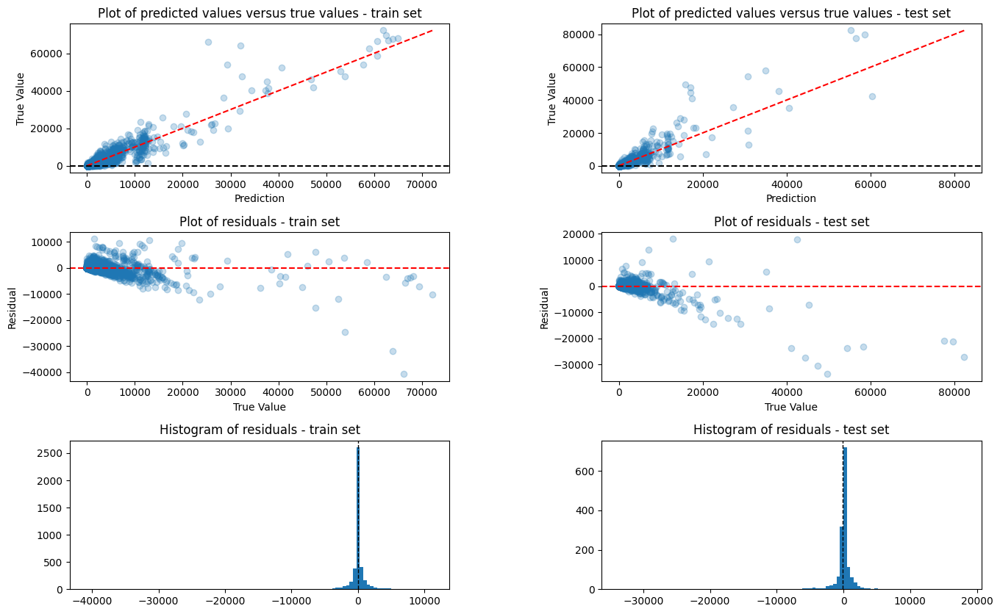

RMSE train: 1583.2604807368127
DPA  train: 66.39067743990587
BIAS train: -0.2932045932881409

RMSE test:  2695.7538458833715
DPA  test: 59.173875505039554
BIAS test: -7.986049338781983


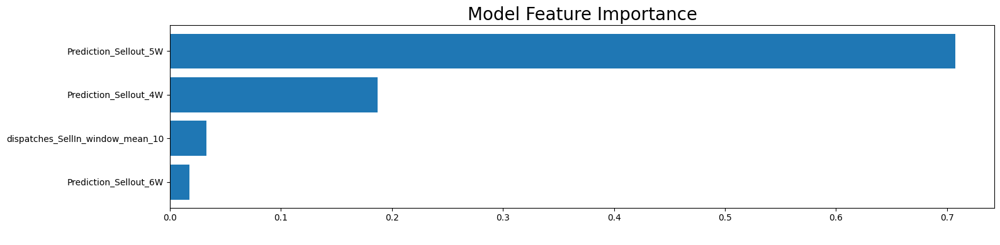

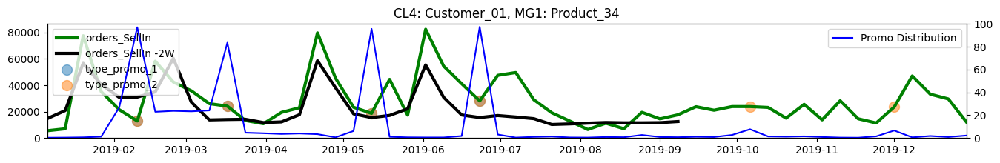

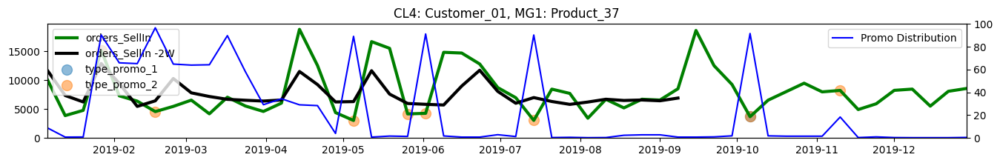

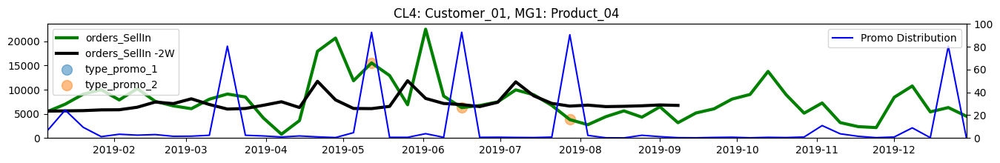

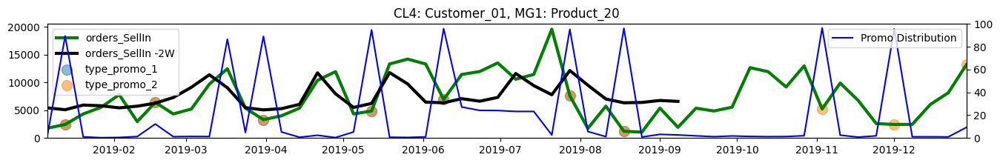

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


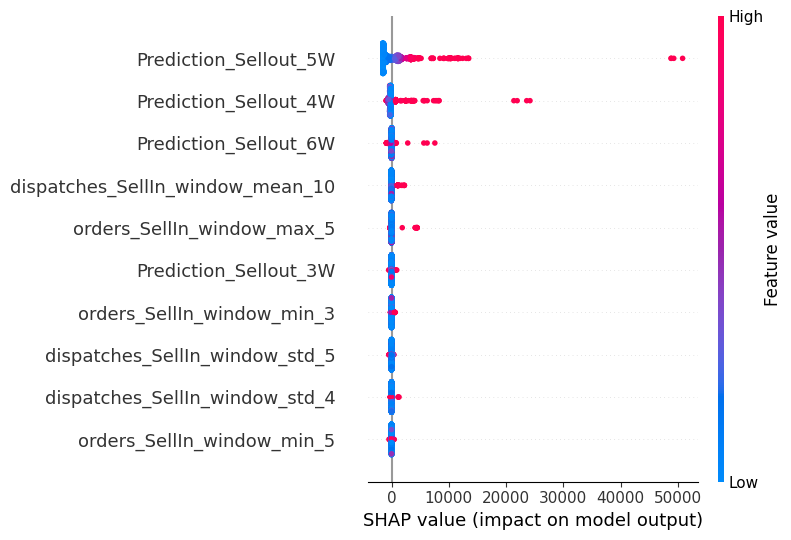

None

Finished iterating in: 98 seconds


|---------------------------	orders_SellIn_3W	---------------------------|
--------------------------------------------------------
Creating a training set
Categoric features:
1
Selected_variables:
['orders_SellIn_3W', 'customer_name', 'product_group', 'week_sin', 'week_cos', 'customer_name_Customer_01', 'Prediction_Sellout_4W', 'Prediction_Sellout_5W', 'Prediction_Sellout_6W', 'Prediction_Sellout_7W', 'orders_SellIn', 'orders_SellIn_lag_1', 'orders_SellIn_lag_2', 'orders_SellIn_lag_3', 'orders_SellIn_lag_4', 'orders_SellIn_lag_5', 'dispatches_SellIn', 'dispatches_SellIn_lag_1', 'dispatches_SellIn_lag_2', 'dispatches_SellIn_lag_3', 'dispatches_SellIn_lag_4', 'dispatches_SellIn_lag_5', 'orders_SellIn_window_std_2', 'orders_SellIn_window_std_3', 'orders_SellIn_window_std_4', 'orders_SellIn_window_std_5', 'orders_SellIn_window_min_2', 'orders_SellIn_window_min_3', 'orders_SellIn_window_min_4', 'orders_SellIn_window_min_5', 'orders_SellIn_window_max_2', 

,week_sin,week_cos,customer_name_Customer_01,Prediction_Sellout_4W,Prediction_Sellout_5W,Prediction_Sellout_6W,Prediction_Sellout_7W,orders_SellIn,orders_SellIn_lag_1,orders_SellIn_lag_2,...,dispatches_SellIn_window_std_4,dispatches_SellIn_window_std_5,dispatches_SellIn_window_min_2,dispatches_SellIn_window_min_3,dispatches_SellIn_window_min_4,dispatches_SellIn_window_min_5,dispatches_SellIn_window_max_2,dispatches_SellIn_window_max_3,dispatches_SellIn_window_max_4,dispatches_SellIn_window_max_5
PERIOD_TAG,,,,,,,,,,,,,,,,,,,,,
2016-10-09,-0.999561,0.029633,1,123.632893,112.294252,111.734901,111.964847,164,0.0,260.0,...,107.472089,93.122500,0.0,0.0,0.0,0.0,164.0,260.0,260.0,260.0
2016-10-16,-0.98904,0.147647,1,114.581641,106.886399,107.653771,104.999319,131,164.0,0.0,...,107.472089,93.138070,131.0,0.0,0.0,0.0,164.0,164.0,260.0,260.0
2016-10-23,-0.964636,0.263587,1,104.601230,103.804024,104.347765,103.936434,59,131.0,164.0,...,73.505102,99.672965,59.0,59.0,0.0,0.0,131.0,164.0,164.0,260.0
2016-10-30,-0.92669,0.375828,1,118.972864,111.830400,107.666545,105.354632,205,59.0,131.0,...,61.759615,82.259954,59.0,59.0,59.0,0.0,205.0,205.0,205.0,205.0
2016-11-06,-0.875735,0.482792,1,78.789461,100.102375,100.520099,100.547412,187,205.0,59.0,...,65.714027,57.508260,187.0,59.0,59.0,59.0,205.0,205.0,205.0,205.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-11-11,-0.812487,0.582979,1,1684.606057,1815.667981,1841.848431,3802.800551,950,3067.0,2289.0,...,889.844322,933.300970,950.0,950.0,950.0,842.0,3067.0,3067.0,3067.0,3067.0
2018-11-18,-0.737833,0.674983,1,1739.343621,1814.427083,4536.561418,2117.943045,993,950.0,3067.0,...,1035.327444,896.942027,950.0,950.0,950.0,950.0,993.0,3067.0,3067.0,3067.0
2018-11-25,-0.652822,0.757511,1,2197.994364,4402.439317,2297.195904,2438.100930,345,993.0,950.0,...,1189.545677,1114.387365,345.0,345.0,345.0,345.0,993.0,993.0,3067.0,3067.0


PERIOD_TAG
2016-10-09     205.0
2016-10-16     187.0
2016-10-23       1.0
2016-10-30     154.0
2016-11-06     129.0
               ...  
2018-11-11     864.0
2018-11-18    1900.0
2018-11-25    2894.0
2018-12-02     734.0
2018-12-09    1900.0
Name: orders_SellIn_3W, Length: 4180, dtype: float64

--------------------------------------------------------
Creating a test set


,week_sin,week_cos,customer_name_Customer_01,Prediction_Sellout_4W,Prediction_Sellout_5W,Prediction_Sellout_6W,Prediction_Sellout_7W,orders_SellIn,orders_SellIn_lag_1,orders_SellIn_lag_2,...,dispatches_SellIn_window_std_4,dispatches_SellIn_window_std_5,dispatches_SellIn_window_min_2,dispatches_SellIn_window_min_3,dispatches_SellIn_window_min_4,dispatches_SellIn_window_min_5,dispatches_SellIn_window_max_2,dispatches_SellIn_window_max_3,dispatches_SellIn_window_max_4,dispatches_SellIn_window_max_5
PERIOD_TAG,,,,,,,,,,,,,,,,,,,,,
2018-12-16,-0.348202,0.93742,1,131.554790,134.826709,144.000862,148.652818,0,59.0,288.0,...,136.600085,148.508586,0.0,0.0,0.0,0.0,59.0,288.0,288.0,288.0
2018-12-23,-0.234886,0.972023,1,131.554790,137.858626,144.165620,152.215427,59,0.0,59.0,...,127.406175,118.971845,0.0,0.0,0.0,0.0,59.0,59.0,288.0,288.0
2018-12-30,-0.118273,0.992981,1,136.770408,143.988202,146.166096,156.440652,403,59.0,0.0,...,183.948136,174.226003,59.0,0.0,0.0,0.0,403.0,403.0,403.0,403.0
2019-01-06,0.118273,0.992981,1,136.770408,142.761235,145.631395,153.890762,2,403.0,59.0,...,193.278728,169.314205,2.0,2.0,0.0,0.0,403.0,403.0,403.0,403.0
2019-01-13,0.234886,0.972023,1,136.770408,142.945351,145.631395,153.890762,116,2.0,403.0,...,178.185297,167.384288,2.0,2.0,2.0,0.0,116.0,403.0,403.0,403.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-07-28,-0.403123,-0.915146,1,1964.620058,1860.970817,1837.342689,1890.711133,2937,3247.0,1561.0,...,1028.080858,979.549795,2692.0,1561.0,997.0,997.0,3247.0,3247.0,3247.0,3247.0
2019-08-04,-0.508531,-0.861044,1,2044.114409,1858.154385,1956.641603,1869.185703,2160,2937.0,3247.0,...,721.871180,890.487675,2160.0,2160.0,1561.0,997.0,2692.0,3247.0,3247.0,3247.0
2019-08-11,-0.6068,-0.794854,1,1633.930317,1870.568795,1779.816779,1674.560661,1864,2160.0,2937.0,...,609.542656,671.970014,1864.0,1864.0,1864.0,1561.0,2160.0,2692.0,3247.0,3247.0


PERIOD_TAG
2018-12-16       2.0
2018-12-23     116.0
2018-12-30     231.0
2019-01-06      57.0
2019-01-13     173.0
               ...  
2019-07-28    1209.0
2019-08-04     738.0
2019-08-11    1040.0
2019-08-18    1086.0
2019-08-25    1946.0
Name: orders_SellIn_3W, Length: 1517, dtype: float64

--------------------------------------------------------
Fitting 5 folds for each of 6 candidates, totalling 30 fits
The best estimator: 
Pipeline(steps=[('regressor',
                 RandomForestRegressor(max_depth=10, min_samples_leaf=7,
                                       n_jobs=3, random_state=123))])

The best score: 
-16230699.240834033

The best parameters: 
{'regressor__criterion': 'squared_error', 'regressor__max_depth': 10, 'regressor__min_samples_leaf': 7, 'regressor__n_estimators': 100}

Evaluation charts


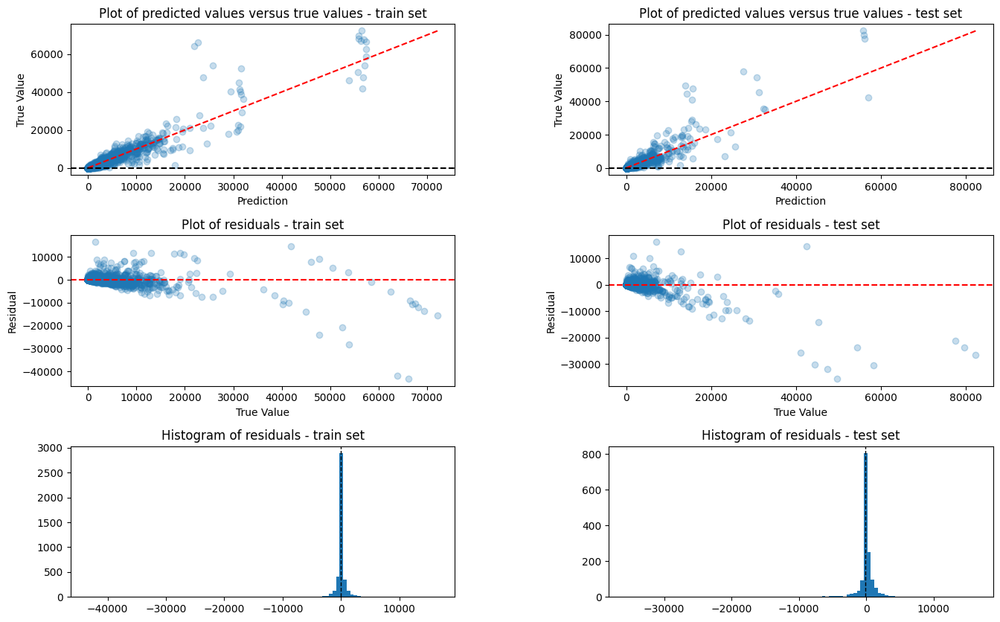

RMSE train: 1697.5405587419352
DPA  train: 71.82918729212119
BIAS train: 0.12999872588631148

RMSE test:  2774.8361007807075
DPA  test: 58.092181449855886
BIAS test: -6.389276335245091


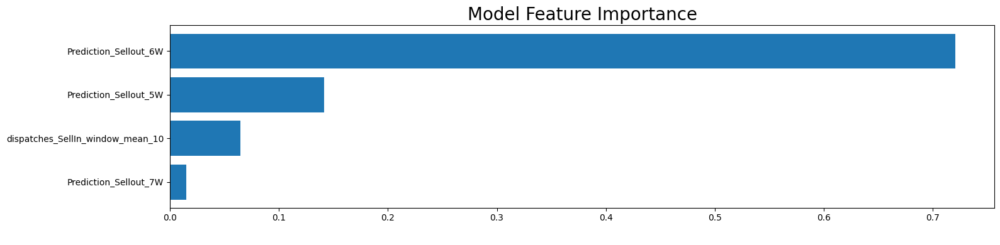

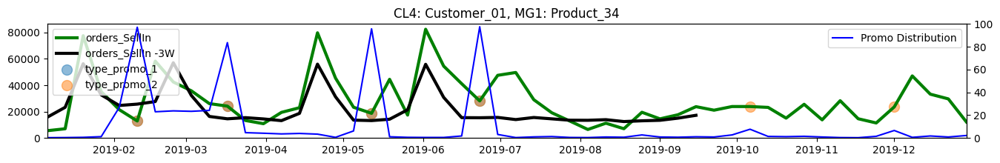

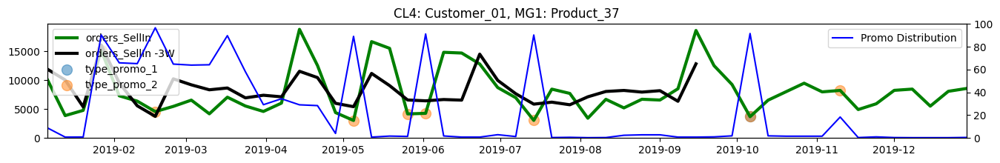

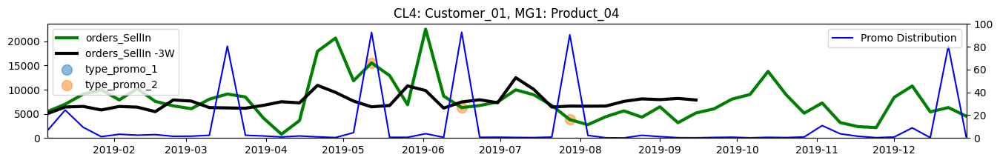

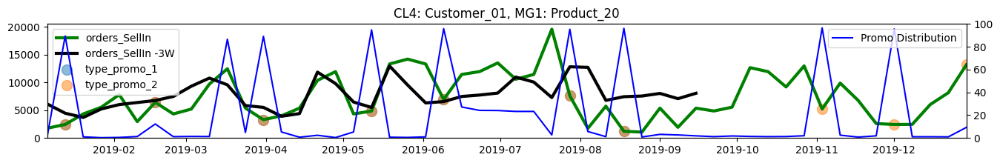

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


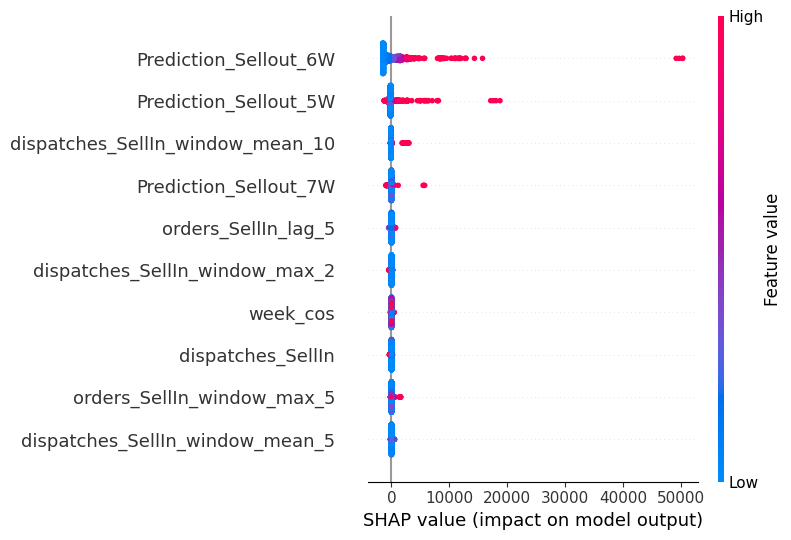

None

Finished iterating in: 98 seconds


|---------------------------	orders_SellIn_4W	---------------------------|
--------------------------------------------------------
Creating a training set
Categoric features:
1
Selected_variables:
['orders_SellIn_4W', 'customer_name', 'product_group', 'week_sin', 'week_cos', 'customer_name_Customer_01', 'Prediction_Sellout_5W', 'Prediction_Sellout_6W', 'Prediction_Sellout_7W', 'Prediction_Sellout_8W', 'dispatches_SellIn_window_mean_5', 'dispatches_SellIn_window_mean_10', 'orders_SellIn_window_std_10', 'orders_SellIn_window_min_10', 'orders_SellIn_window_max_10', 'dispatches_SellIn_window_std_10', 'dispatches_SellIn_window_min_10', 'dispatches_SellIn_window_max_10', 'difference_window_sum_10']
Number: 19
--------------------------------------------------------
Creating a test set
--------------------------------------------------------
Fitting 5 folds for each of 6 candidates, totalling 30 fits
The best estimator: 
Pipeline(steps=[('regressor',
     

,week_sin,week_cos,customer_name_Customer_01,Prediction_Sellout_7W,Prediction_Sellout_8W,Prediction_Sellout_9W,Prediction_Sellout_10W,dispatches_SellIn_window_mean_5,dispatches_SellIn_window_mean_10,orders_SellIn_window_std_10,orders_SellIn_window_min_10,orders_SellIn_window_max_10,dispatches_SellIn_window_std_10,dispatches_SellIn_window_min_10,dispatches_SellIn_window_max_10,difference_window_sum_10
PERIOD_TAG,,,,,,,,,,,,,,,,
2016-10-09,-0.999561,0.029633,1,111.964847,109.798010,104.140538,103.834914,137.4,106.9,78.377222,0.0,260.0,78.592408,0.0,260.0,2.0
2016-10-16,-0.98904,0.147647,1,104.999319,106.747543,105.347154,103.705791,137.2,107.0,78.410317,0.0,260.0,78.625696,0.0,260.0,2.0
2016-10-23,-0.964636,0.263587,1,103.936434,103.225264,102.680039,101.497830,122.8,112.5,72.203724,0.0,260.0,72.288388,0.0,260.0,1.0
2016-10-30,-0.92669,0.375828,1,105.354632,108.155453,108.555693,106.172242,111.8,120.0,77.883745,0.0,260.0,77.972930,0.0,260.0,1.0
2016-11-06,-0.875735,0.482792,1,100.547412,98.965274,98.333642,107.399519,149.2,132.6,77.451132,0.0,260.0,77.558867,0.0,260.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-11-18,-0.737833,0.674983,1,234.897914,240.388121,236.715594,235.288647,246.2,217.8,190.784812,34.0,576.0,190.784812,34.0,576.0,0.0
2018-10-28,-0.92669,0.375828,1,1417.820267,1644.975313,3745.300128,1691.928852,2461.2,2638.8,1311.250840,1015.0,5011.0,1304.717321,842.0,5011.0,523.0
2018-11-04,-0.875735,0.482792,1,1582.567100,3793.420055,1812.281238,1902.549805,2307.4,2595.6,1288.597209,1015.0,5011.0,1279.988472,842.0,5011.0,523.0


PERIOD_TAG
2016-10-09     154.0
2016-10-16     129.0
2016-10-23     203.0
2016-10-30     167.0
2016-11-06       2.0
               ...  
2018-11-18     207.0
2018-10-28    1900.0
2018-11-04    2894.0
2018-11-11     734.0
2018-11-18    1900.0
Name: orders_SellIn_6W, Length: 4057, dtype: float64

--------------------------------------------------------
Creating a test set


,week_sin,week_cos,customer_name_Customer_01,Prediction_Sellout_7W,Prediction_Sellout_8W,Prediction_Sellout_9W,Prediction_Sellout_10W,dispatches_SellIn_window_mean_5,dispatches_SellIn_window_mean_10,orders_SellIn_window_std_10,orders_SellIn_window_min_10,orders_SellIn_window_max_10,dispatches_SellIn_window_std_10,dispatches_SellIn_window_min_10,dispatches_SellIn_window_max_10,difference_window_sum_10
PERIOD_TAG,,,,,,,,,,,,,,,,
2018-11-25,-0.652822,0.757511,1,114.230591,116.758110,123.325018,114.708247,128.4,122.0,102.442396,2.0,289.0,102.442396,2.0,289.0,0.0
2018-12-02,-0.558647,0.829406,1,117.132173,116.993408,124.397446,118.847534,185.0,133.5,114.543781,2.0,289.0,114.543781,2.0,289.0,0.0
2018-12-09,-0.456629,0.889657,1,117.132173,116.993408,124.397446,118.847534,185.2,133.6,114.470957,2.0,289.0,114.470957,2.0,289.0,0.0
2018-12-16,-0.348202,0.93742,1,148.652818,144.891160,140.415154,123.054592,127.4,121.9,122.082349,0.0,289.0,122.082349,0.0,289.0,0.0
2018-12-23,-0.234886,0.972023,1,152.215427,146.837518,140.982779,128.721190,81.6,116.3,123.707585,0.0,289.0,123.707585,0.0,289.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-07-28,-0.403123,-0.915146,1,1890.711133,1788.581456,1817.009542,1835.896727,1941.6,1849.3,855.713971,649.0,3247.0,848.101285,649.0,3247.0,1209.0
2019-08-04,-0.508531,-0.861044,1,1869.185703,1823.497592,1884.814080,1993.408766,2131.4,2000.4,718.977677,997.0,3247.0,737.938901,997.0,3247.0,1209.0
2019-08-11,-0.6068,-0.794854,1,1674.560661,1693.724713,1676.171062,1748.244053,2304.8,1938.2,709.758519,997.0,3247.0,718.415974,997.0,3247.0,1194.0


PERIOD_TAG
2018-11-25       2.0
2018-12-02     116.0
2018-12-09     231.0
2018-12-16      57.0
2018-12-23     173.0
               ...  
2019-07-28    1086.0
2019-08-04    1946.0
2019-08-11    1863.0
2019-08-18    1946.0
2019-08-25    1476.0
Name: orders_SellIn_6W, Length: 1640, dtype: float64

--------------------------------------------------------

Evaluation charts


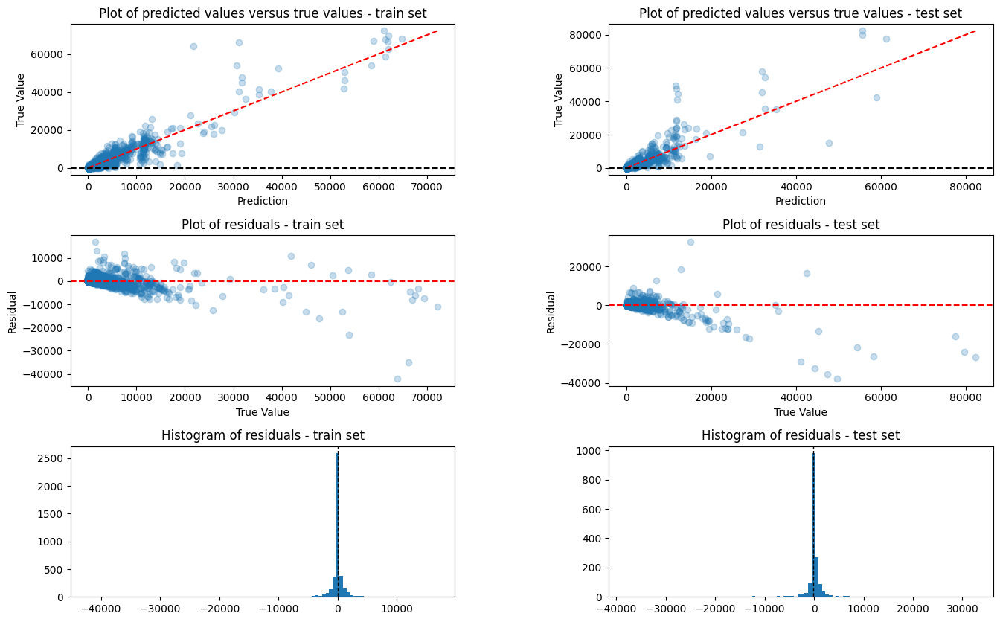

RMSE train: 1664.979912453574
DPA  train: 65.99798410544861
BIAS train: -0.2445621743567173

RMSE test:  2933.395144282113
DPA  test: 57.145674136254954
BIAS test: -7.735432561859028


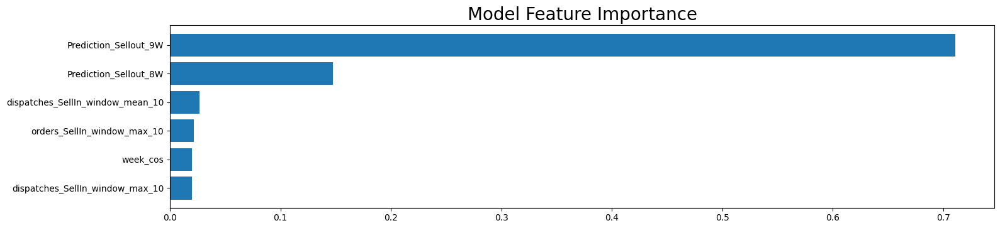

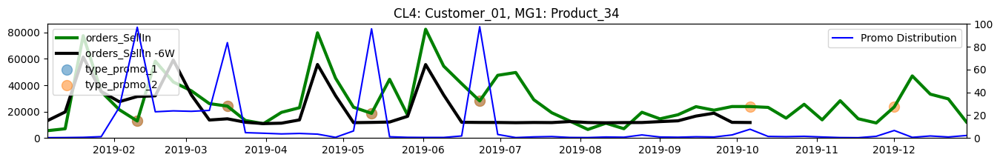

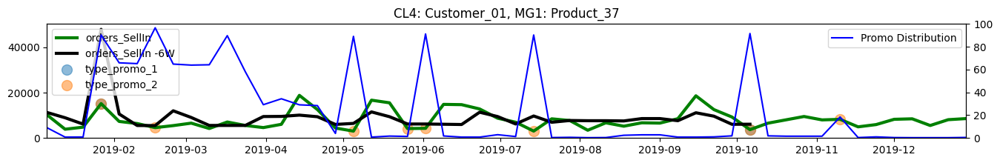

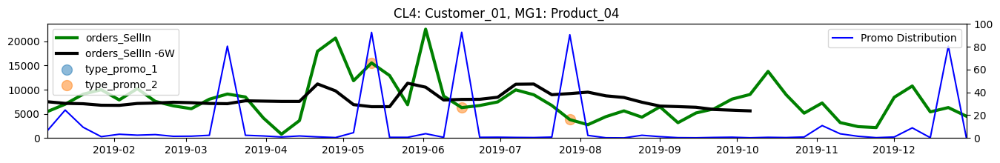

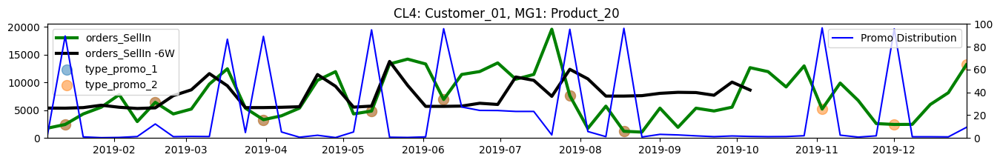

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


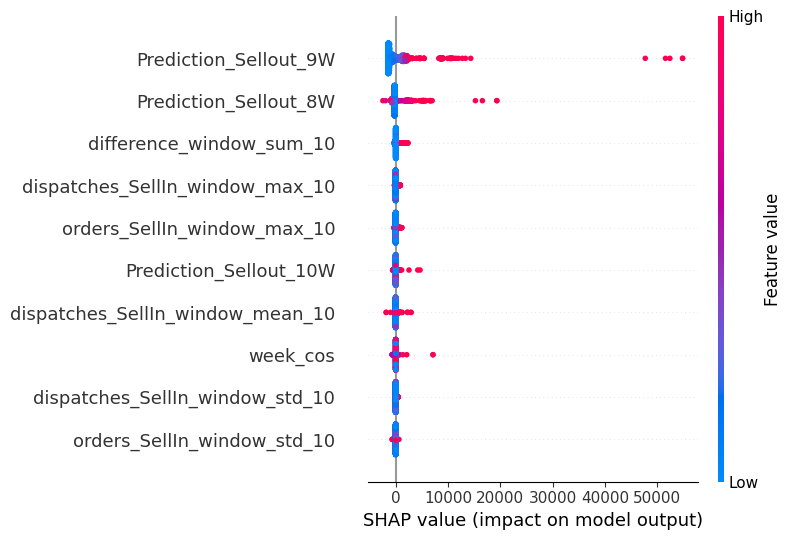

None

Finished iterating in: 10 seconds


|---------------------------	orders_SellIn_7W	---------------------------|
--------------------------------------------------------
Creating a training set
Categoric features:
1
Selected_variables:
['orders_SellIn_7W', 'customer_name', 'product_group', 'week_sin', 'week_cos', 'customer_name_Customer_01', 'Prediction_Sellout_8W', 'Prediction_Sellout_9W', 'Prediction_Sellout_10W', 'Prediction_Sellout_11W', 'dispatches_SellIn_window_mean_5', 'dispatches_SellIn_window_mean_10', 'orders_SellIn_window_std_10', 'orders_SellIn_window_min_10', 'orders_SellIn_window_max_10', 'dispatches_SellIn_window_std_10', 'dispatches_SellIn_window_min_10', 'dispatches_SellIn_window_max_10', 'difference_window_sum_10']
Number: 19
--------------------------------------------------------
Creating a test set
--------------------------------------------------------
Finished iterating in: 6 seconds


|---------------------------	orders_SellIn_8W	---------------------------|
----

,week_sin,week_cos,customer_name_Customer_01,Prediction_Sellout_11W,Prediction_Sellout_12W,Prediction_Sellout_13W,Prediction_Sellout_14W,dispatches_SellIn_window_mean_5,dispatches_SellIn_window_mean_10,orders_SellIn_window_std_10,orders_SellIn_window_min_10,orders_SellIn_window_max_10,dispatches_SellIn_window_std_10,dispatches_SellIn_window_min_10,dispatches_SellIn_window_max_10,difference_window_sum_10
PERIOD_TAG,,,,,,,,,,,,,,,,
2016-10-09,-0.999561,0.029633,1,101.418635,99.326715,99.071520,111.792077,137.4,106.9,78.377222,0.0,260.0,78.592408,0.0,260.0,2.0
2016-10-16,-0.98904,0.147647,1,101.150075,99.636858,103.182826,92.397734,137.2,107.0,78.410317,0.0,260.0,78.625696,0.0,260.0,2.0
2016-10-23,-0.964636,0.263587,1,99.287465,101.789996,96.093416,103.224402,122.8,112.5,72.203724,0.0,260.0,72.288388,0.0,260.0,1.0
2016-10-30,-0.92669,0.375828,1,118.749559,107.844114,113.470932,100.711178,111.8,120.0,77.883745,0.0,260.0,77.972930,0.0,260.0,1.0
2016-11-06,-0.875735,0.482792,1,96.671764,101.992530,90.697028,89.214939,149.2,132.6,77.451132,0.0,260.0,77.558867,0.0,260.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-09-23,-0.978556,-0.205979,1,264.487384,272.049006,263.818860,279.429794,219.0,133.5,154.384981,0.0,532.0,154.384981,0.0,532.0,0.0
2018-09-30,-0.99605,-0.088796,1,265.060717,261.627190,283.125834,278.644325,214.4,130.1,155.501661,0.0,532.0,155.501661,0.0,532.0,0.0
2018-10-07,-0.999561,0.029633,1,276.087246,319.047110,334.676496,333.334705,200.8,142.9,151.939644,0.0,532.0,151.939644,0.0,532.0,0.0


PERIOD_TAG
2016-10-09      2.0
2016-10-16    262.0
2016-10-23      0.0
2016-10-30    131.0
2016-11-06      0.0
              ...  
2018-09-23     34.0
2018-09-30     57.0
2018-10-07     23.0
2018-10-14     34.0
2018-10-21    207.0
Name: orders_SellIn_10W, Length: 3893, dtype: float64

--------------------------------------------------------
Creating a test set


,week_sin,week_cos,customer_name_Customer_01,Prediction_Sellout_11W,Prediction_Sellout_12W,Prediction_Sellout_13W,Prediction_Sellout_14W,dispatches_SellIn_window_mean_5,dispatches_SellIn_window_mean_10,orders_SellIn_window_std_10,orders_SellIn_window_min_10,orders_SellIn_window_max_10,dispatches_SellIn_window_std_10,dispatches_SellIn_window_min_10,dispatches_SellIn_window_max_10,difference_window_sum_10
PERIOD_TAG,,,,,,,,,,,,,,,,
2018-10-28,-0.92669,0.375828,1,124.567463,130.621951,129.547690,119.085494,82.0,110.2,82.759088,0.0,288.0,82.759088,0.0,288.0,0.0
2018-11-04,-0.875735,0.482792,1,125.471617,132.460180,134.105408,129.286186,82.0,104.5,84.339591,0.0,288.0,84.339591,0.0,288.0,0.0
2018-11-11,-0.812487,0.582979,1,124.206026,122.385117,127.524339,114.229849,116.4,121.8,102.704322,0.0,289.0,102.704322,0.0,289.0,0.0
2018-11-18,-0.737833,0.674983,1,122.921373,121.827805,127.524339,113.720063,151.0,121.8,102.704322,0.0,289.0,102.704322,0.0,289.0,0.0
2018-11-25,-0.652822,0.757511,1,122.921373,121.827805,127.524339,113.720063,128.4,122.0,102.442396,2.0,289.0,102.442396,2.0,289.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-07-28,-0.403123,-0.915146,1,1838.947409,1781.096818,1814.945014,1848.682799,1941.6,1849.3,855.713971,649.0,3247.0,848.101285,649.0,3247.0,1209.0
2019-08-04,-0.508531,-0.861044,1,1885.803938,1824.204039,1862.684185,1946.780001,2131.4,2000.4,718.977677,997.0,3247.0,737.938901,997.0,3247.0,1209.0
2019-08-11,-0.6068,-0.794854,1,1714.281780,1679.865206,1581.472921,1659.576463,2304.8,1938.2,709.758519,997.0,3247.0,718.415974,997.0,3247.0,1194.0


PERIOD_TAG
2018-10-28       2.0
2018-11-04     116.0
2018-11-11     231.0
2018-11-18      57.0
2018-11-25     173.0
               ...  
2019-07-28    1476.0
2019-08-04    2377.0
2019-08-11    1391.0
2019-08-18    2289.0
2019-08-25    2338.0
Name: orders_SellIn_10W, Length: 1804, dtype: float64

--------------------------------------------------------
Fitting 5 folds for each of 6 candidates, totalling 30 fits
The best estimator: 
Pipeline(steps=[('regressor',
                 RandomForestRegressor(max_depth=10, min_samples_leaf=7,
                                       n_jobs=3, random_state=123))])

The best score: 
-16303991.886084354

The best parameters: 
{'regressor__criterion': 'squared_error', 'regressor__max_depth': 10, 'regressor__min_samples_leaf': 7, 'regressor__n_estimators': 100}

Evaluation charts


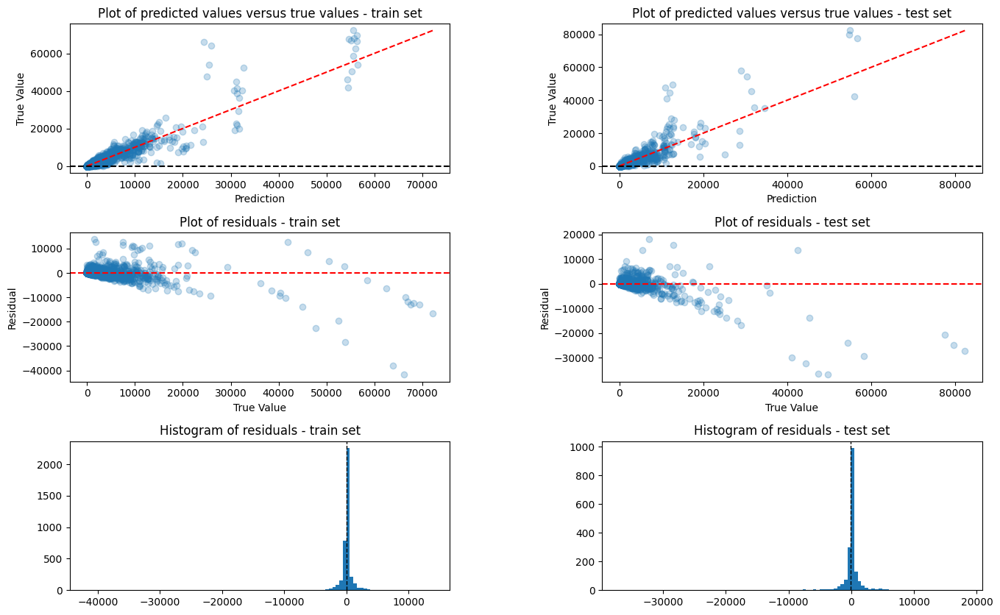

RMSE train: 1761.987217796113
DPA  train: 69.5973008854256
BIAS train: -0.18747801044942078

RMSE test:  2774.9069170269167
DPA  test: 58.47936555309276
BIAS test: -5.978591263567655


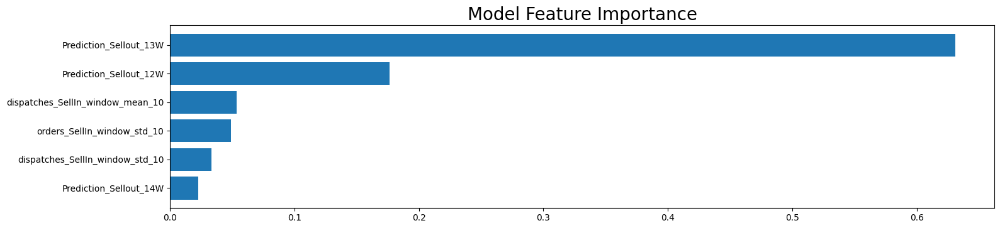

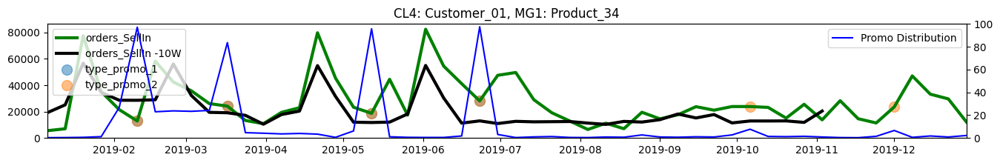

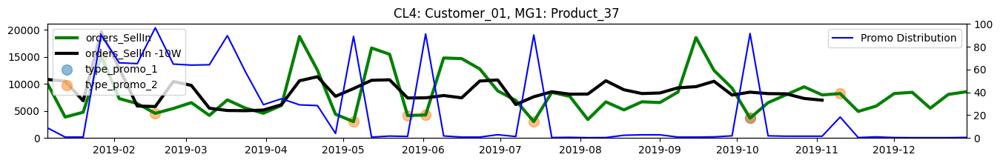

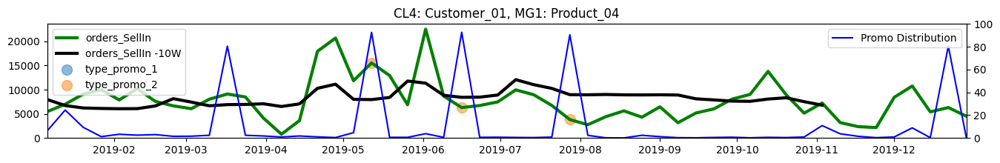

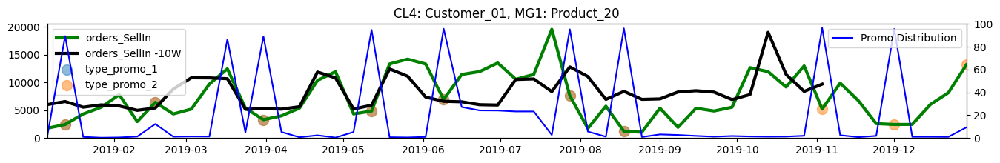

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


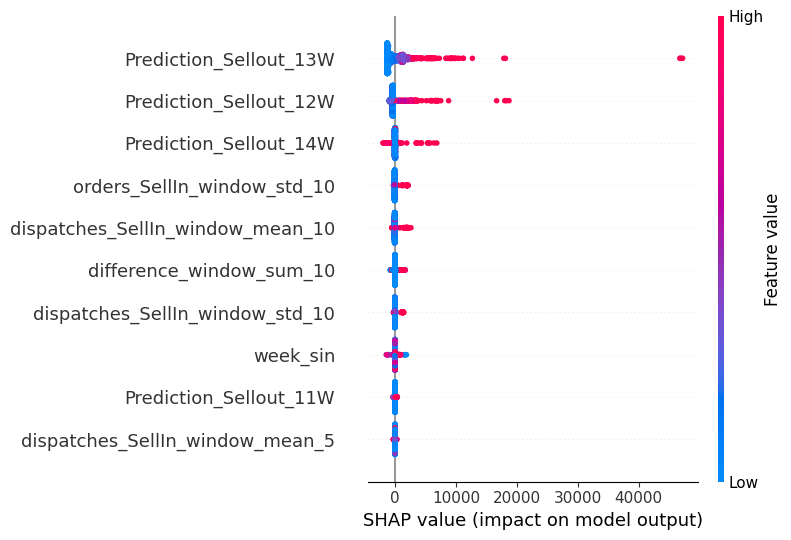

None

Finished iterating in: 39 seconds


|---------------------------	orders_SellIn_11W	---------------------------|
--------------------------------------------------------
Creating a training set
Categoric features:
1
Selected_variables:
['orders_SellIn_11W', 'customer_name', 'product_group', 'week_sin', 'week_cos', 'customer_name_Customer_01', 'Prediction_Sellout_12W', 'Prediction_Sellout_13W', 'Prediction_Sellout_14W', 'Prediction_Sellout_15W', 'dispatches_SellIn_window_mean_5', 'dispatches_SellIn_window_mean_10', 'orders_SellIn_window_std_10', 'orders_SellIn_window_min_10', 'orders_SellIn_window_max_10', 'dispatches_SellIn_window_std_10', 'dispatches_SellIn_window_min_10', 'dispatches_SellIn_window_max_10', 'difference_window_sum_10']
Number: 19
--------------------------------------------------------
Creating a test set
--------------------------------------------------------
Finished iterating in: 6 seconds


|---------------------------	orders_SellIn_12W	---------------------------|

In [37]:
dataset_copied = dataset.copy()

for horizon_prediction in target_columns:
    start_time = time.time()
    print(f'|---------------------------\t{horizon_prediction}\t---------------------------|')
    if horizon_prediction[:7] == 'Sellout':
        nr_horizon = int(horizon_prediction[8:-1])
        type_prediction = 'Sellout'
        target_name = 'Sellout'
    elif horizon_prediction[:13] == 'orders_SellIn':
        nr_horizon = int(horizon_prediction[14:-1])
        type_prediction = 'orders_SellIn'
        target_name = 'orders_SellIn'
    
    ################################################################ Prepare Train Test Sets ######################
    print('--------------------------------------------------------')
    pipeline_preprocessing.set_params(feature_engineering_transformer__nr_horizon=nr_horizon,
                                      feature_engineering_transformer__type_forecast=type_prediction,
                                      feature_engineering_transformer__target=target_name)
    ##### Train ##
    print('Creating a training set')
    train_set = pipeline_preprocessing.fit_transform(
        dataset_copied.loc[dataset_copied['PERIOD_TAG']<first_test_date, :])
    X_train = train_set.drop([horizon_prediction]+['customer_name', 'product_group'], axis = 1).copy()
    y_train = train_set[horizon_prediction].copy()
    if nr_horizon in [1, 2, 3, 6, 10, 25, 52]:
        display(X_train)
        display(y_train)

    print('--------------------------------------------------------')
    ##### Test ##
    print('Creating a test set')
    all_set = pipeline_preprocessing.transform(dataset_copied)
    X = all_set.drop([horizon_prediction]+['customer_name', 'product_group'], axis = 1).copy()
    y = all_set[horizon_prediction].copy()
    
    test_set = all_set.loc[((all_set.index>=(first_test_date - pd.DateOffset(weeks=nr_horizon)))&\
                            (all_set.index<=(end_test_date - pd.DateOffset(weeks=nr_horizon)))), :].copy()
    X_test = test_set.drop([horizon_prediction]+['customer_name', 'product_group'], axis = 1).copy()
    y_test = test_set[horizon_prediction].copy()
    if nr_horizon in [1, 2, 3, 6, 10, 25, 52]:
        display(X_test)
        display(y_test)
    print('--------------------------------------------------------')
    
    
    ################################################################ Hyperparameter Optimization ####################
    random_forest_pipeline = Pipeline(steps=[('regressor', RandomForestRegressor(random_state=123, n_jobs=3))])
    
    param_random_forest = {
        'regressor__max_depth': [5, 10, 15],
        'regressor__min_samples_leaf': [3, 7],
        'regressor__n_estimators': [100],
        #'regressor__criterion': ['mse'],
        'regressor__criterion': ['squared_error'], # {'poisson', 'friedman_mse', 'absolute_error', 'squared_error'}
    }
    if nr_horizon in [1, 2, 3, 4, 5, 10, 20, 30, 40, 52]:
      
        random_forest = GridSearchCV(random_forest_pipeline, param_random_forest, 
                                     cv=TimeSeriesSplit(n_splits=5).split(X_train), n_jobs=3, 
                                     scoring = 'neg_mean_squared_error', verbose=10)

        random_forest.fit(X_train, y_train)
        print("The best estimator: ", random_forest.best_estimator_,
              "\nThe best score: ", random_forest.best_score_,
              "\nThe best parameters: ", random_forest.best_params_, sep="\n")

        random_forest_model = random_forest.best_estimator_
        best_params = random_forest.best_params_
    else:
        random_forest_model = random_forest_pipeline.set_params(**best_params)
        random_forest_model.fit(X_train, y_train)
    
    ################################################################ Add a forecast to a dataset ####################
    all_set[f'Prediction_{type_prediction}_{nr_horizon}W'] = random_forest_model.predict(X)
    all_set.reset_index(inplace=True)
    dataset_copied = pd.merge(dataset_copied,
                              all_set[['PERIOD_TAG', 'customer_name', 'product_group',
                                       f'Prediction_{type_prediction}_{nr_horizon}W']],
                              how='left',
                              on=['PERIOD_TAG', 'customer_name', 'product_group'])
    
    if nr_horizon in [1, 2, 3, 6, 10, 25, 52]:
        print('\nEvaluation charts')
        ### Evaluation check
        model_evaluation(model = random_forest_model,
                         Xtrain = X_train, ytrain = y_train,
                         Xtest  = X_test,  ytest  = y_test)
        ### Plot true vs predictions per biggest CL4/MG1
        plot_true_pred(df=dataset_copied, big_prod=biggest_products, number=4, target=target_name,
                       type_pred=type_prediction, horizon=nr_horizon, scenario=scenario)
        ### model interpretability
        explainer = shap.TreeExplainer(random_forest_model.named_steps["regressor"])
        shap_values = explainer.shap_values(X_test, approximate=True)
        p = shap.summary_plot(shap_values, X_test, max_display=10)
        display(p)
        
    
    ################################################################ Save models !!!!!!!!!!!! ####################
    dump(random_forest_model, 
         f'content/output/models/model_{horizon_prediction}.pkl',
         compress=True)
    dump(random_forest_model.get_params(), 
         f'content/output/hyperparameters/hyperparameters_{horizon_prediction}.pkl',
         compress=True)
    dump(pipeline_preprocessing, 
         f'content/output/preprocessing/preprocessing_{horizon_prediction}.pkl',
         compress=True)
    
    
    elapsed_time = time.time() - start_time
    print("Finished iterating in: " + str(int(elapsed_time))  + " seconds")
    print('\n')

# 6. Make the Forecast

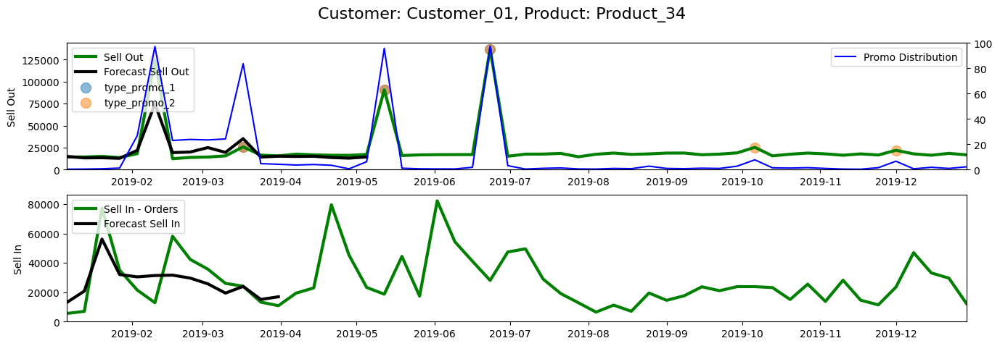

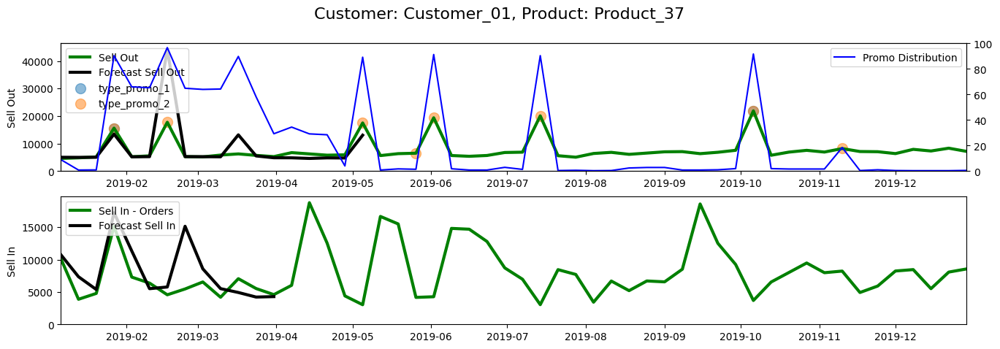

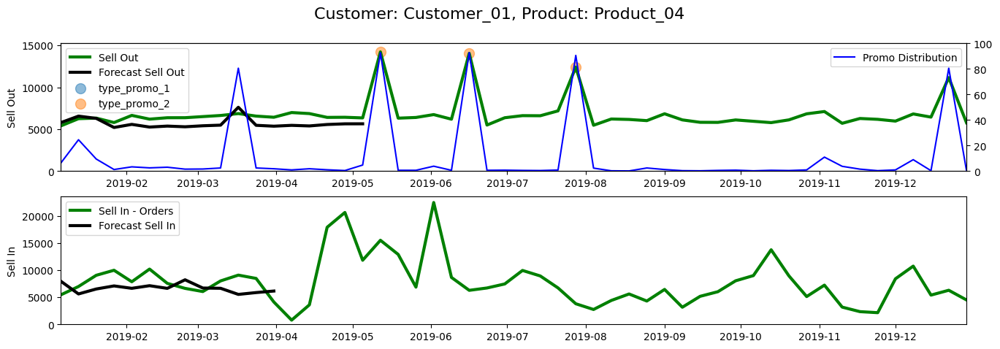

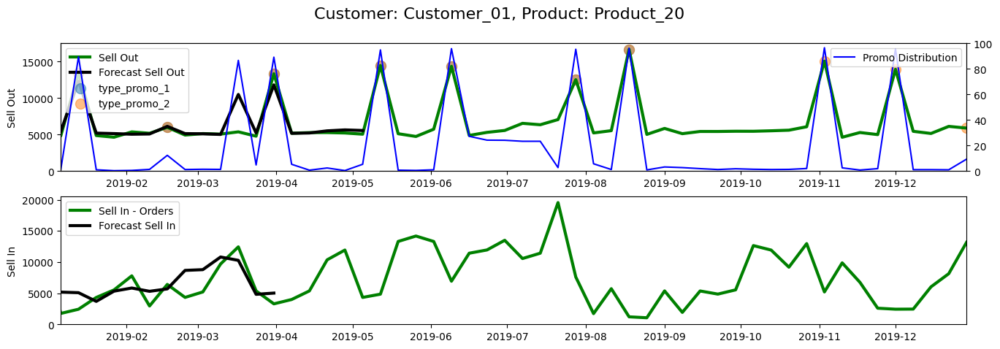

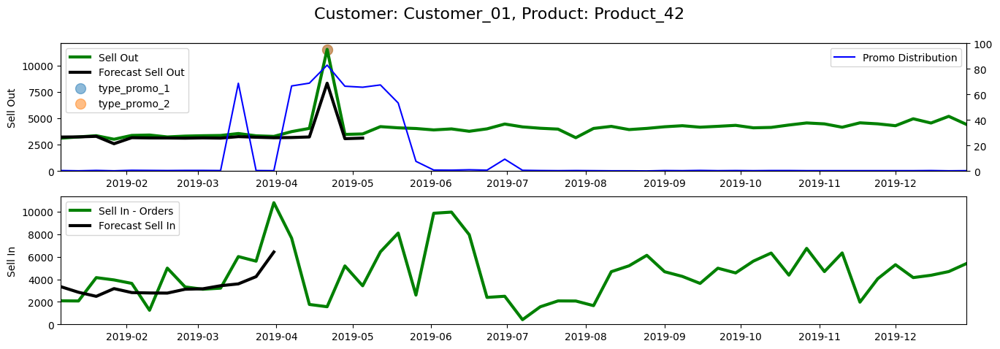

...

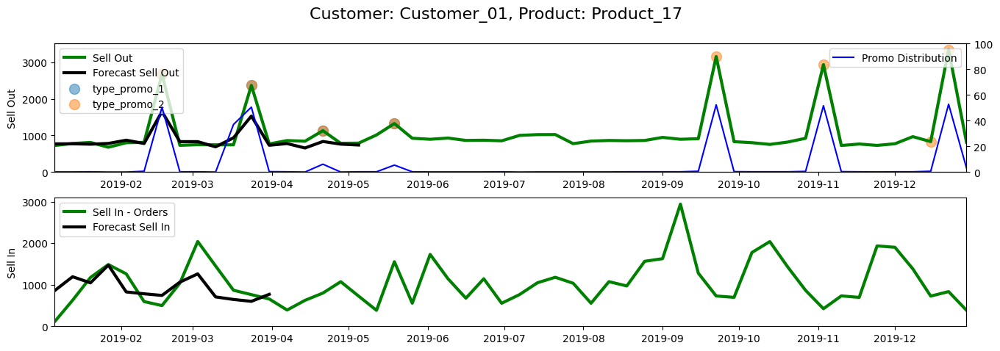

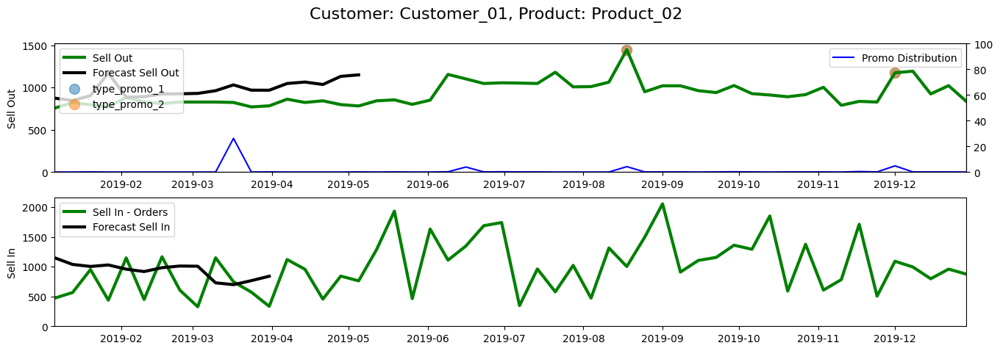

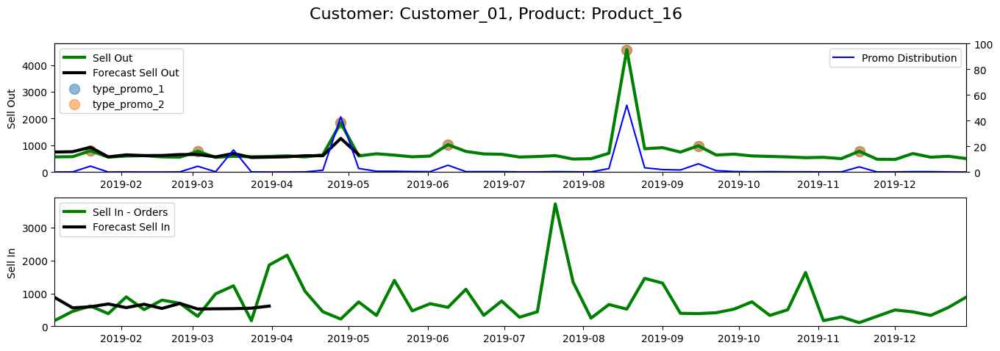

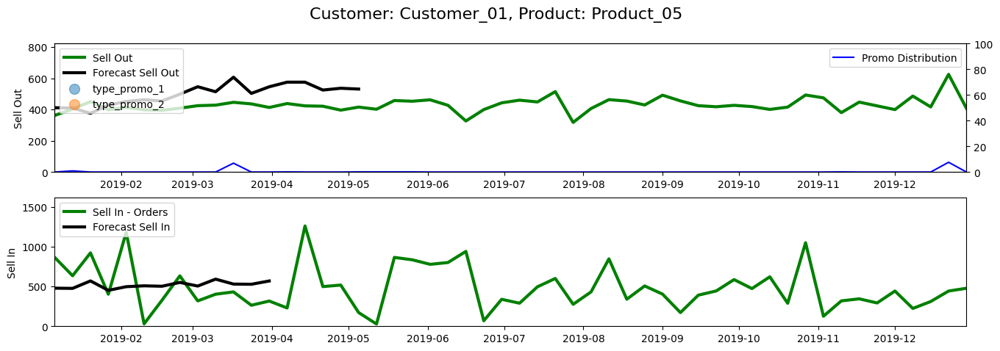

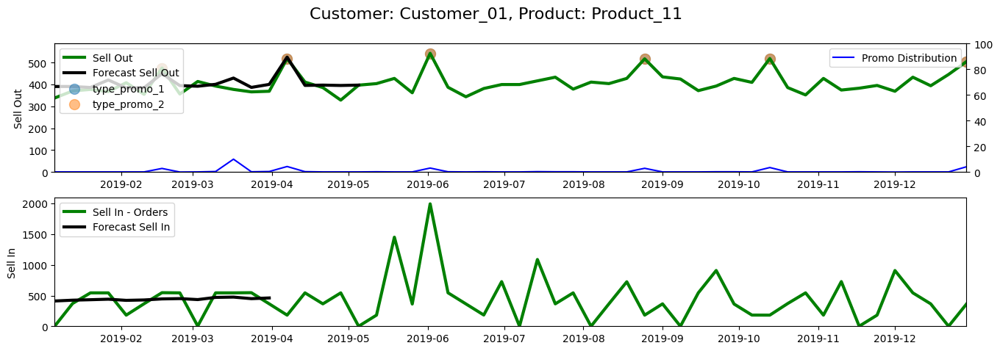

In [38]:
for idx in range(biggest_products.shape[0])[:20]:
    prod = ((dataset_copied[['customer_name', 'product_group']]==biggest_products.iloc[idx, :2]).all(axis=1))
    fig = plt.figure(figsize=(16, 5))
    fig.suptitle(f'Customer: {biggest_products.iloc[idx, 0]}, Product: {biggest_products.iloc[idx, 1]}', fontsize=16)
    
    ### Add Sell Out if Scenario 1 or 3 ##
    if (scenario==1)|(scenario==3):
        ##### Plot Sell Out ##
        ax1 = fig.add_subplot(211)
        ax1.plot(dataset_copied.loc[prod, 'PERIOD_TAG'],
                 dataset_copied.loc[prod, 'Sellout'],
                 color='green', label='Sell Out', linewidth=3)
        ### Forecast Sell Out
        sellout_forecast = dataset_copied.loc[((prod)&(dataset_copied['PERIOD_TAG']=='2018-12-30')),
                                              'Prediction_Sellout_1W':f'Prediction_Sellout_{sellout_w}W'].copy()
        sellout_forecast = sellout_forecast.T
        sellout_forecast.index = pd.date_range(start='2019-01-06', periods=sellout_w, freq='7D')
        sellout_forecast.columns = ['Forecast_Sellout']
        ax1.plot(sellout_forecast['Forecast_Sellout'],
                 color='black', label='Forecast Sell Out', linewidth=3)

        ax1.set_ylabel('Sell Out')
    
    ### Add promo if Scenario 1 ##
        if scenario==1:
            ax2 = ax1.twinx()
            ax2.plot(dataset_copied.loc[prod, 'PERIOD_TAG'],
                     dataset_copied.loc[prod, 'numeric_distribution_selling_promotion'], 
                     color='blue', label='Promo Distribution')
            ax1.scatter(dataset_copied.loc[(prod)&(dataset_copied['type_promo_1']==1), 'PERIOD_TAG'], 
                        dataset_copied.loc[(prod)&(dataset_copied['type_promo_1']==1), 'Sellout'],
                        label='type_promo_1', alpha=0.5, s=100)
            ax1.scatter(dataset_copied.loc[(prod)&(dataset_copied['type_promo_2']==1), 'PERIOD_TAG'], 
                        dataset_copied.loc[(prod)&(dataset_copied['type_promo_2']==1), 'Sellout'],
                        label='type_promo_2', alpha=0.5, s=100)
            ax2.set_ylim([0, 100])
            ax2.legend(loc='upper right')
    
        ax1.set_xlim([dataset_copied.loc[((prod)&(dataset_copied['PERIOD_TAG']>='2019-01-01')), 'PERIOD_TAG'].min(),
                      dataset_copied.loc[((prod)&(dataset_copied['PERIOD_TAG']<'2020-01-01')), 'PERIOD_TAG'].max()])
        ax1.set_ylim(ymin=0)
        ax1.legend(loc='upper left')
    ##### Plot Sell In ##
    if (scenario==1)|(scenario==3):
        ax1 = fig.add_subplot(212)
    else:
        ax1 = fig.add_subplot(111)
    ax1.plot(dataset_copied.loc[prod, 'PERIOD_TAG'],
             dataset_copied.loc[prod, 'orders_SellIn'],
             color='green', label='Sell In - Orders', linewidth=3)
    ### Forecast Sell In
    sellin_forecast = dataset_copied.loc[((prod)&(dataset_copied['PERIOD_TAG']=='2018-12-30')),
                                      'Prediction_orders_SellIn_1W':].copy()
    sellin_forecast = sellin_forecast.T
    sellin_forecast.index = pd.date_range(start='2019-01-06', periods=sellin_w, freq='7D')
    sellin_forecast.columns = ['Forecast_SellIn']
    ax1.plot(sellin_forecast['Forecast_SellIn'],
             color='black', label='Forecast Sell In', linewidth=3)
    
    ### Add promo if Scenario 2 ##
    if scenario==2:
        ax2 = ax1.twinx()
        ax2.plot(dataset_copied.loc[prod, 'PERIOD_TAG'], dataset_copied.loc[prod, 'Distribution'], 
                 color='blue', label='Promo Distribution')
        ax2.scatter(dataset_copied.loc[(prod)&(dataset_copied['type_promo_1']==1), 'PERIOD_TAG'], 
                    dataset_copied.loc[(prod)&(dataset_copied['type_promo_1']==1), 'OP']*95,
                    label='type_promo_1', alpha=0.5, s=75)
        ax2.scatter(dataset_copied.loc[(prod)&(dataset_copied['type_promo_2']==1), 'PERIOD_TAG'], 
                    dataset_copied.loc[(prod)&(dataset_copied['type_promo_2']==1), 'H']*90,
                    label='type_promo_2', alpha=0.5, s=75)
        ax2.set_ylim([0, 100])
        ax2.legend(loc='upper right')
    
    ax1.set_ylabel('Sell In')
    ax1.set_xlim([dataset_copied.loc[((prod)&(dataset_copied['PERIOD_TAG']>='2019-01-01')), 'PERIOD_TAG'].min(),
                  dataset_copied.loc[((prod)&(dataset_copied['PERIOD_TAG']<'2020-01-01')), 'PERIOD_TAG'].max()])
    ax1.set_ylim(ymin=0)
    ax1.legend(loc='upper left')
    ################################################################################################
    plt.show()

THE END